# IMPORTS

In [1]:
#basics
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import MaxNLocator

#sklearn
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
#from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
#from sklearn.preprocessing import PolynomialFeatures
#from sklearn import set_config
from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
from sklearn.base import clone
from sklearn.compose import TransformedTargetRegressor
#from sklearn.linear_model import MultiTaskLasso
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
#from sklearn.linear_model import MultiTaskElasticNet


# feature engine
from feature_engine.timeseries.forecasting import LagFeatures
from feature_engine.timeseries.forecasting import WindowFeatures
from feature_engine.timeseries.forecasting import ExpandingWindowFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.selection import DropFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.creation import CyclicalFeatures


# light GBM
from lightgbm import LGBMRegressor

# sktime
from sktime.transformations.series.time_since import TimeSince


# statsmodels
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import ccf
from statsmodels.tsa.seasonal import STL

# optuna and other optimizatopm
import optuna

#
import time

#
from joblib import Parallel, delayed

In [2]:
import sys
sys.path.append("src")   # VERY IMPORTANT

In [3]:
# helper function imports & Class
from basic_helper_functions import seperate_target_plot
from basic_helper_functions import seperate_predictor_plot
from basic_helper_functions import plot_clean_plot

from Feature_Engineering_Multi import GOR_WCUT_Transformer
from Feature_Engineering_Multi import plot_ccf,lag_plot 
from Feature_Engineering_Multi import MultiPhaseMultiOutputLassoSelectedLagFeatureAdder

from Feature_Engineering_Multi import TrendFeatureAdder
from Feature_Engineering_Multi import AddSelectedCalendarFourierFeaturesMultiPhase
from Feature_Engineering_Multi import ProductionCurveFeatureAdder
from Feature_Engineering_Multi import AddSpecificLag1Features

#from Machine_Learning_Multi import recursive_forecast_multiphase
#from Machine_Learning_Multi import walk_forward_recursive_forecast_multiphase
#from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics
#from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics
#from Machine_Learning_Multi import _unwrap_outer_model
#from Machine_Learning_Multi import _unwrap_single_target_estimator
#from Machine_Learning_Multi import get_multioutput_tree_feature_importance


from Feature_Engineering import AddSelectedCalendarFourierFeatures
from Feature_Engineering import RollingSlopeFeatures
#from Machine_Learning import plot_train_val_predictions_time
#from Machine_Learning import plot_train_val_actual_vs_predicted_crossplot

#from Machine_Learning import create_model_results_table
#from Machine_Learning import add_model_result
#from Machine_Learning import style_model_results_table

from Machine_Learning_Multi import plot_multi_phase_train_val_diagnostics
from Machine_Learning_Multi import recursive_forecast_multiphase
from Machine_Learning_Multi import walk_forward_recursive_forecast_multiphase
from Machine_Learning_Multi import plot_multi_phase_train_walkforward_val_diagnostics

# Load data

In [4]:
# load the data
df = pd.read_csv('processed_inputs/df2.csv',index_col='DATEPRD', parse_dates=True)
#explicitly sets the time frequency of  DatetimeIndex to "Daily" (D).
df.asfreq('D')
# drop ,'GOR_MSCF_STB', 'WCUT. I calculated this before in my helper function. But i need to calculate as part of a pipeline. so i will need to drop it
df = df.drop(columns=['GOR_MSCF_STB', 'WCUT'])

In [5]:
(df.columns,len(df.columns))

(Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
        'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
        'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
        'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'BORE_WI_VOL_STB_D', 'AVG_WHT_P', 'BORE_OIL_VOL_STB_D',
        'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
       dtype='object'),
 23)

# Preprocessing

In the preprocessing I am going to:
1. Remove all columns that have zeros or nan greater than 50% of the data
2. Make negative values zero
3. Then if any columns have nan, prints the column and the nan and then do linear interpolation

how many nans before cleaning
WELL_BORE_CODE                   0
NPD_WELL_BORE_CODE               0
NPD_WELL_BORE_NAME               0
NPD_FIELD_CODE                   0
NPD_FIELD_NAME                   0
NPD_FACILITY_CODE                0
NPD_FACILITY_NAME                0
ON_STREAM_HRS                    0
AVG_CHOKE_SIZE_P                 2
AVG_CHOKE_UOM                    0
FLOW_KIND                        0
WELL_TYPE                        0
AVG_DOWNHOLE_PRESSURE_PSI        6
AVG_DOWNHOLE_TEMPERATURE_F       6
AVG_DP_TUBING_PSI                6
AVG_ANNULUS_PRESS_PSI            6
DP_CHOKE_SIZE_PSI                6
AVG_WHP_P_PSI                    6
BORE_WI_VOL_STB_D             1165
AVG_WHT_P                        6
BORE_OIL_VOL_STB_D               0
BORE_GAS_VOL_MSCF_D              0
BORE_WAT_VOL_STB_D               0
dtype: int64
Plot before cleaning


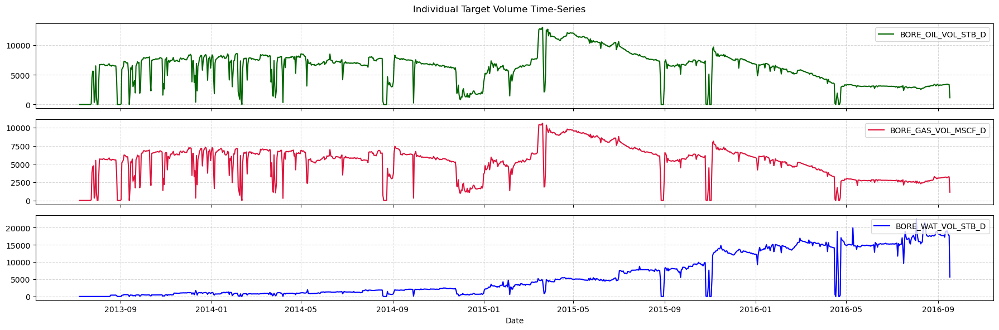

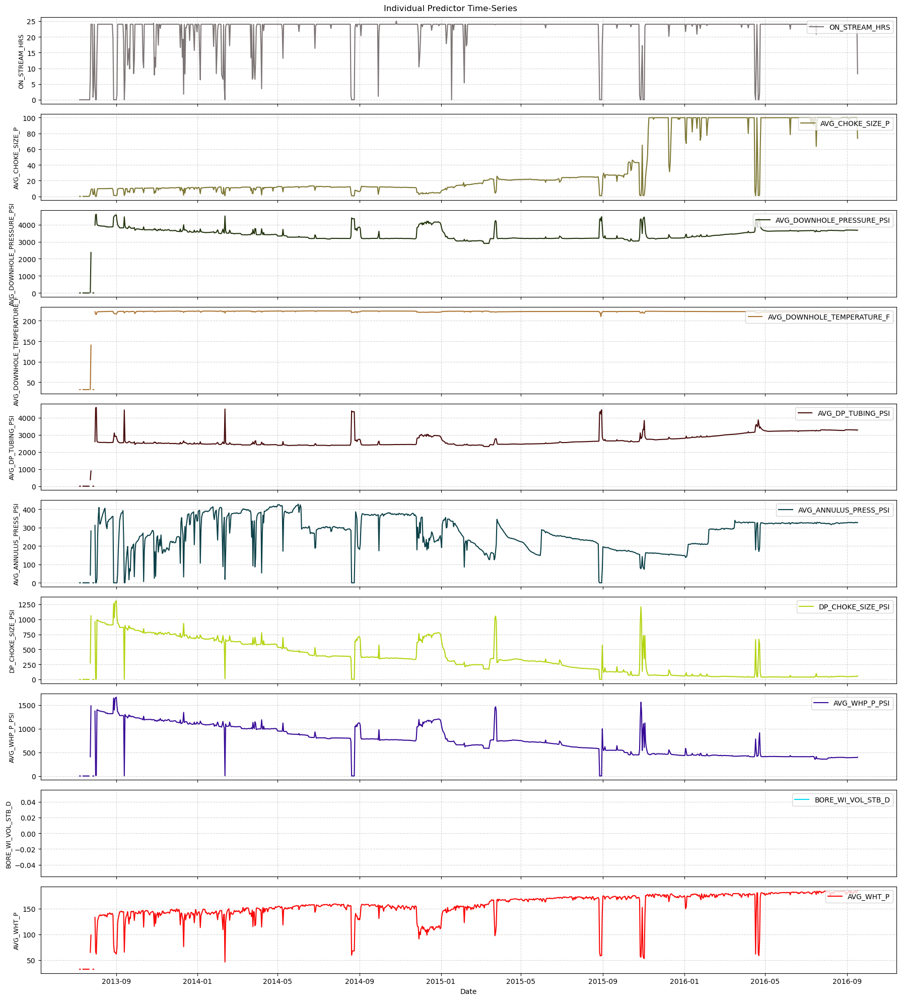

Cleaning data
The length of the dataframe before cleaning is 1165
Deleted columns with nan greater than 50% of the total data: ['BORE_WI_VOL_STB_D']
Deleted columns with zero greater than 50% of the total data: []
Before cleaning, AVG_CHOKE_SIZE_P has 2 NaNs
Before cleaning, AVG_DOWNHOLE_PRESSURE_PSI has 6 NaNs
Before cleaning, AVG_DOWNHOLE_TEMPERATURE_F has 6 NaNs
Before cleaning, AVG_DP_TUBING_PSI has 6 NaNs
Before cleaning, AVG_ANNULUS_PRESS_PSI has 6 NaNs
Before cleaning, DP_CHOKE_SIZE_PSI has 6 NaNs
Before cleaning, AVG_WHP_P_PSI has 6 NaNs
Before cleaning, AVG_WHT_P has 6 NaNs
how many nans after cleaning
WELL_BORE_CODE                            0
NPD_WELL_BORE_CODE                        0
NPD_WELL_BORE_NAME                        0
NPD_FIELD_CODE                            0
NPD_FIELD_NAME                            0
NPD_FACILITY_CODE                         0
NPD_FACILITY_NAME                         0
ON_STREAM_HRS                             0
AVG_CHOKE_SIZE_P             

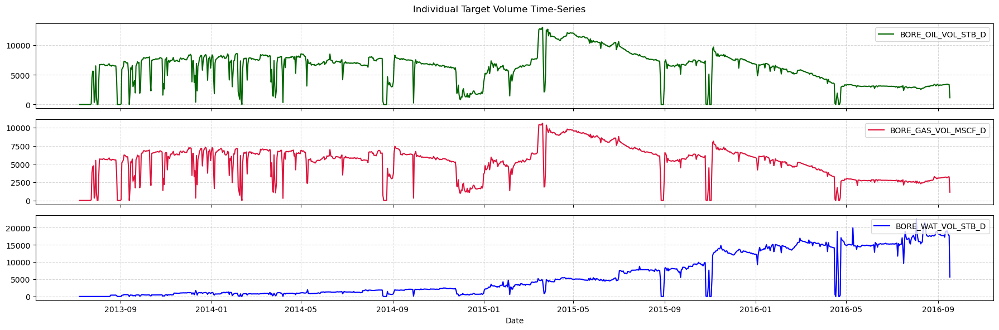

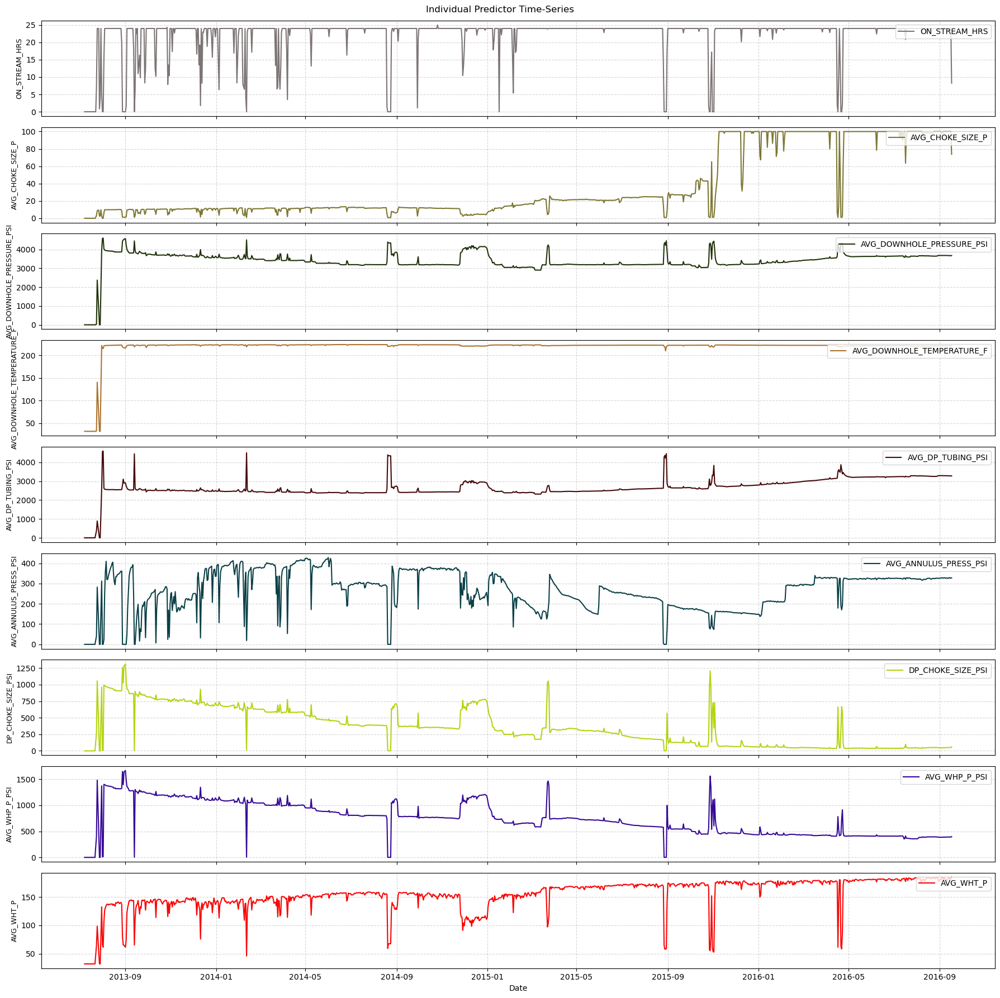

In [6]:
# dropped_nan_cols columns that have nan with more than 50% 
# dropped_zero_cols columns that have zeros with more than 50%
#missing_indicator_cols list of columns that tells us the column nan was changed using linear interpolation
#negative_indicator_cols   #list of columns that tells us the columns with negative values was set to zero

df, dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols=plot_clean_plot(df)

In [7]:
df.columns

Index(['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
       'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
       'NPD_FACILITY_NAME', 'ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P',
       'AVG_CHOKE_UOM', 'FLOW_KIND', 'WELL_TYPE', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'AVG_CHOKE_SIZE_P_WAS_MISSING',
       'AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
       'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
       'AVG_DP_TUBING_PSI_WAS_MISSING', 'AVG_ANNULUS_PRESS_PSI_WAS_MISSING',
       'DP_CHOKE_SIZE_PSI_WAS_MISSING', 'AVG_WHP_P_PSI_WAS_MISSING',
       'AVG_WHT_P_WAS_MISSING'],
      dtype='object')

In [8]:
# just to see the columns that were drops
dropped_nan_cols, dropped_zero_cols, missing_indicator_cols, negative_indicator_cols

(['BORE_WI_VOL_STB_D'],
 [],
 ['AVG_CHOKE_SIZE_P_WAS_MISSING',
  'AVG_DOWNHOLE_PRESSURE_PSI_WAS_MISSING',
  'AVG_DOWNHOLE_TEMPERATURE_F_WAS_MISSING',
  'AVG_DP_TUBING_PSI_WAS_MISSING',
  'AVG_ANNULUS_PRESS_PSI_WAS_MISSING',
  'DP_CHOKE_SIZE_PSI_WAS_MISSING',
  'AVG_WHP_P_PSI_WAS_MISSING',
  'AVG_WHT_P_WAS_MISSING'],
 [])

In [9]:
# drop indicator columns
df = df.drop(columns=missing_indicator_cols,errors='ignore')
df = df.drop(columns=negative_indicator_cols,errors='ignore')
df

,WELL_BORE_CODE,NPD_WELL_BORE_CODE,NPD_WELL_BORE_NAME,NPD_FIELD_CODE,NPD_FIELD_NAME,NPD_FACILITY_CODE,NPD_FACILITY_NAME,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_CHOKE_UOM,...,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.00000,0.000000,%,...,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.00000,0.000000,%,...,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.00000,0.000000,%,...,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.00000,0.000000,%,...,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,0.00000,0.000000,%,...,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,100.000000,%,...,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,100.000000,%,...,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,NO 15/9-F-11 H,7078,15/9-F-11,3420717,VOLVE,369304,MÆRSK INSPIRER,24.00000,100.000000,%,...,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


In [10]:
# drop columns not needed
cols_to_drop = ['WELL_BORE_CODE', 'NPD_WELL_BORE_CODE', 'NPD_WELL_BORE_NAME',
                'NPD_FIELD_CODE', 'NPD_FIELD_NAME', 'NPD_FACILITY_CODE',
                'NPD_FACILITY_NAME',"AVG_CHOKE_UOM",'FLOW_KIND', 'WELL_TYPE']
df = df.drop(columns=cols_to_drop,errors='ignore')
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915


In [11]:
#################################################
#
# DROP NONE
#
###################################################


#df.drop(columns=["AVG_CHOKE_SIZE_P"], errors='ignore', inplace=True)
#df

In [12]:
#Find the missing dates
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,
2013-09-20,2013-09-20,2013-09-18,2 days
2014-01-31,2014-01-31,2014-01-29,2 days
2014-02-08,2014-02-08,2014-02-06,2 days


In [13]:
# force reindex to daily
df_daily = df.copy()
df.index = pd.to_datetime(df.index)
df = df.sort_index()

df= df.asfreq("D")

In [14]:
# Find the missing dates again
gap_info = df.index.to_series().diff()

df_gaps = pd.DataFrame({
    "current_date": df.index,
    "previous_date": df.index.to_series().shift(1).values,
    "gap": gap_info.values
}, index=df.index)

df_gaps[df_gaps["gap"] > pd.Timedelta(days=1)]

,current_date,previous_date,gap
DATEPRD,,,


In [15]:
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,
2013-09-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-01-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-02-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# set all nans to zeros
df.fillna(0, inplace=True)
df[df.isna().any(axis=1)]

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D
DATEPRD,,,,,,,,,,,,


In [17]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D'],
      dtype='object')

In [18]:
# drop the choke column to see what happens
#df.drop("AVG_CHOKE_SIZE_P", axis=1, inplace=True)


# Feature Engineering Steps
This steps is for making and testing the pipeline. It uses all the data. Again it is only for making sure the pipepline works

## 1 Calulate GOR and WCUT

In [19]:
GOR_WCUT_feat=GOR_WCUT_Transformer(
        oil_col='BORE_OIL_VOL_STB_D', 
        gas_col='BORE_GAS_VOL_MSCF_D', 
        water_col='BORE_WAT_VOL_STB_D')

In [20]:
# Add the GOR and WCUT to the dataframe.
df = GOR_WCUT_feat.fit_transform(df)

In [21]:
df

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


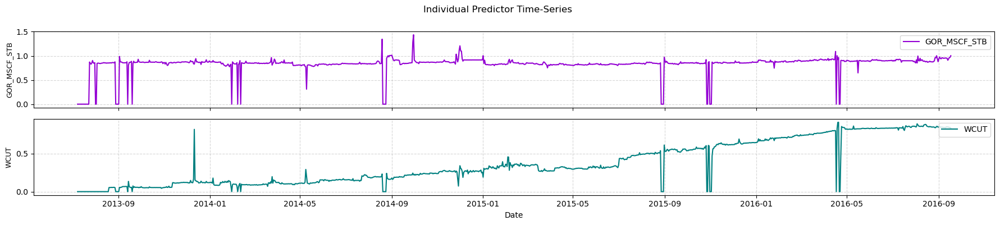

In [22]:
# plot the GOR and WCUT
seperate_predictor_plot(df[["GOR_MSCF_STB","WCUT"]])

In [23]:
df.isnull().sum()

ON_STREAM_HRS                 0
AVG_CHOKE_SIZE_P              0
AVG_DOWNHOLE_PRESSURE_PSI     0
AVG_DOWNHOLE_TEMPERATURE_F    0
AVG_DP_TUBING_PSI             0
AVG_ANNULUS_PRESS_PSI         0
DP_CHOKE_SIZE_PSI             0
AVG_WHP_P_PSI                 0
AVG_WHT_P                     0
BORE_OIL_VOL_STB_D            0
BORE_GAS_VOL_MSCF_D           0
BORE_WAT_VOL_STB_D            0
GOR_MSCF_STB                  0
WCUT                          0
dtype: int64

(df.select_dtypes(include='number') < 0).sum()

## 2 Lag Selection

### 2.1 Seasonal Plots

The selection is just to plot to see what seasonal pattern I see. I going to use this later in 5 where I actually create features for these seasonal patterns

In [24]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

#### Day of the week seasonal pattern

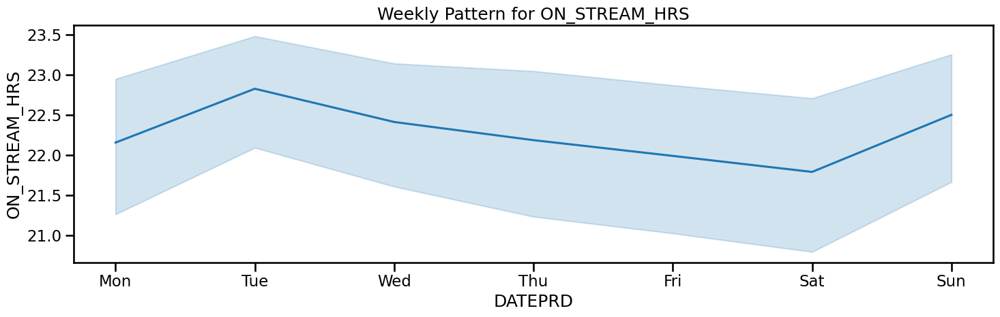

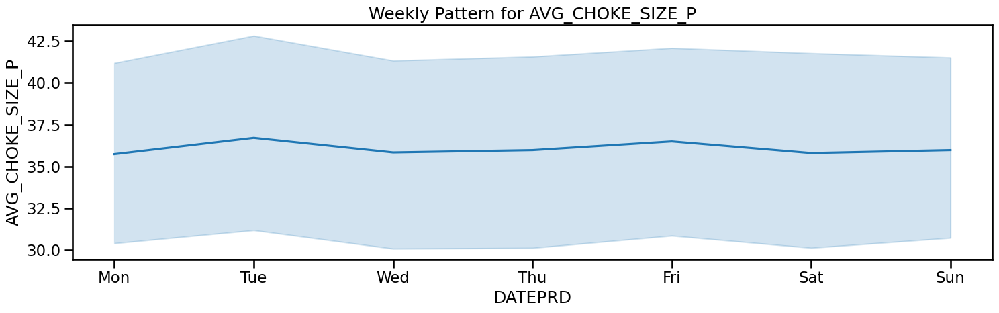

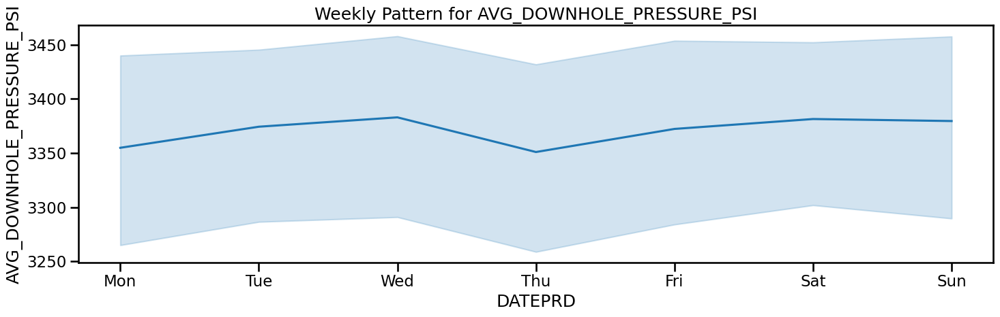

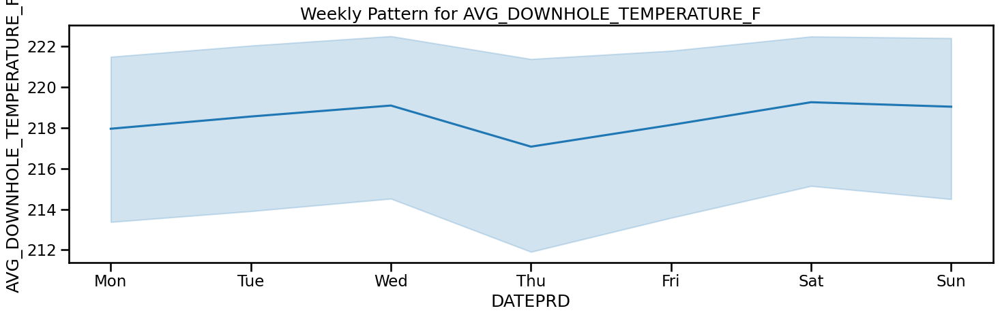

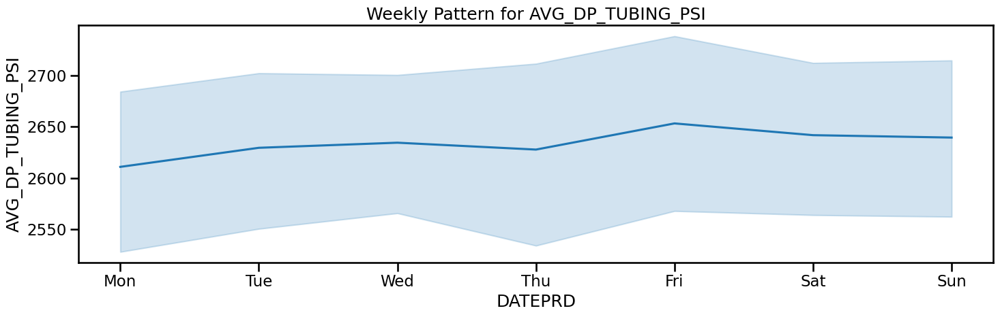

...

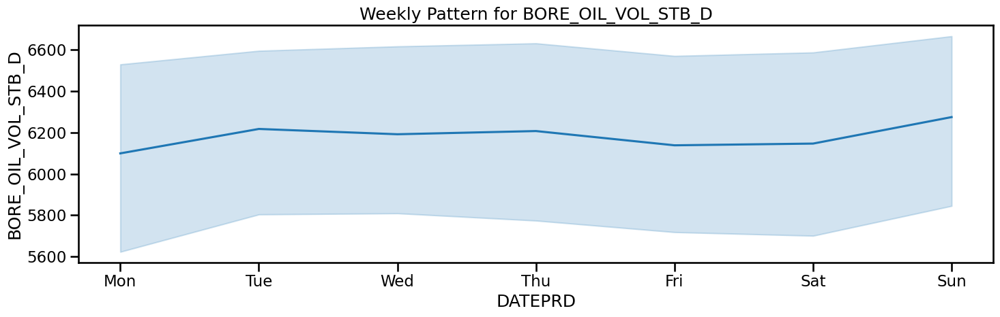

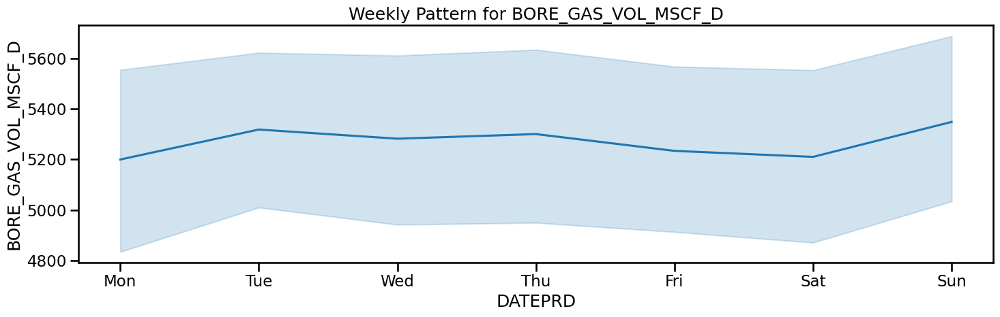

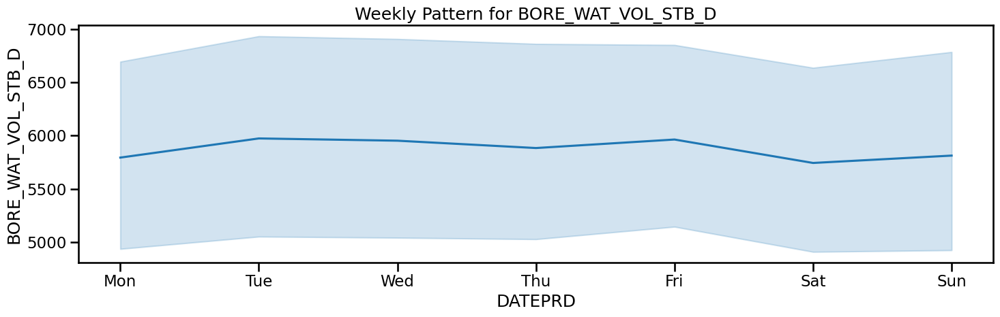

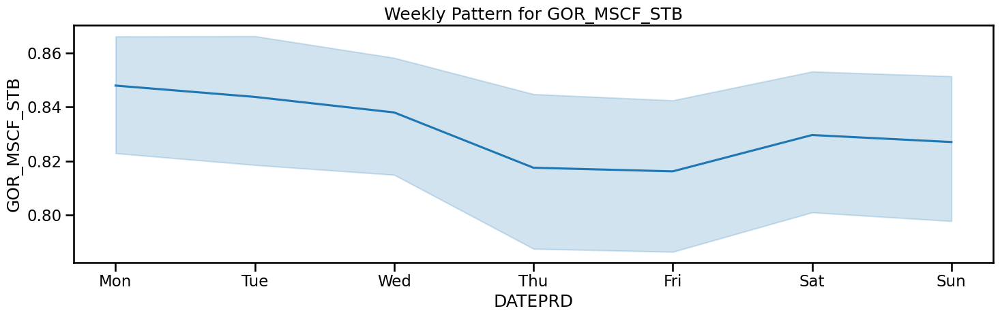

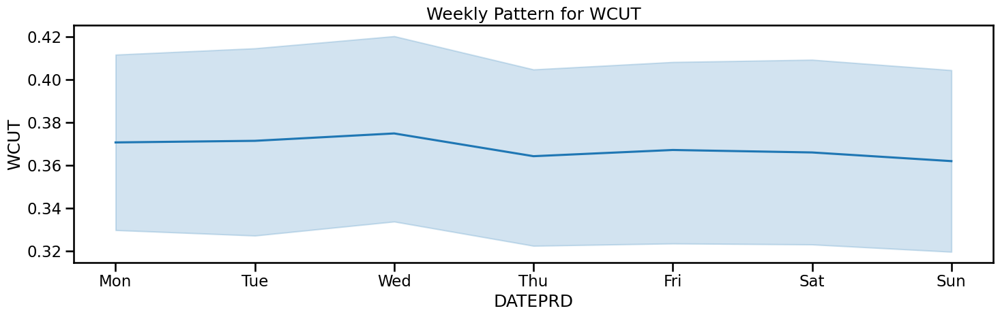

In [25]:
pd.plotting.register_matplotlib_converters()
with sns.plotting_context("talk"):

    for feat in df.columns:
    
        fig, ax = plt.subplots(figsize=[15, 5])
        
        sns.lineplot(x=df.index.dayofweek, y=df[feat], ax=ax)
        ax.set_xticks(range(7))
        ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
        ax.set_title(f"Weekly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()  # Ensures each plot displays sequentially in the loop

I don't think there is a weekly seasonality

####  Month of the year seasonal pattern

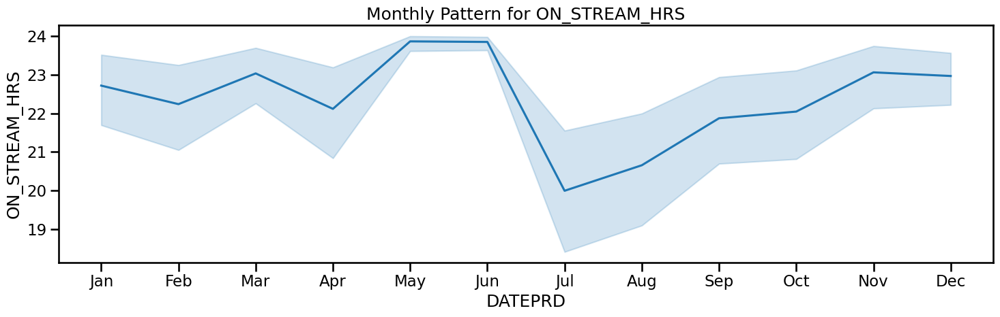

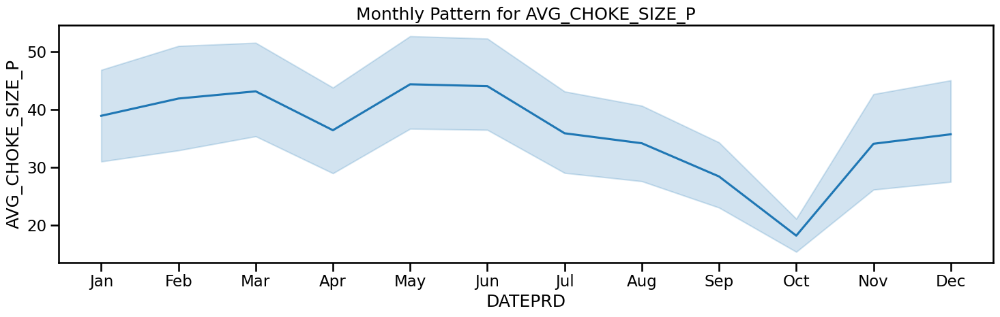

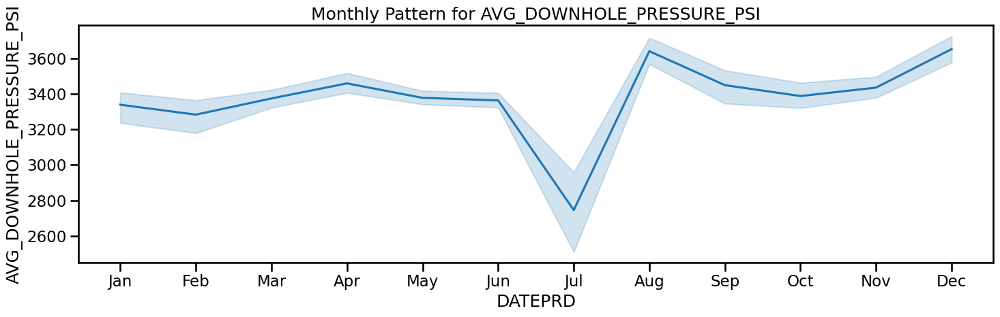

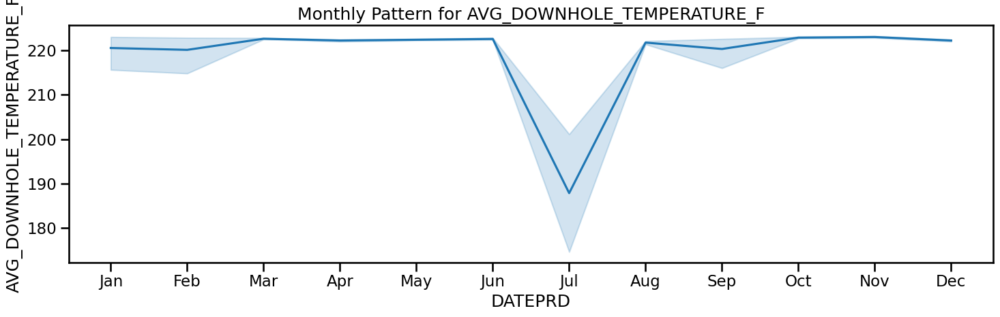

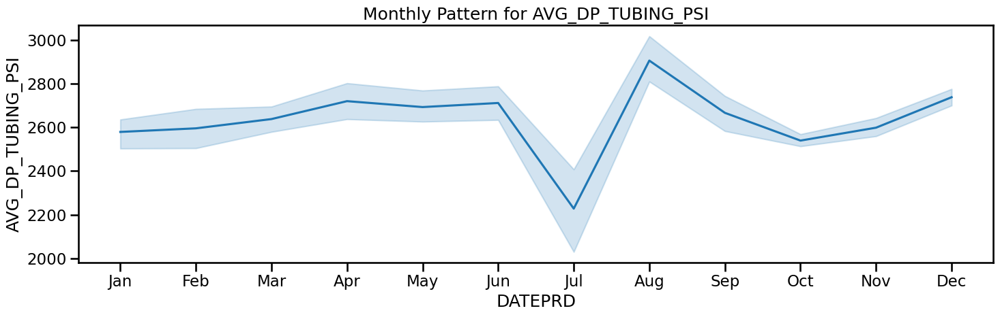

...

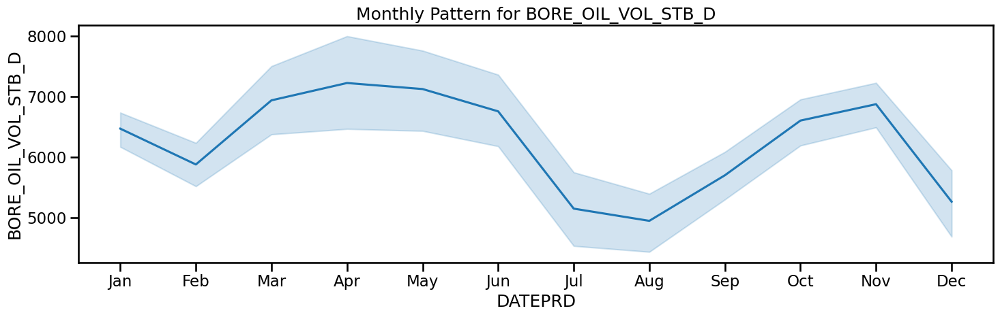

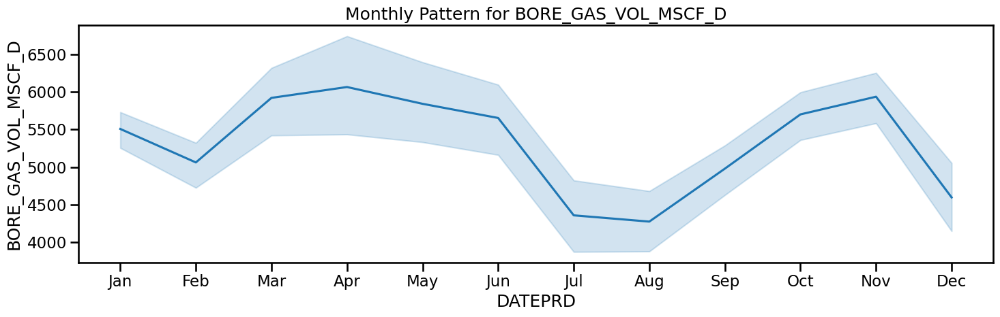

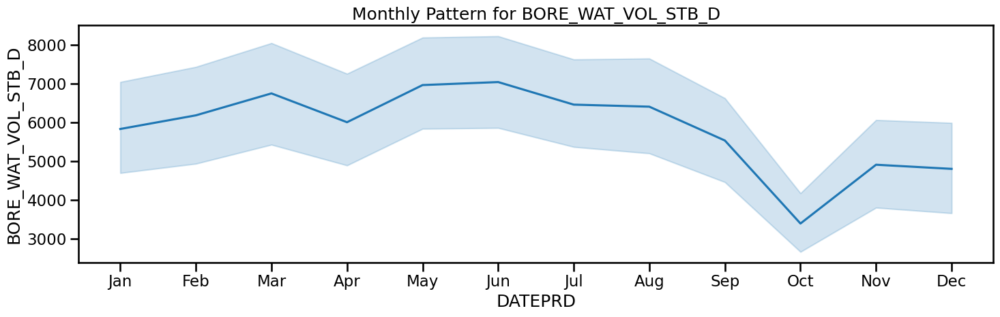

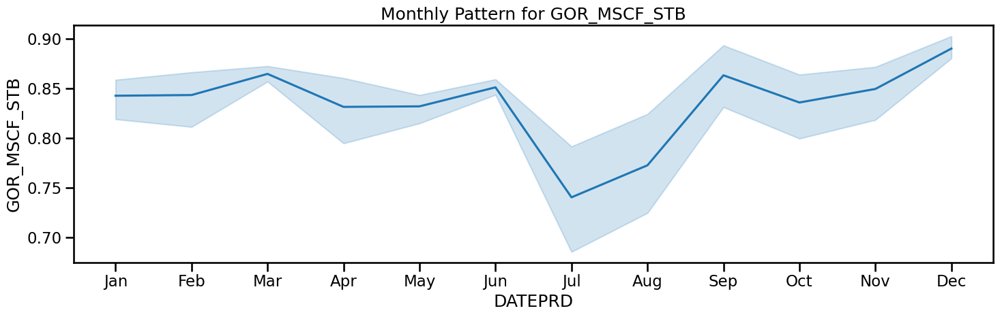

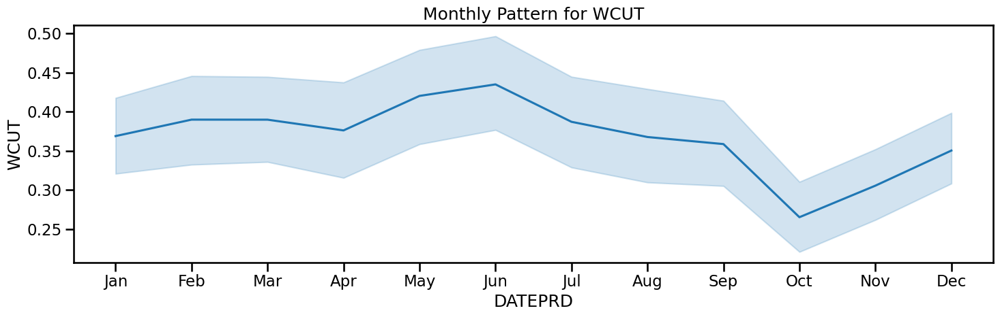

In [26]:
pd.plotting.register_matplotlib_converters()

# Using "talk" context for larger text sizing
with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Change x to df.index.month (values ranging from 1 to 12)
        sns.lineplot(x=df.index.month, y=df[feat], ax=ax)
        
        # 2. Update ticks for 12 months (1 through 12)
        ax.set_xticks(range(1, 13))
        ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                            'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
        
        # 3. Update the title to reflect the monthly trend
        ax.set_title(f"Monthly Pattern for {feat}")
        
        plt.tight_layout()
        plt.show()

TPerhaps a little monthly pattern. 

#### Week of the year seasonal pattern

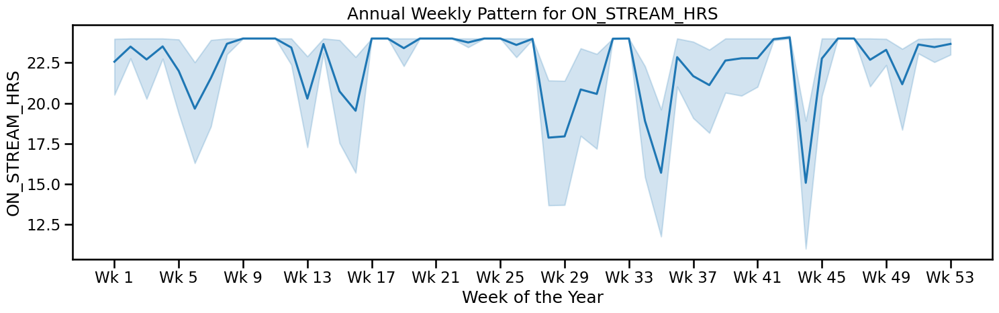

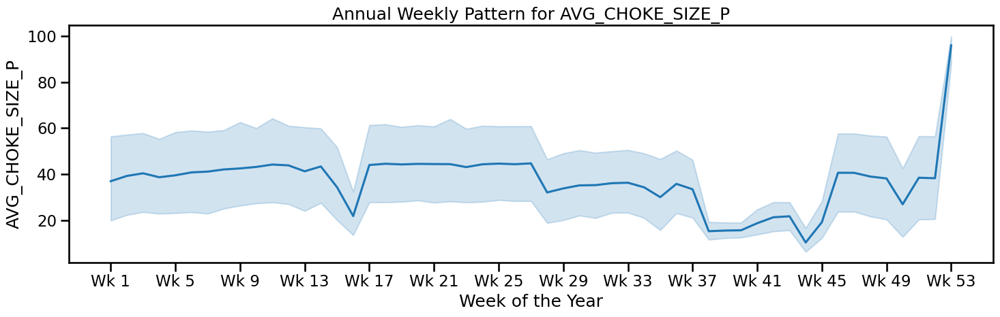

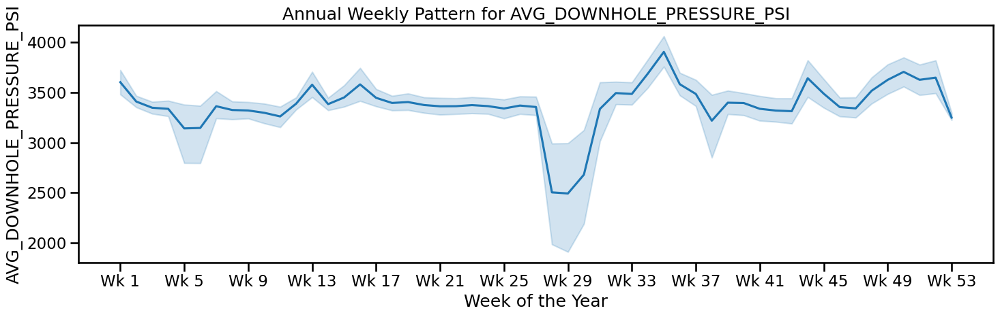

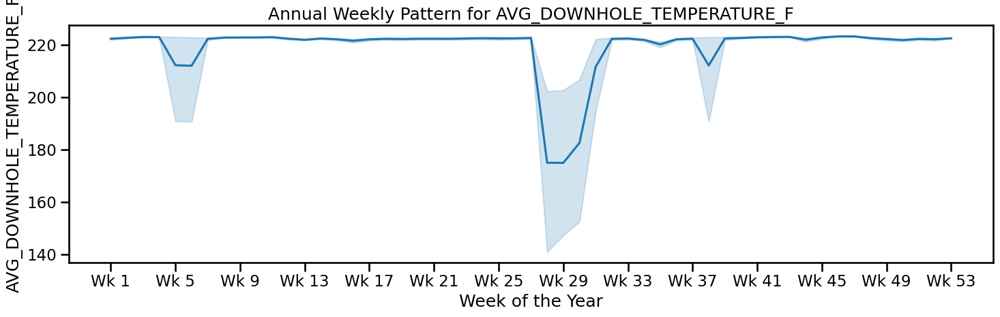

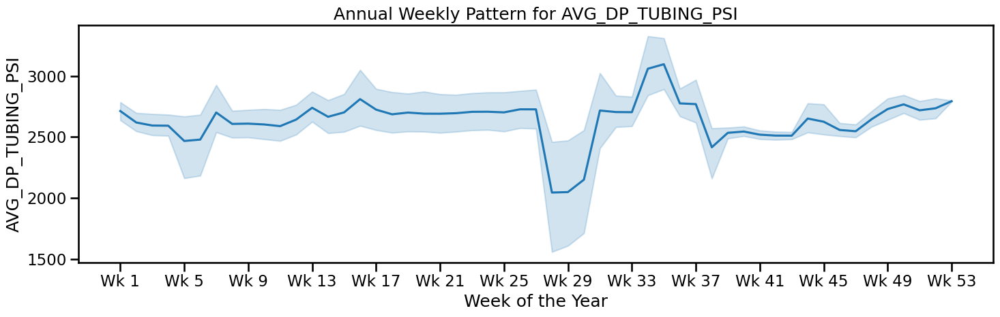

...

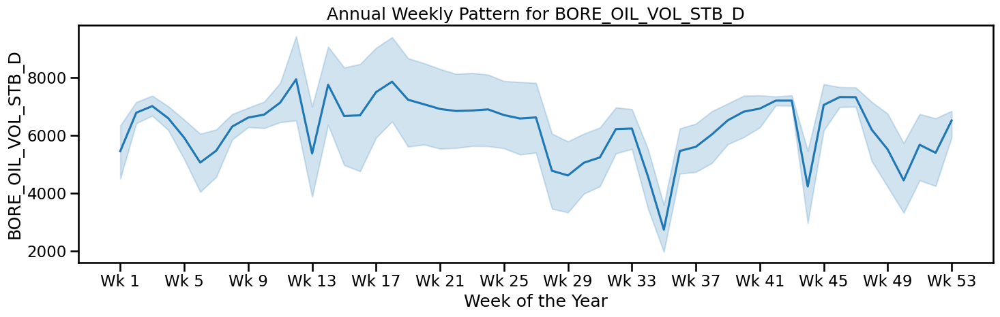

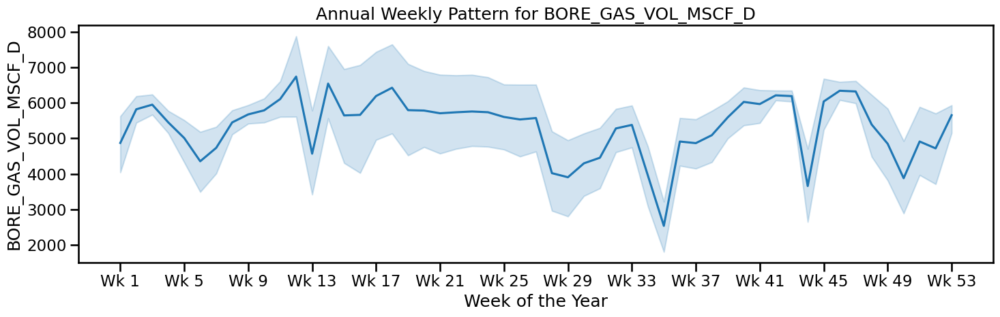

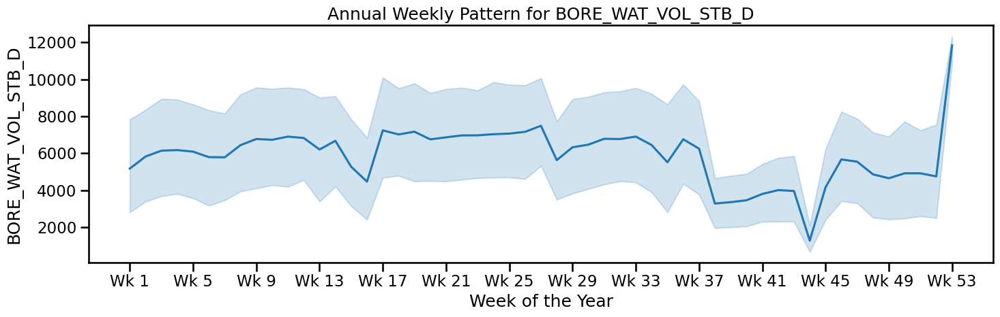

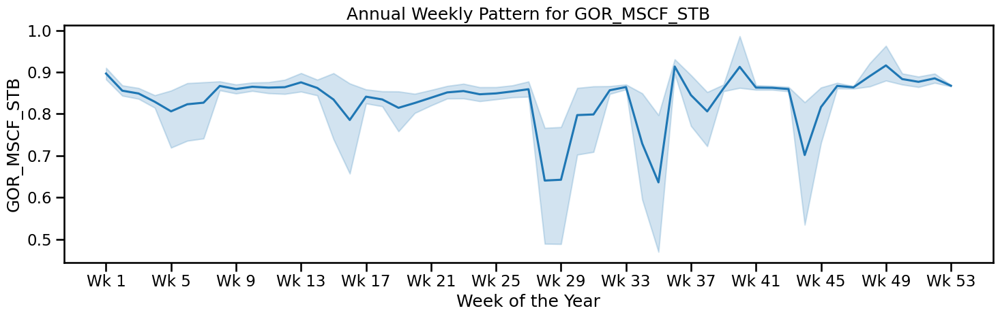

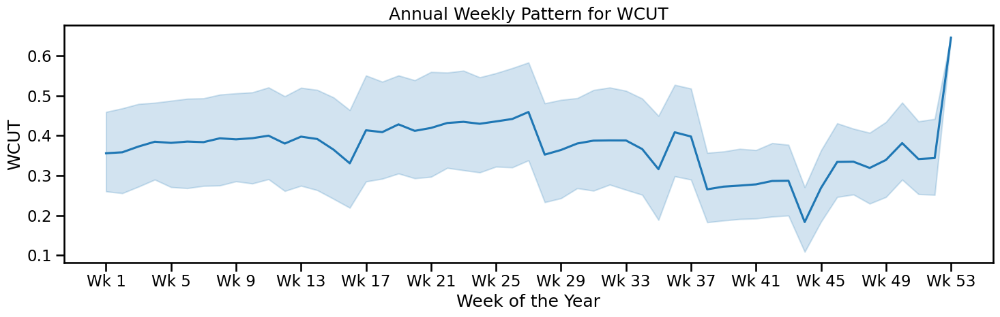

In [27]:
pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use .isocalendar().week to get week numbers (1 to 52/53)
        sns.lineplot(x=df.index.isocalendar().week, y=df[feat], ax=ax)
        
        # 2. Clean up x-axis: label every 4th week so it's readable
        week_ticks = list(range(1, 54, 4))
        ax.set_xticks(week_ticks)
        ax.set_xticklabels([f"Wk {w}" for w in week_ticks])
        
        ax.set_title(f"Annual Weekly Pattern for {feat}")
        ax.set_xlabel("Week of the Year")
        
        plt.tight_layout()
        plt.show()

Perhaps a little

#### Quater of the year seasonal pattern

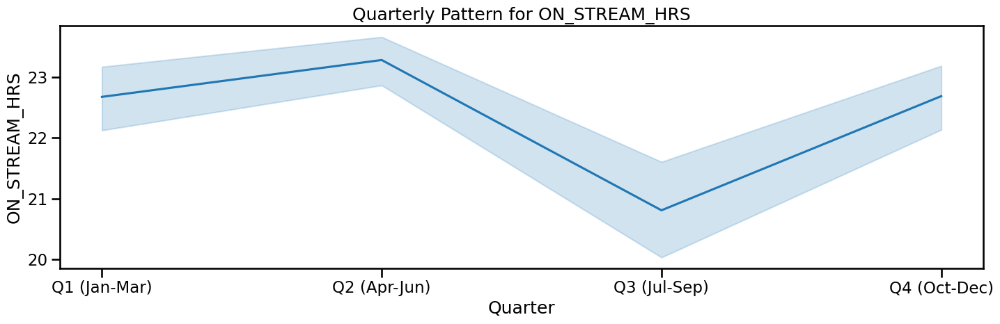

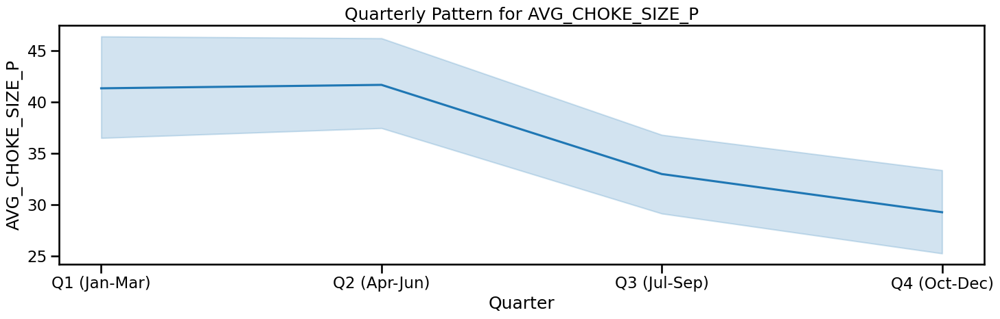

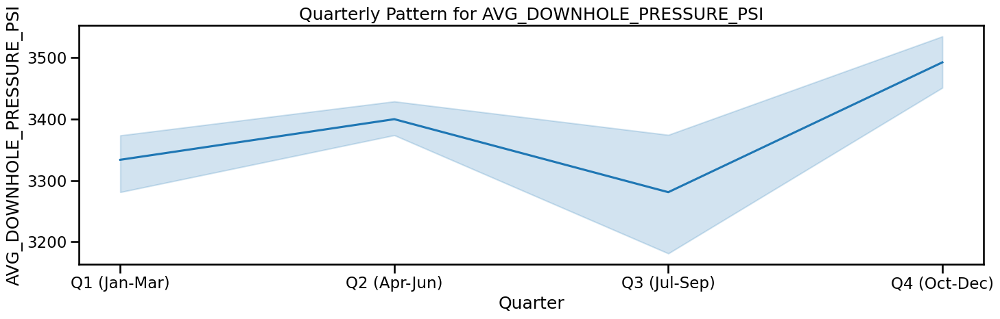

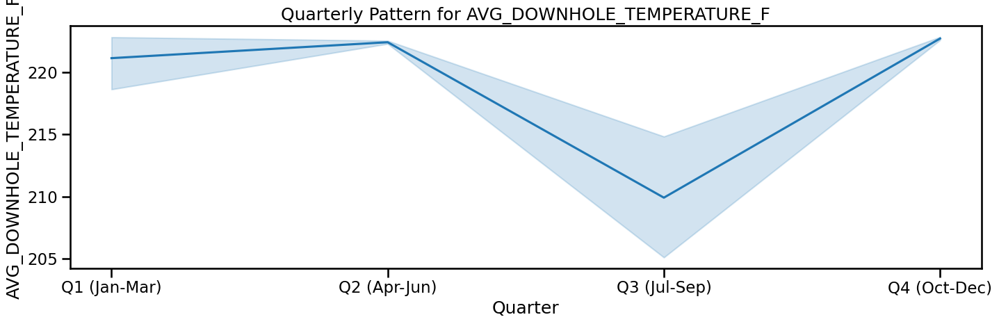

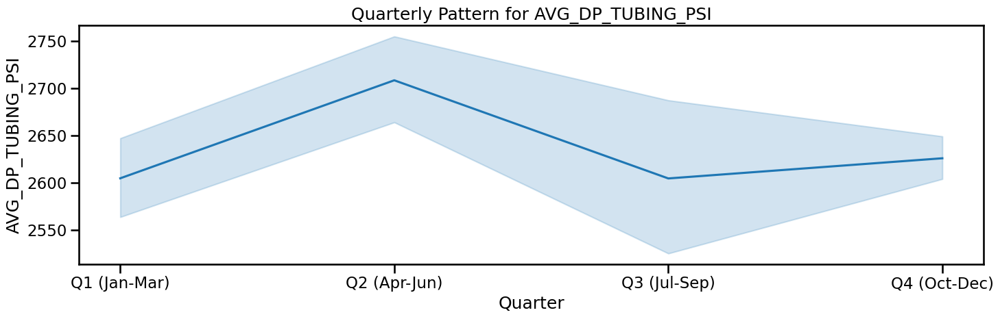

...

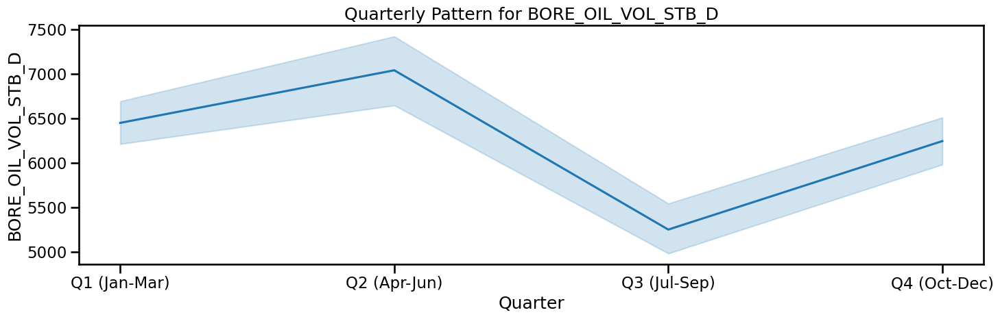

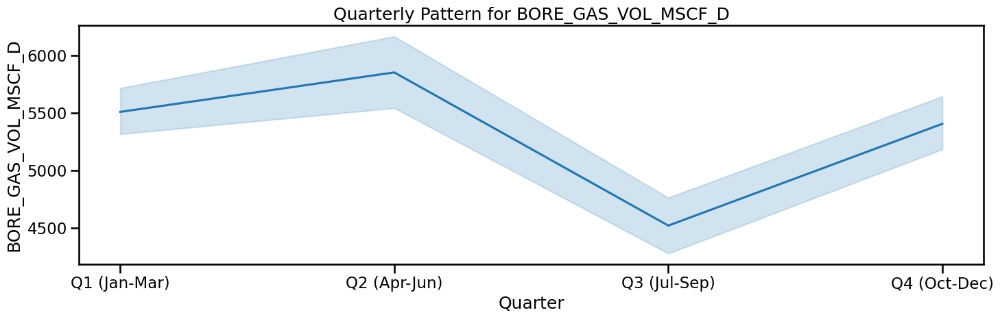

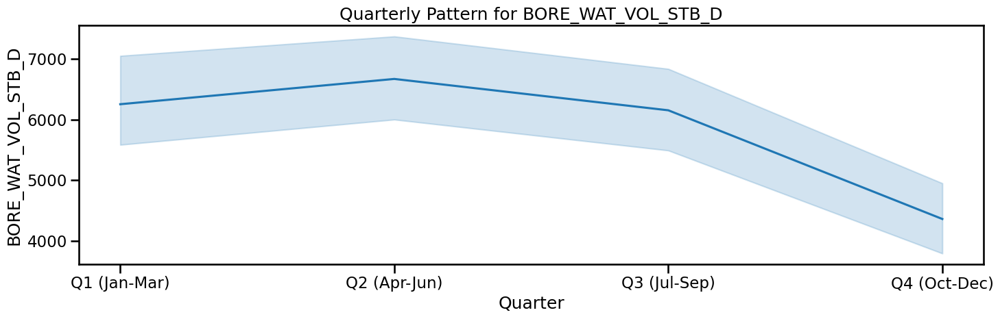

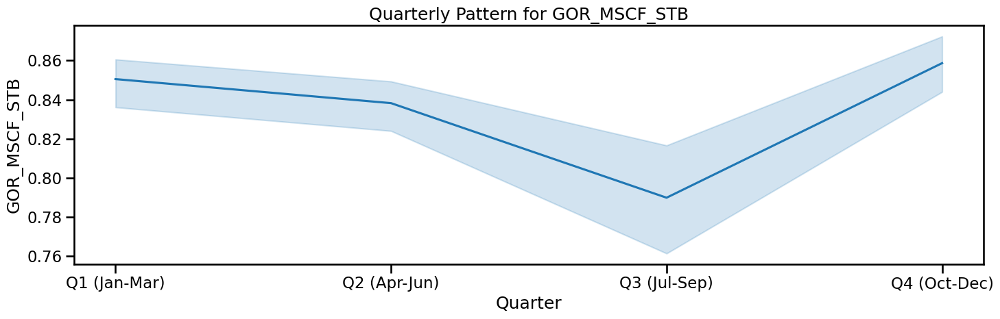

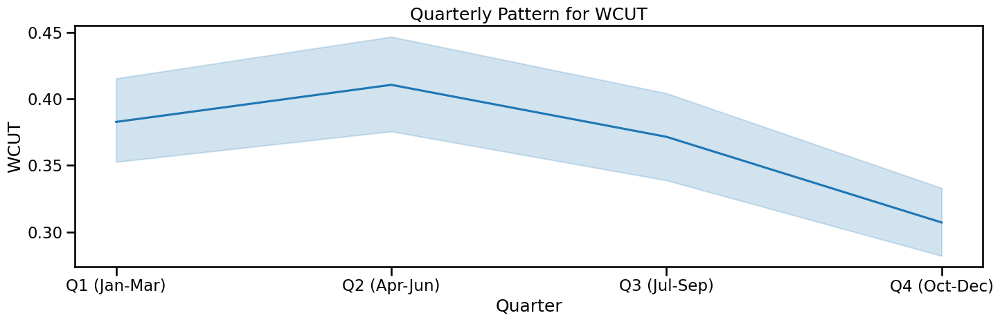

In [28]:

pd.plotting.register_matplotlib_converters()

with sns.plotting_context("talk"):

    for feat in df.columns:
        fig, ax = plt.subplots(figsize=[15, 5])
        
        # 1. Use df.index.quarter to group data into 4 chunks
        sns.lineplot(x=df.index.quarter, y=df[feat], ax=ax)
        
        # 2. Set explicit ticks for the 4 quarters
        ax.set_xticks([1, 2, 3, 4])
        ax.set_xticklabels(['Q1 (Jan-Mar)', 'Q2 (Apr-Jun)', 'Q3 (Jul-Sep)', 'Q4 (Oct-Dec)'])
        
        ax.set_title(f"Quarterly Pattern for {feat}")
        ax.set_xlabel("Quarter")
        
        plt.tight_layout()
        plt.show()

A little but not as much

### 2.2 ACF & PACF To pick lags

I am going to use this to plot the ACF anad PACF and manually pick the lags. and force keep these lags in the lasso selector

In [29]:
df_acf_pacf=df.copy()

In [30]:
df_acf_pacf

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


#### ACF & PACF for oil

##### without removing tend or seasonality
This is not too import to look at

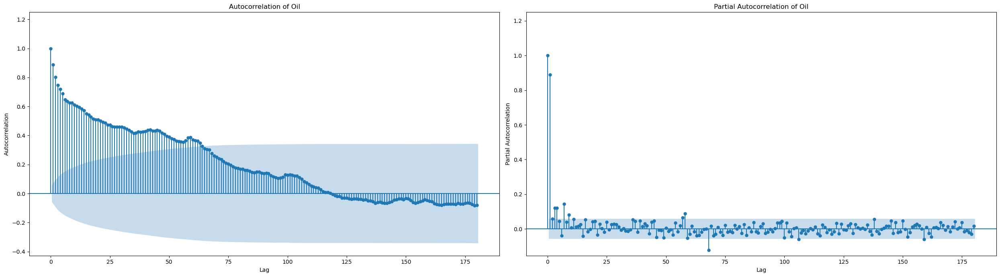

In [31]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Oil")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_OIL_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Oil")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend
This is not too import to look at

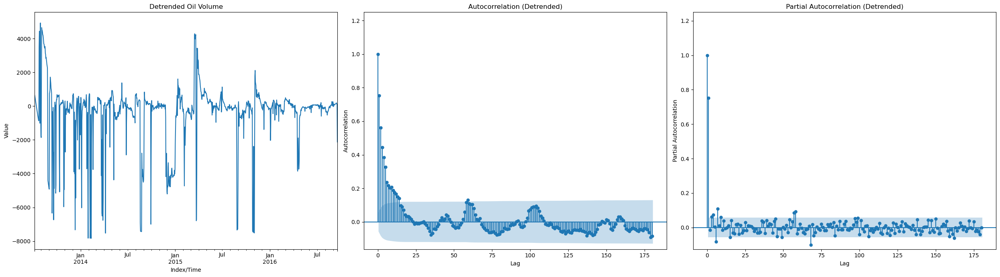

In [32]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_OIL_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_oil"] = res[:, 1]
df_acf_pacf["y_oil_detrend"] = df_acf_pacf["BORE_OIL_VOL_STB_D"] - df_acf_pacf["lowess_oil"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_oil_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Oil Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_oil_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_oil_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

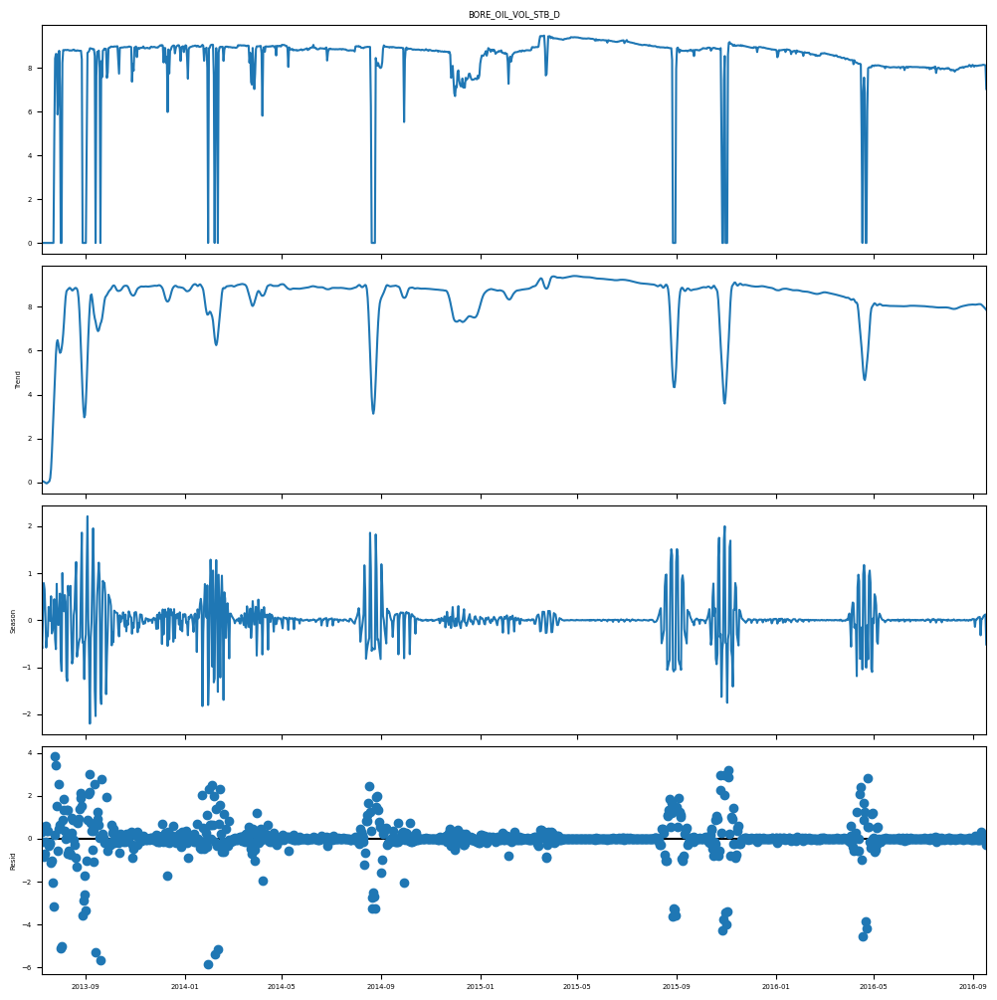

In [33]:
# Break the timeseries into trend, seasonality, and residual components
#res_oil = STL(np.log1p(df_acf_pacf["BORE_OIL_VOL_STB_D"])).fit()
res_oil = STL(np.log1p(df_acf_pacf["BORE_OIL_VOL_STB_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_oil.plot();

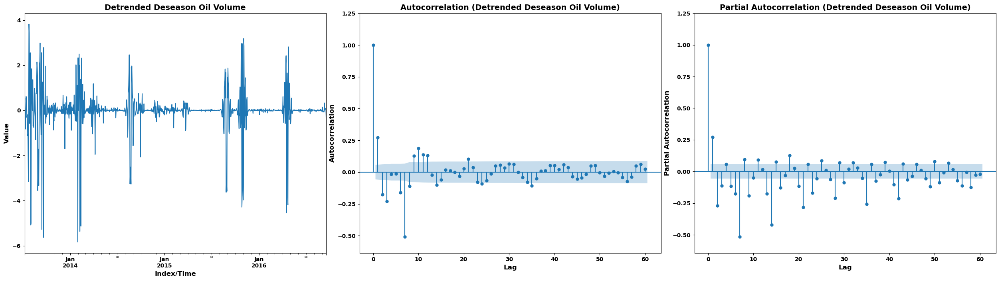

In [34]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Oil Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_oil.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_oil.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Oil Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season:

#### ACF & PACF for gas

##### without removing tend or seasonality

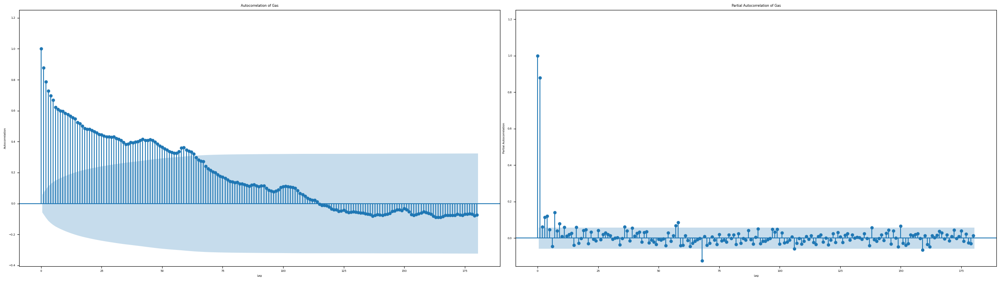

In [35]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Gas")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_GAS_VOL_MSCF_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Gas")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

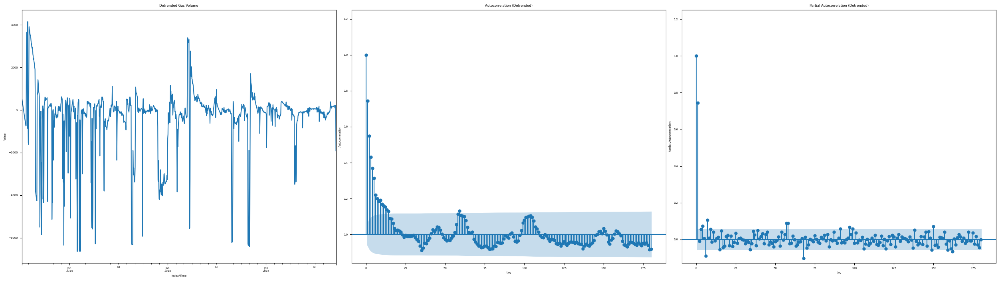

In [36]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_GAS_VOL_MSCF_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_gas"] = res[:, 1]
df_acf_pacf["y_gas_detrend"] = df_acf_pacf["BORE_GAS_VOL_MSCF_D"] - df_acf_pacf["lowess_gas"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_gas_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Gas Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_gas_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_gas_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

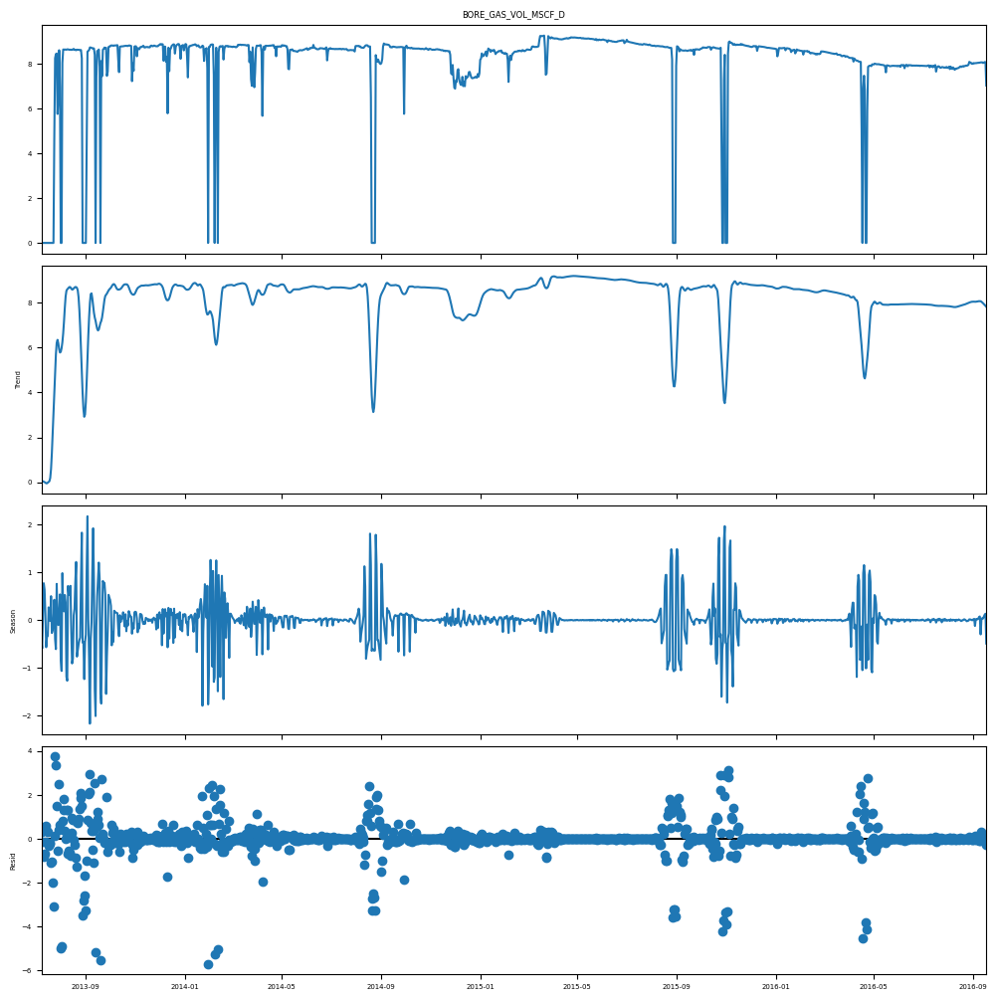

In [37]:
# Break the timeseries into trend, seasonality, and residual components
res_gas = STL(np.log1p(df_acf_pacf["BORE_GAS_VOL_MSCF_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_gas.plot();

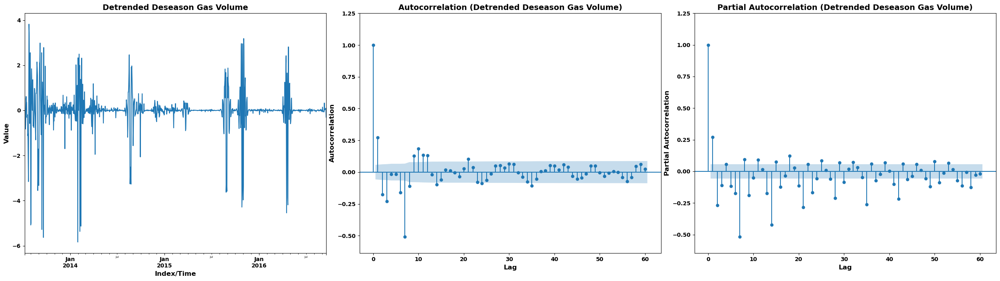

In [38]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_oil.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Gas Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_gas.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_gas.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Gas Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

after removing the trend and the season, i should use a Lag of :

#### ACF & PACF for water

##### without removing tend or seasonality

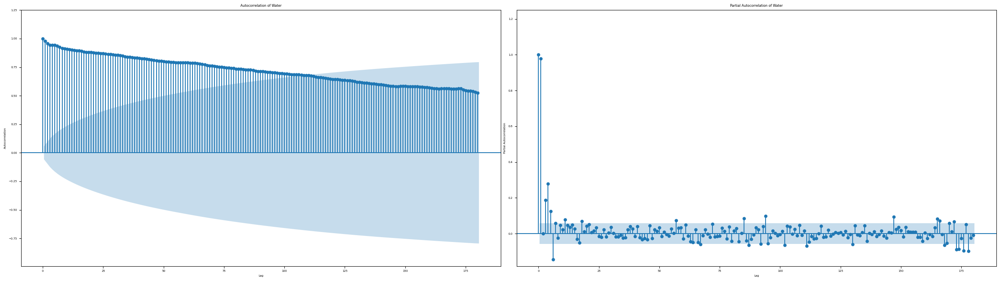

In [39]:

# Create a single figure with 1 row and 2 columns
fig, axes = plt.subplots(1, 2, figsize=[25, 7])

# 1. Plot ACF on the first axis (axes[0])
plot_acf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    lags=180,
    ax=axes[0],
    alpha=0.05,
    auto_ylims=True
)
axes[0].set_title("Autocorrelation of Water")
axes[0].set_ylabel("Autocorrelation")
axes[0].set_xlabel("Lag")

# 2. Plot PACF on the second axis (axes[1])
plot_pacf(
    x=df_acf_pacf["BORE_WAT_VOL_STB_D"],
    method='ywmle', 
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Partial Autocorrelation of Water")
axes[1].set_ylabel("Partial Autocorrelation")
axes[1].set_xlabel("Lag")

# Adjust layout so labels don't overlap
plt.tight_layout()
plt.show()

##### detrend

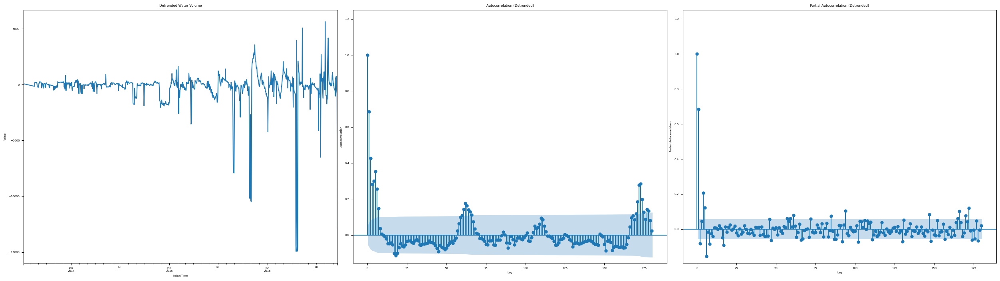

In [40]:
# Compute the trend with LOWESS

# 1. Compute LOWESS and detrend the data
frac = 0.1
y = df_acf_pacf["BORE_WAT_VOL_STB_D"]
x = np.arange(0, len(y))
res = lowess(endog=y, exog=x, frac=frac)
df_acf_pacf["lowess_water"] = res[:, 1]
df_acf_pacf["y_water_detrend"] = df_acf_pacf["BORE_WAT_VOL_STB_D"] - df_acf_pacf["lowess_water"]

# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
df_acf_pacf["y_water_detrend"].plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Water Volume")
axes[0].set_ylabel("Value")
axes[0].set_xlabel("Index/Time")

# Plot 2: ACF
plot_acf(
    x=df_acf_pacf["y_water_detrend"],
    lags=180,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended)")
axes[1].set_ylabel("Autocorrelation")
axes[1].set_xlabel("Lag")

# Plot 3: PACF
plot_pacf(
    x=df_acf_pacf["y_water_detrend"],
    method='ywmle', 
    lags=180,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended)")
axes[2].set_ylabel("Partial Autocorrelation")
axes[2].set_xlabel("Lag")

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### detrend and deseason
I have used a log1p transformation before using the STL function. I should look at these plots the most to select the lags

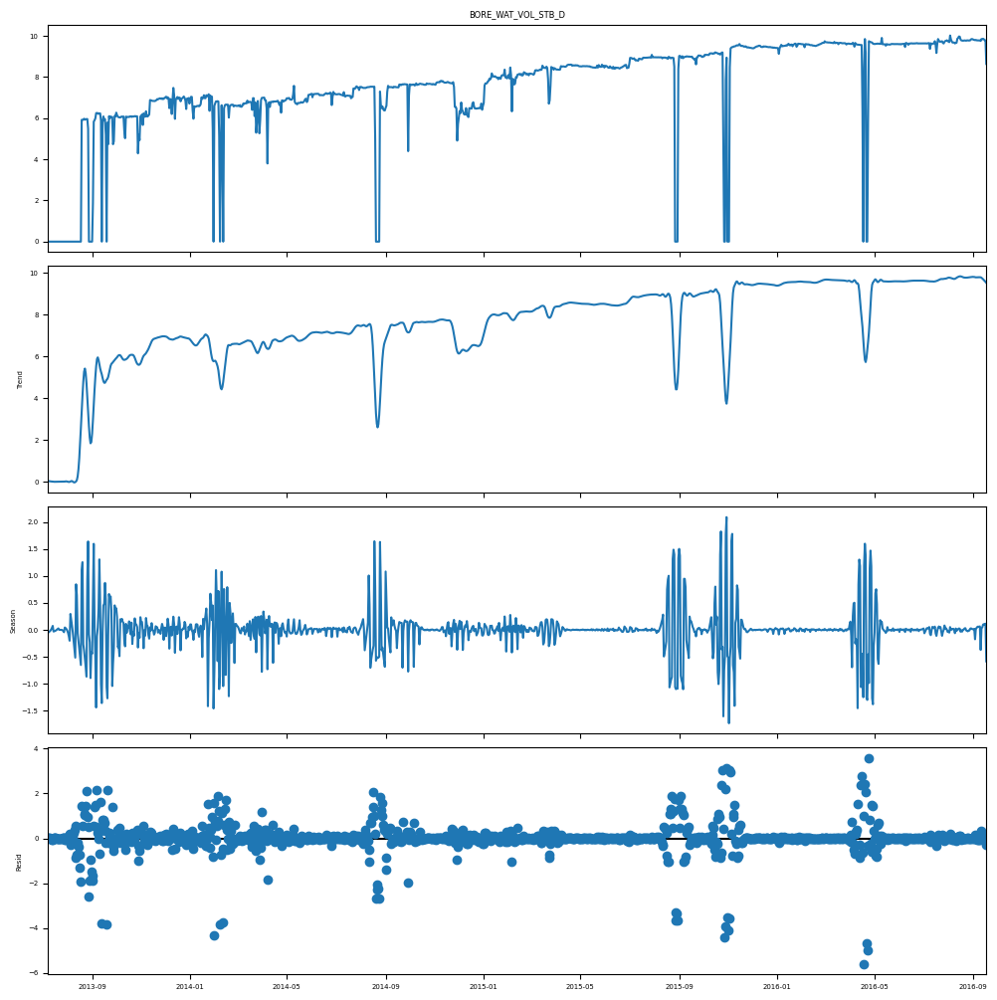

In [41]:
# Break the timeseries into trend, seasonality, and residual components
res_water = STL(np.log1p(df_acf_pacf["BORE_WAT_VOL_STB_D"])).fit()

# Plot the full decomposition
plt.rc("figure", figsize=(10, 10))
plt.rc("font", size=5)
res_water.plot();

In [42]:
# Looking at this there is definitely an issue with the variance

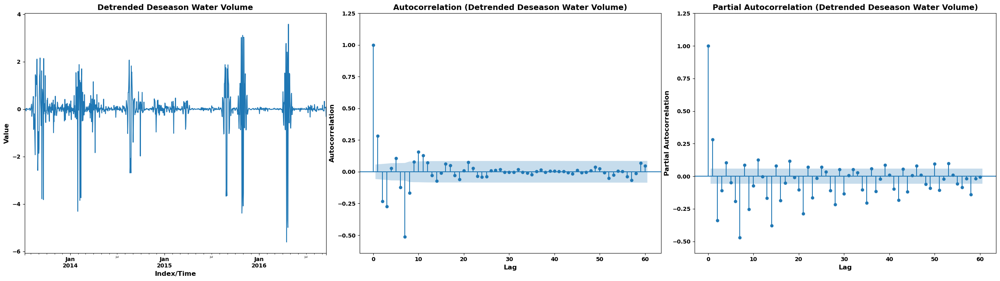

In [43]:
# 2. Setup the grid: 1 row, 3 columns
fig, axes = plt.subplots(1, 3, figsize=[25, 7])

# Plot 1: Detrended Time Series
res_water.resid.plot(ax=axes[0], color='tab:blue')
axes[0].set_title("Detrended Deseason Water Volume", weight='bold', fontsize=14)
axes[0].set_ylabel("Value", weight='bold', fontsize=12)
axes[0].set_xlabel("Index/Time", weight='bold', fontsize=12)

# Plot 2: ACF
plot_acf(
    x=res_water.resid,
    lags=60,
    ax=axes[1],
    alpha=0.05,
    auto_ylims=True
)
axes[1].set_title("Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[1].set_ylabel("Autocorrelation", weight='bold', fontsize=12)
axes[1].set_xlabel("Lag", weight='bold', fontsize=12)

# Plot 3: PACF
plot_pacf(
    x=res_water.resid,
    method='ywmle', 
    lags=60,
    ax=axes[2],
    alpha=0.05,
    auto_ylims=True
)
axes[2].set_title("Partial Autocorrelation (Detrended Deseason Water Volume)", weight='bold', fontsize=14)
axes[2].set_ylabel("Partial Autocorrelation", weight='bold', fontsize=12)
axes[2].set_xlabel("Lag", weight='bold', fontsize=12)

# Loop through all axes to bold the tick numbers correctly
for ax in axes:
    # Set the size via tick_params safely
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Bold the X axis tick labels
    for label in ax.get_xticklabels():
        label.set_weight('bold')
        
    # Bold the Y axis tick labels
    for label in ax.get_yticklabels():
        label.set_weight('bold')

# Adjust spacing and display
plt.tight_layout()
plt.show()

##### Final comments

Looking at all the plots, there is an issue with the variance. I might stabalize the variance in another notebook. Also I am only going to use water lag 1

### 2.3 Cross Correlation plot

I am going to use this to plot  manually pick the lags. and force keep these lags in the lasso selector

In [44]:
df_ccf=df.copy()

In [45]:
stl_results = {}

for col in df_ccf:
    # Store the result in the dictionary using a dynamic key
    stl_results[f"res_{col}"] = STL(np.log1p(df_ccf[col])).fit()

#### CCF for oil

In [46]:
# target
res_oil = STL(np.log1p(df_ccf["BORE_OIL_VOL_STB_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


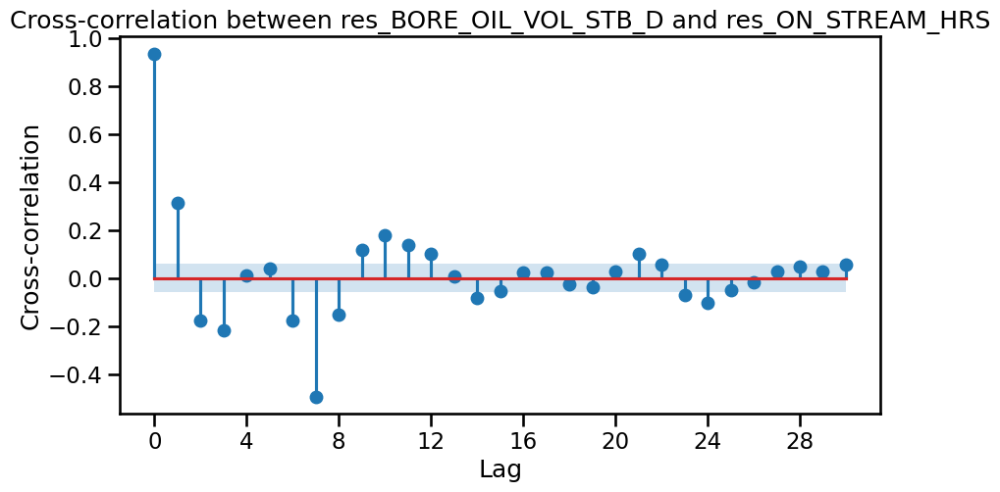

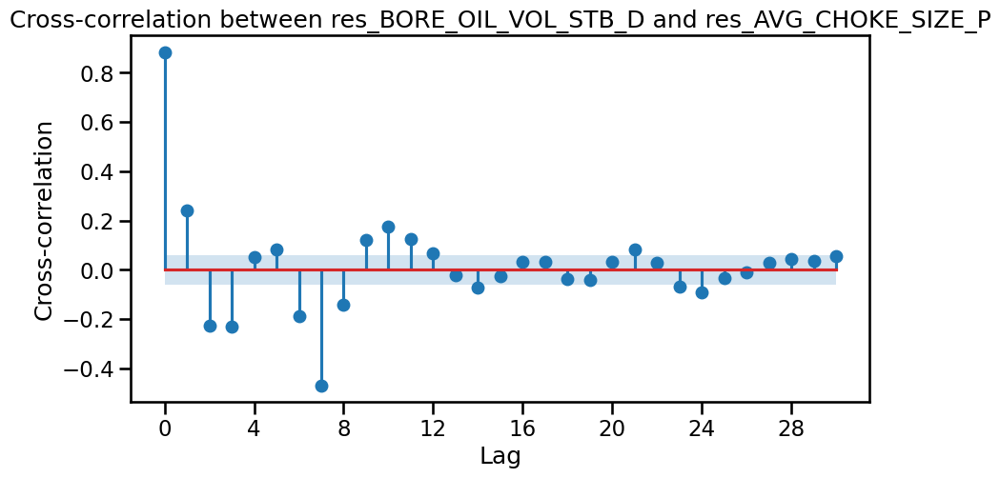

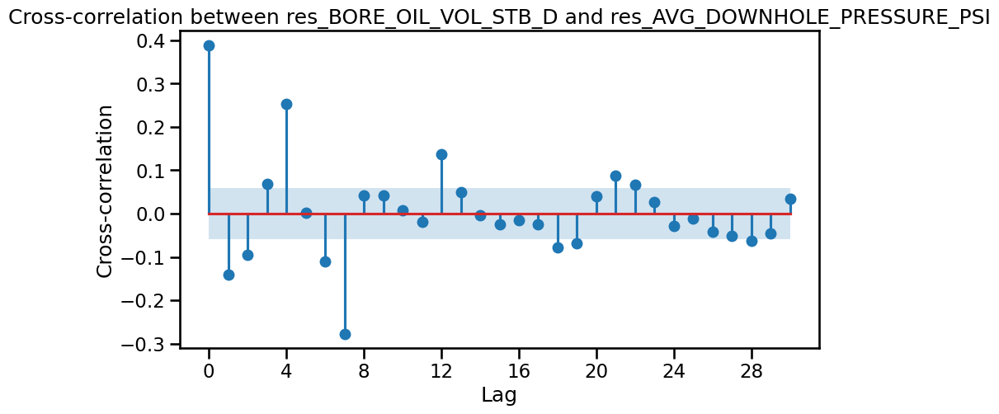

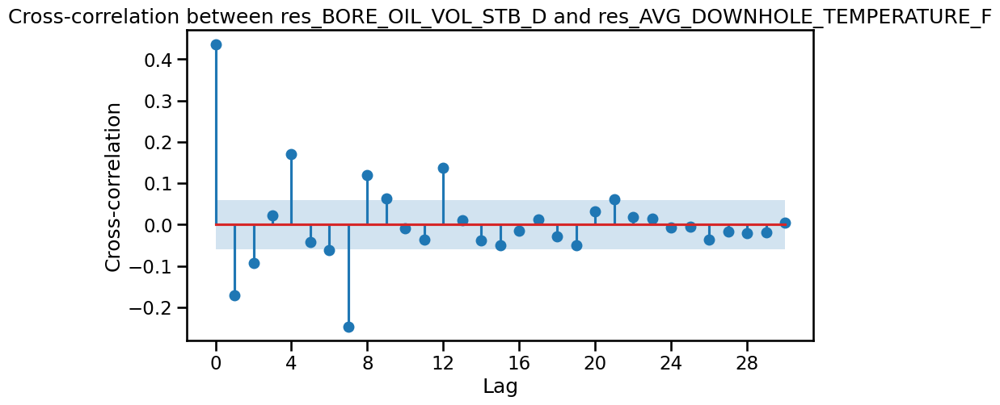

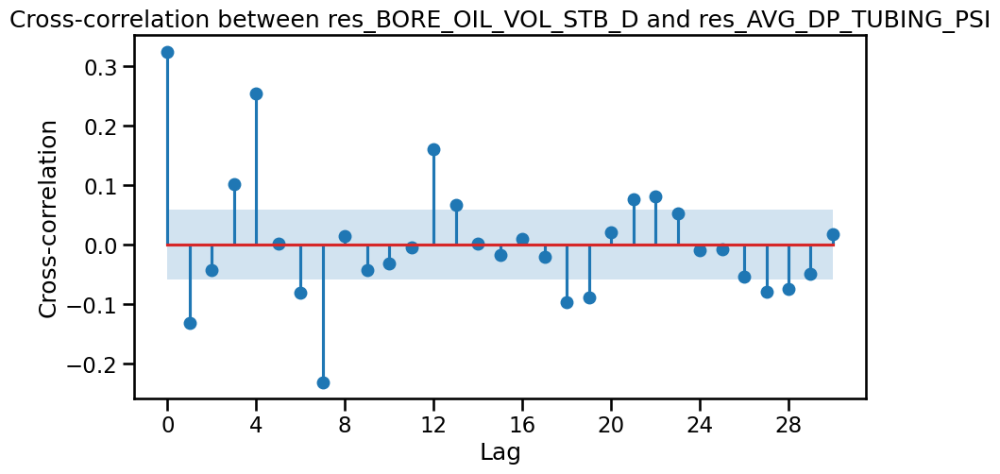

...

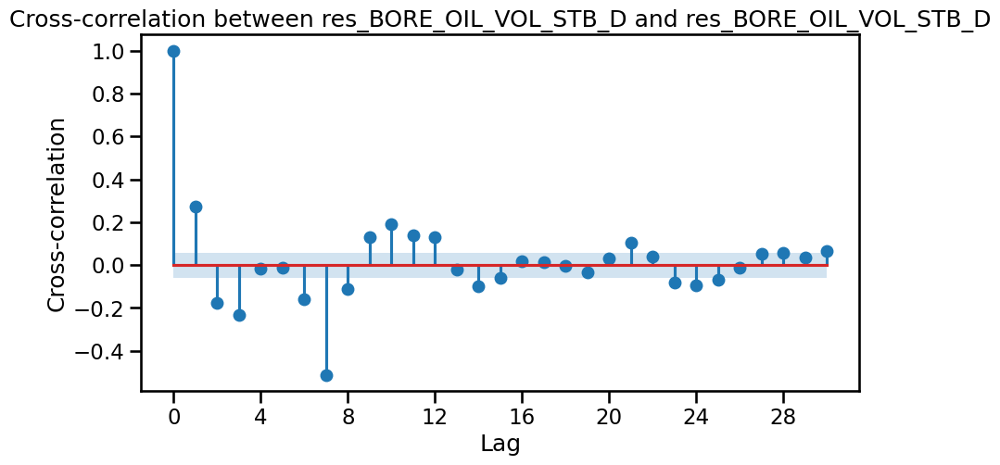

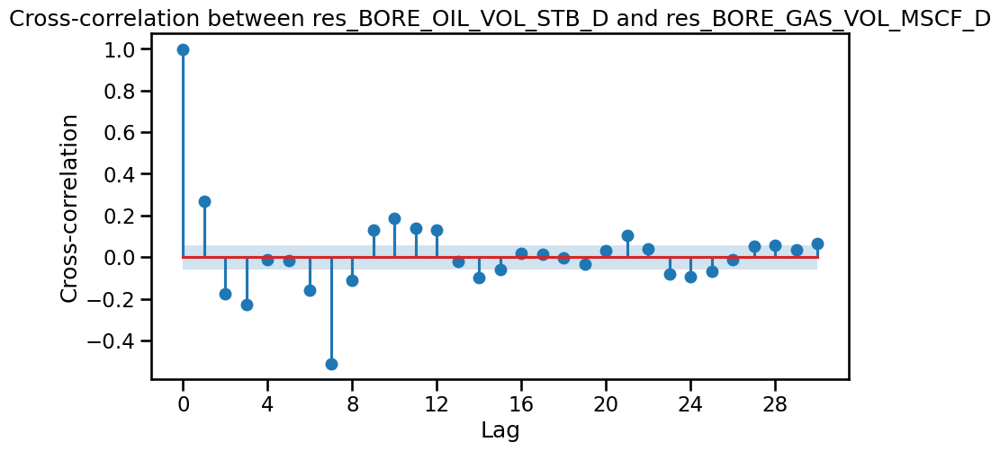

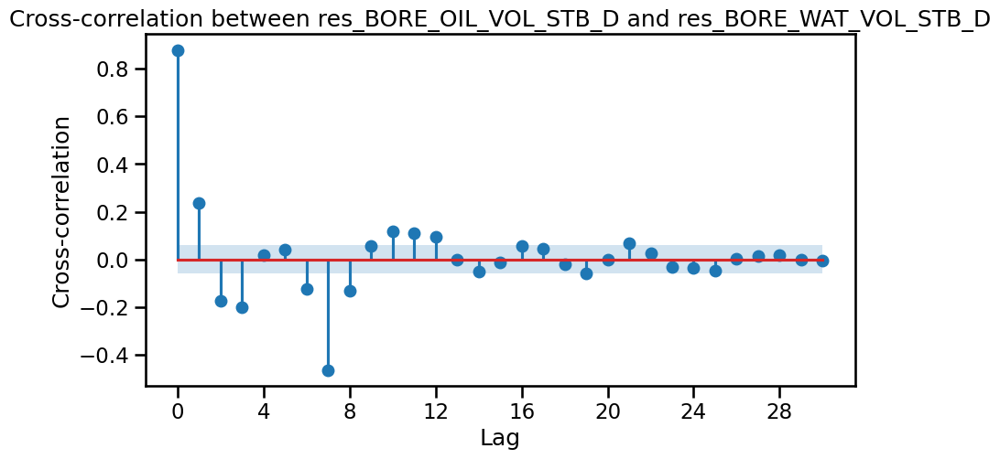

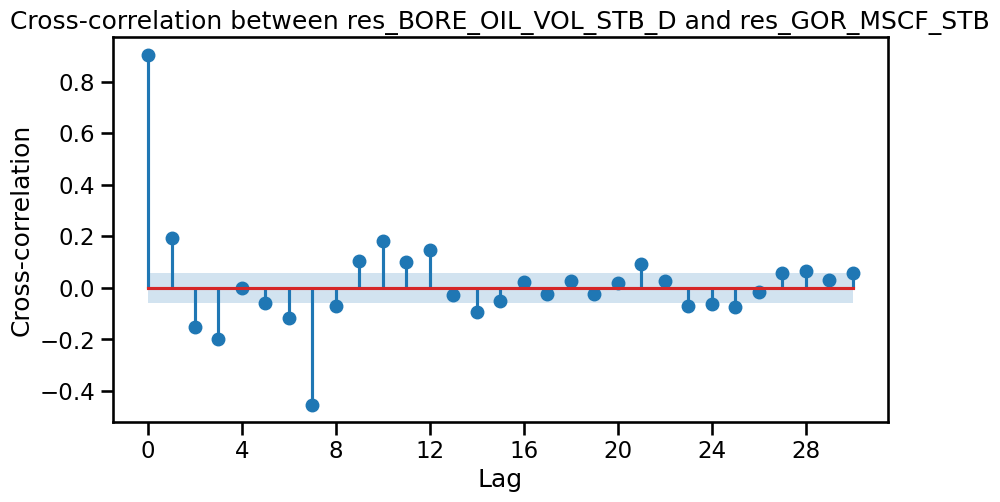

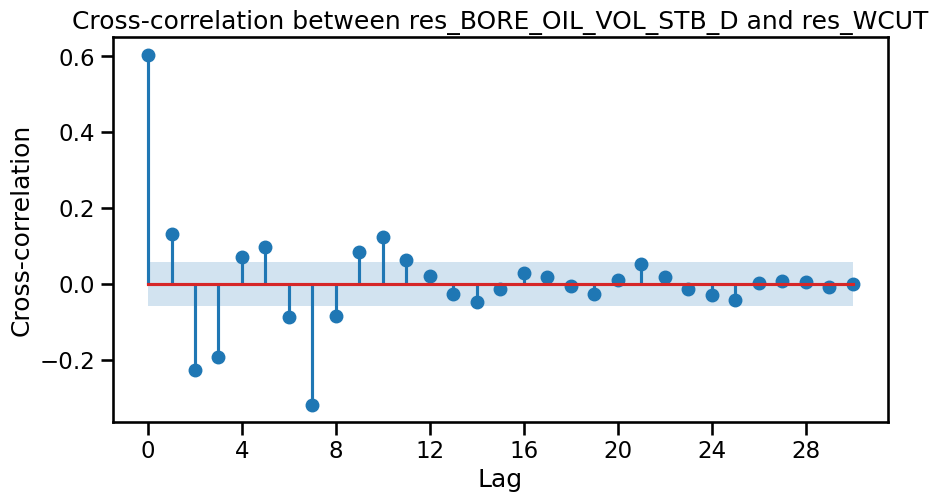

In [47]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_OIL_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_OIL_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
None

#### CCF for gas

In [48]:
# target
res_gas = STL(np.log1p(df_ccf["BORE_GAS_VOL_MSCF_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


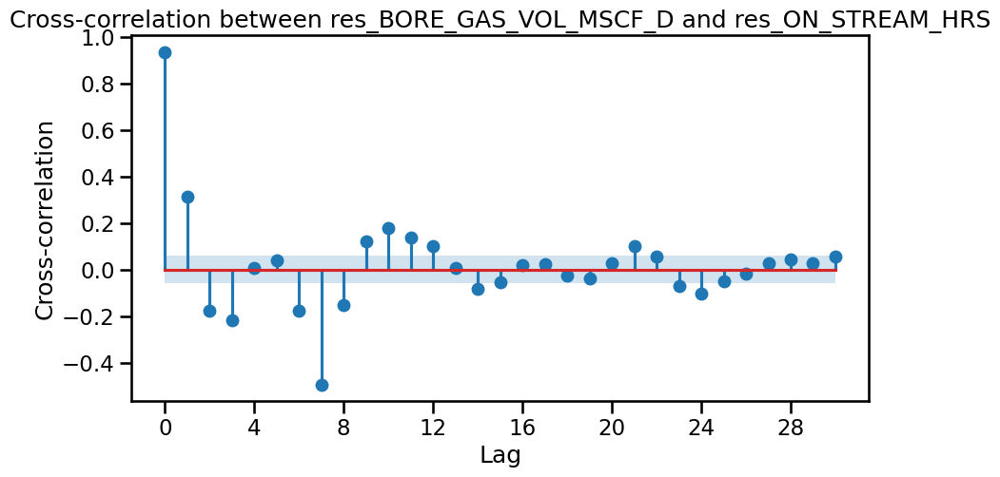

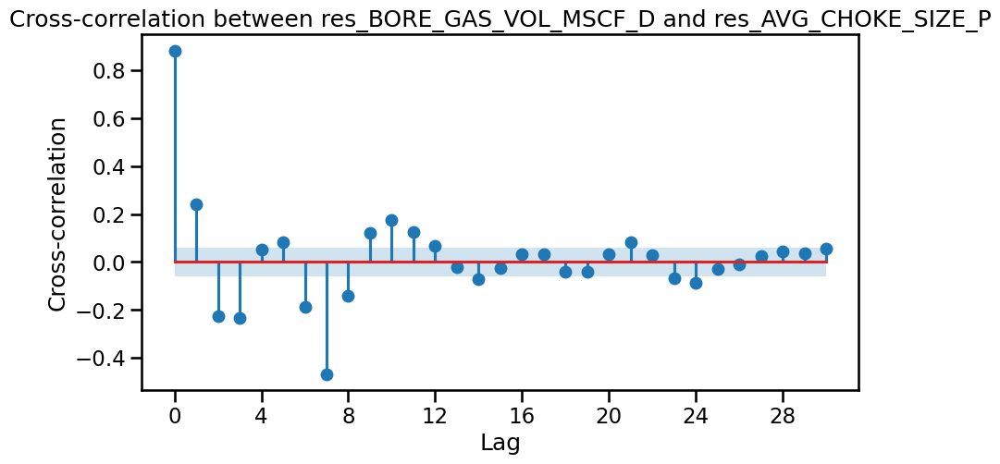

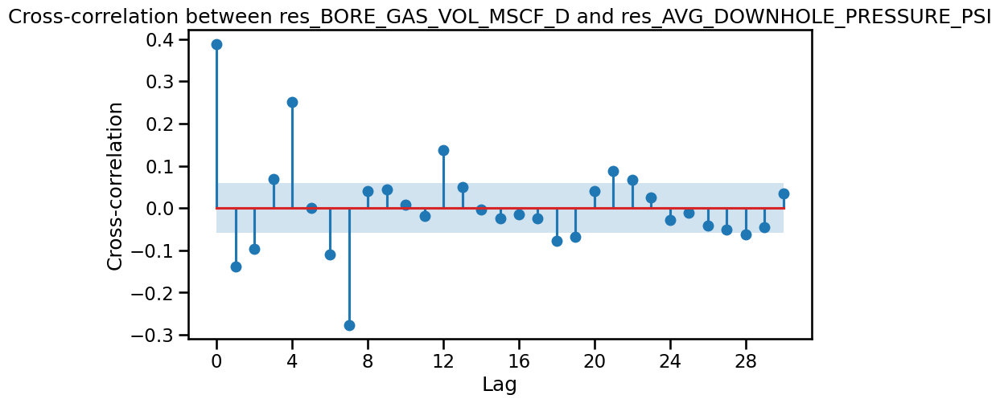

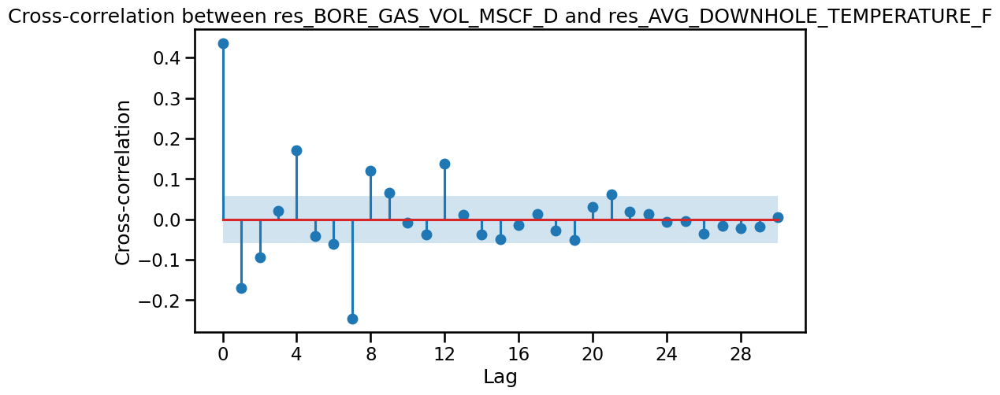

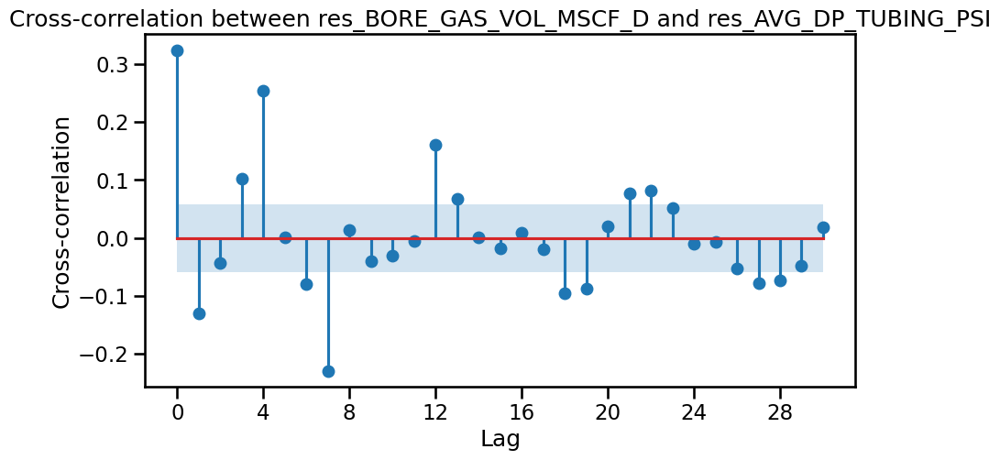

...

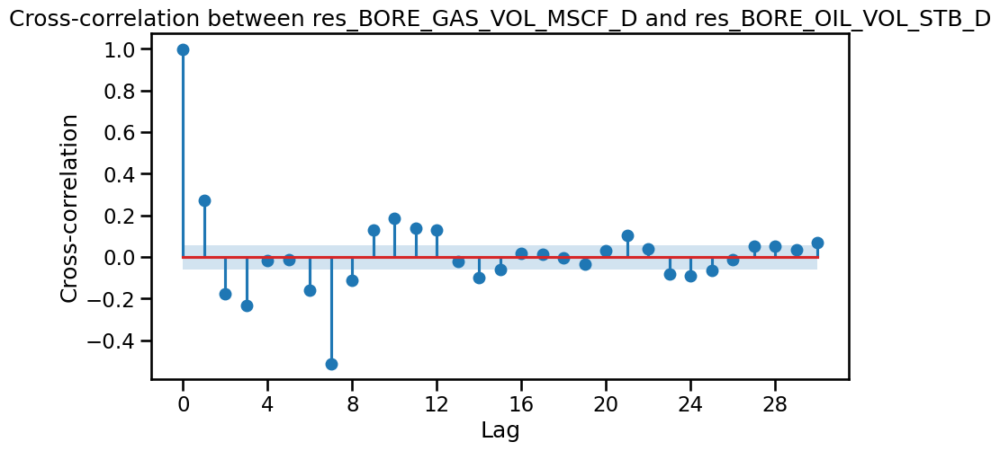

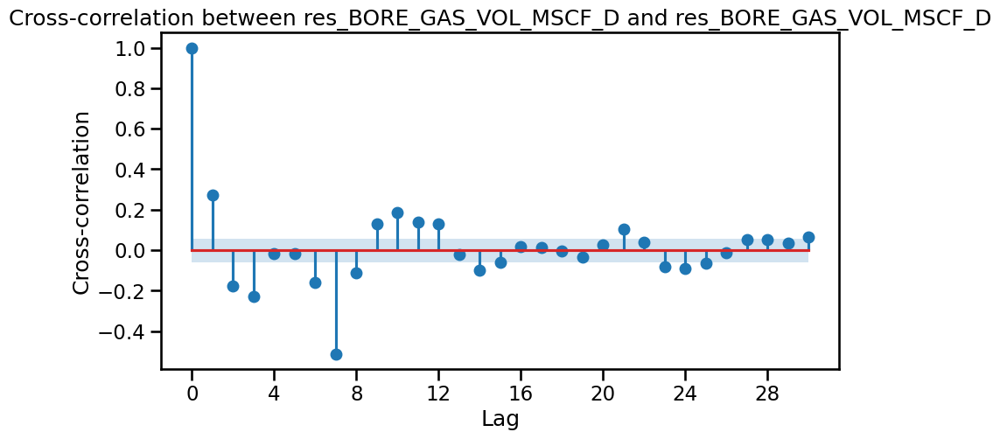

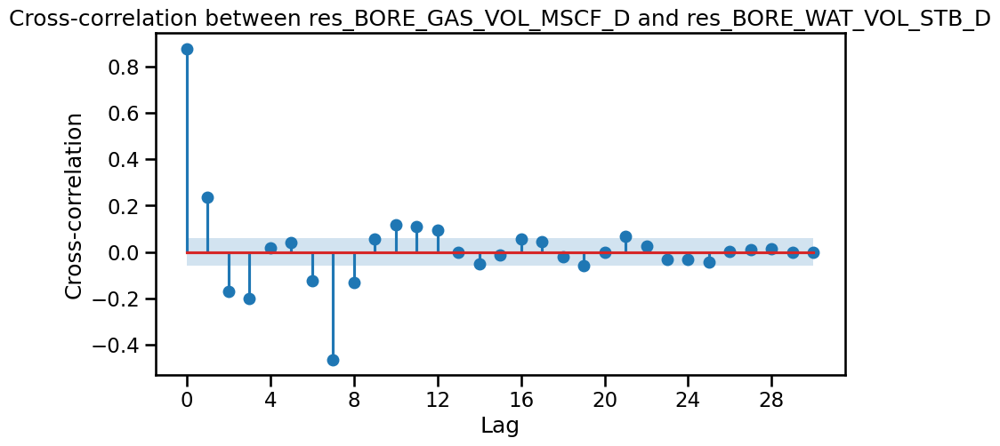

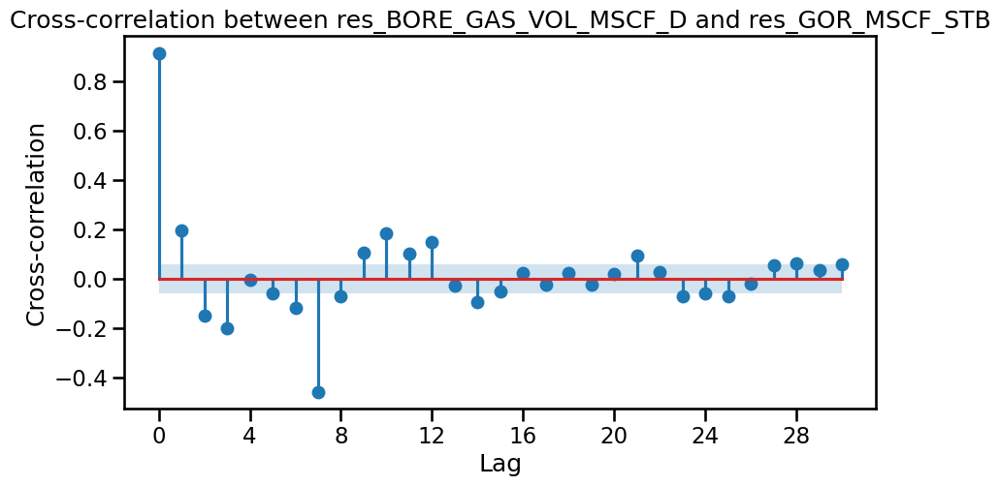

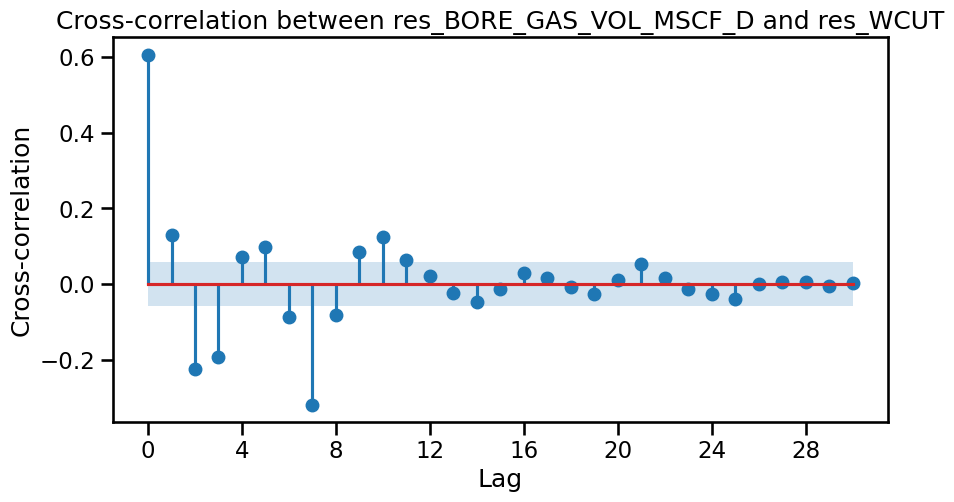

In [49]:
with sns.plotting_context("talk"):
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_GAS_VOL_MSCF_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between res_BORE_GAS_VOL_MSCF_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot 
avg annulus pressure[1]

#### CCF for water

In [50]:
# target
res_water = STL(np.log1p(df_ccf["BORE_WAT_VOL_STB_D"])).fit()

Analyzing components for: res_ON_STREAM_HRS
Analyzing components for: res_AVG_CHOKE_SIZE_P
Analyzing components for: res_AVG_DOWNHOLE_PRESSURE_PSI
Analyzing components for: res_AVG_DOWNHOLE_TEMPERATURE_F
Analyzing components for: res_AVG_DP_TUBING_PSI
Analyzing components for: res_AVG_ANNULUS_PRESS_PSI
Analyzing components for: res_DP_CHOKE_SIZE_PSI
Analyzing components for: res_AVG_WHP_P_PSI
Analyzing components for: res_AVG_WHT_P
Analyzing components for: res_BORE_OIL_VOL_STB_D
Analyzing components for: res_BORE_GAS_VOL_MSCF_D
Analyzing components for: res_BORE_WAT_VOL_STB_D
Analyzing components for: res_GOR_MSCF_STB
Analyzing components for: res_WCUT


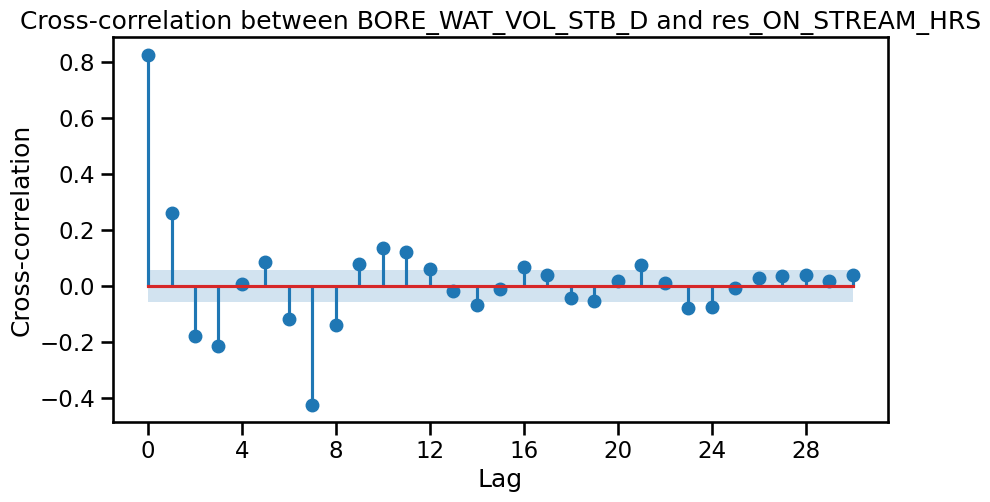

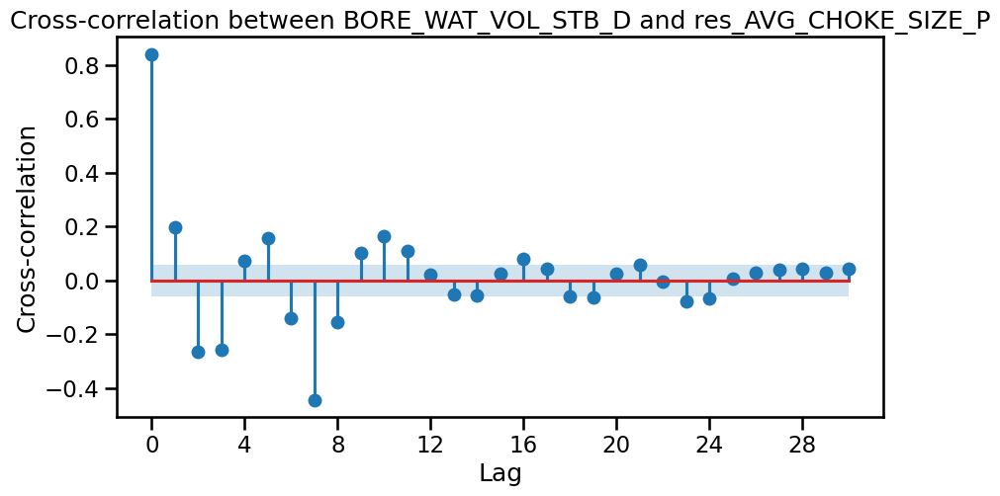

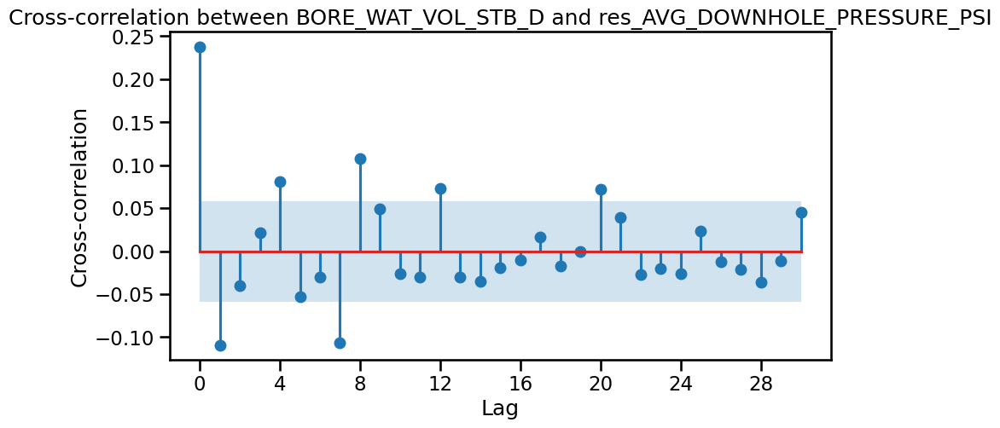

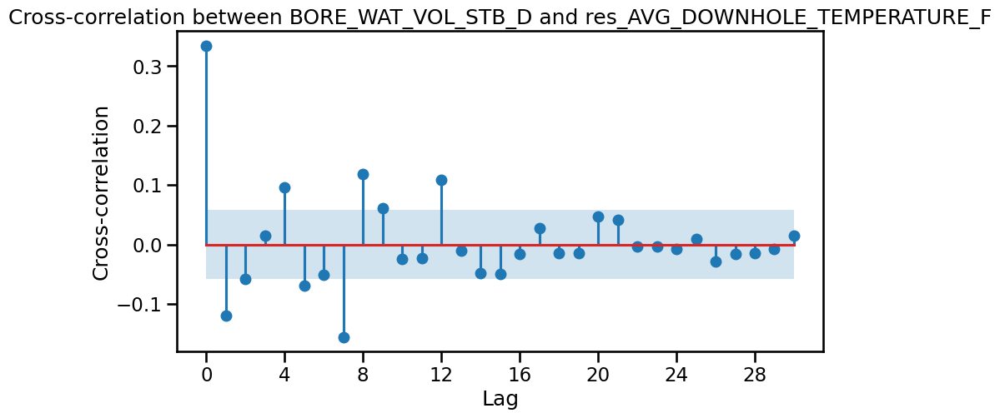

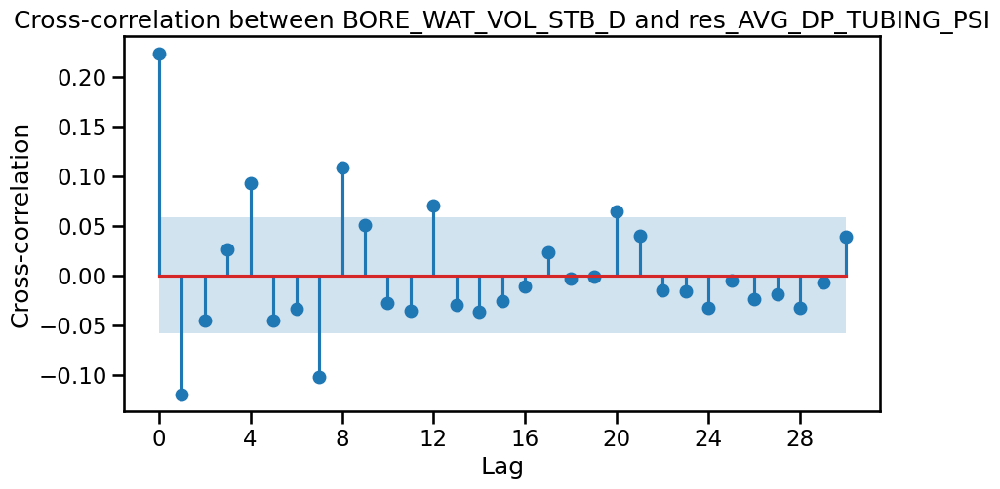

...

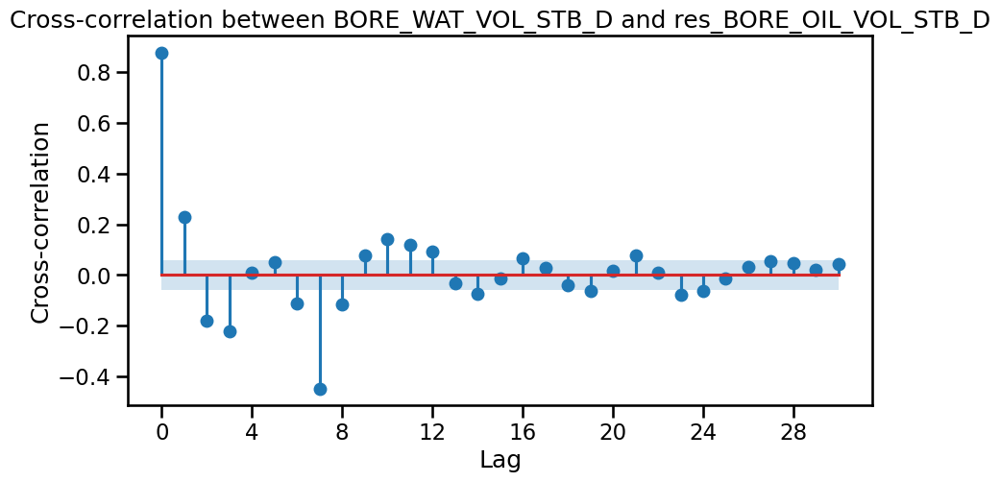

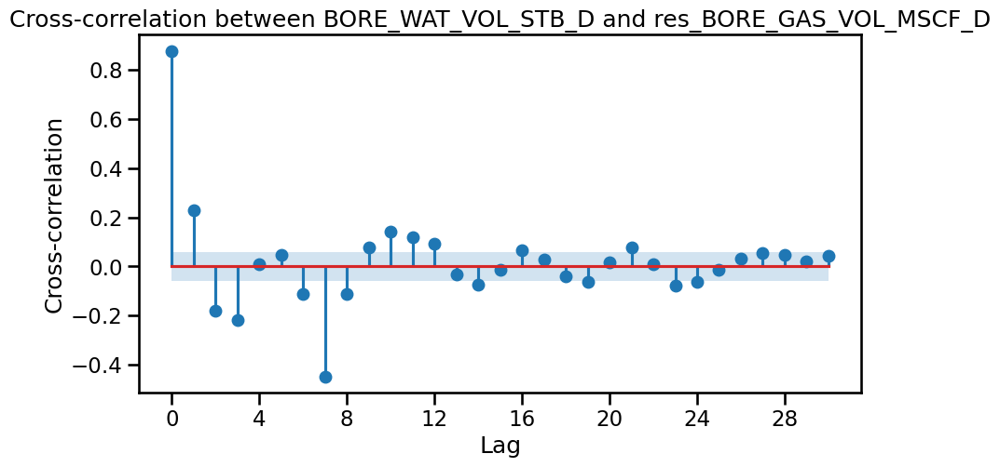

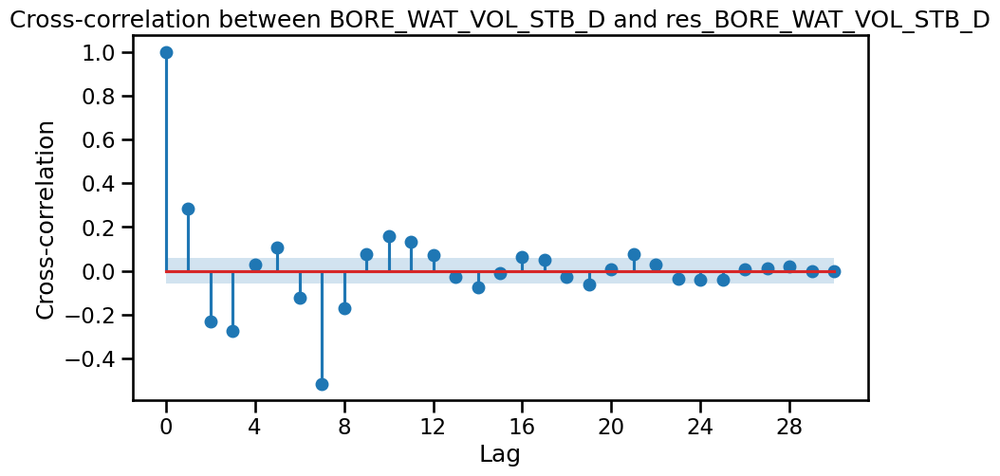

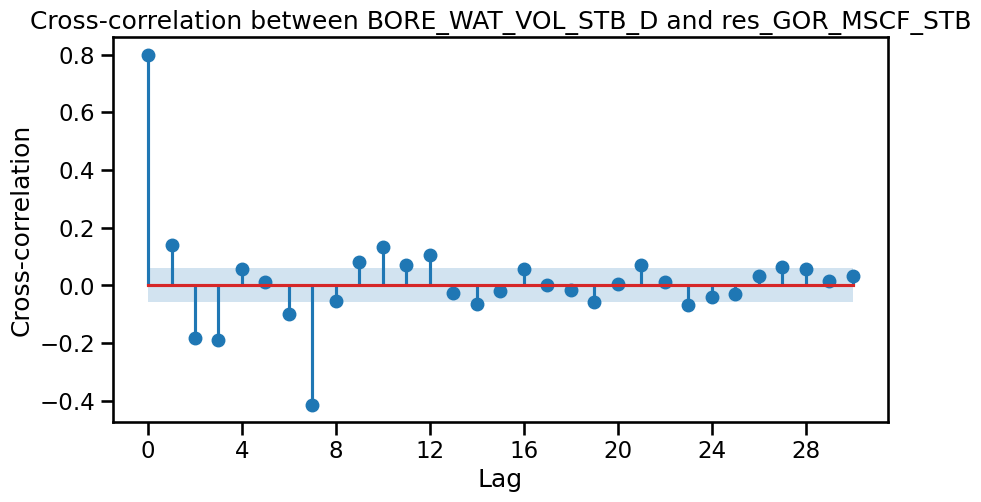

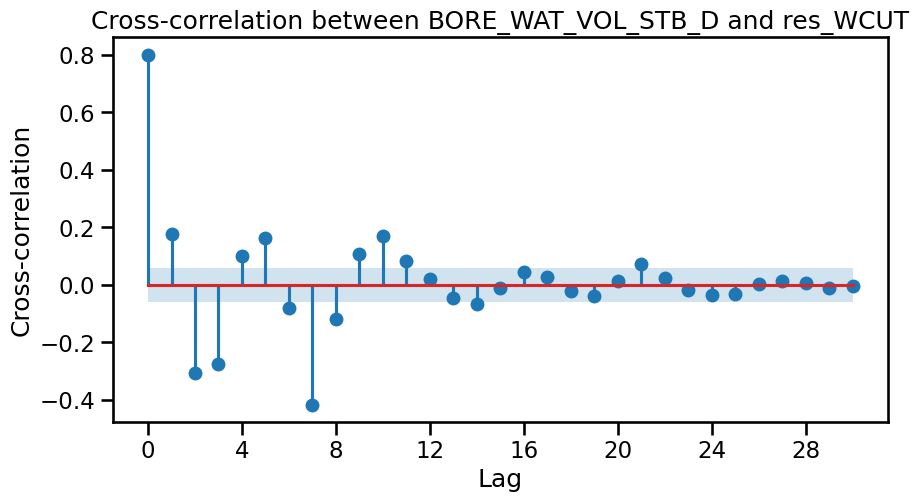

In [51]:
with sns.plotting_context("talk"): 
    for key, res in stl_results.items():
        print(f"Analyzing components for: {key}")
        ax = plot_ccf(stl_results["res_BORE_WAT_VOL_STB_D"].resid, stl_results[key].resid, lags=30)
        ax.set_title(f"Cross-correlation between BORE_WAT_VOL_STB_D and {key}")
        ax.set_ylabel("Cross-correlation")
        ax.set_xlabel("Lag")

These are the features that can be used from the CCF plot
None


### 2.4 Lasso for feature selection for Lags to use

In [52]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

In [53]:
# This is using a multiregressor. Different still different models for the phases ( 3 models for 3 phases). but all share same alpha
multioutput_lag_selector = (
    MultiPhaseMultiOutputLassoSelectedLagFeatureAdder(
        target_cols=[
            "BORE_OIL_VOL_STB_D",
            "BORE_GAS_VOL_MSCF_D",
            "BORE_WAT_VOL_STB_D",
        ],
        variables=None,
        max_lag_days=30,
        force_keep_lag_map={
            'ON_STREAM_HRS':[0,1,7] ,
            'AVG_CHOKE_SIZE_P':[0,1,7] ,
            'AVG_DOWNHOLE_PRESSURE_PSI':[0,7] ,
           'AVG_DOWNHOLE_TEMPERATURE_F':[0,7] ,
            'AVG_DP_TUBING_PSI':[0,7] ,
           'AVG_ANNULUS_PRESS_PSI':[0,7] ,
            'DP_CHOKE_SIZE_PSI':[0,7], 
            'AVG_WHP_P_PSI':[0,7], 
           'AVG_WHT_P':[0,7], 
        },
        alphas=np.logspace(-1, 3, 100),
        n_splits=5,
        min_features=10,
        verbose=True,
    )
)

In [54]:
multioutput_lag_selector.fit_transform(df).columns

MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Original columns: 14
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__All lag features created: 406
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Candidate lag features: 406
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Rows used internally: 1139
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Best shared alpha: 0.1
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Best CV RMSE: 0.4814
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_OIL_VOL_STB_D selected features: 6
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_GAS_VOL_MSCF_D selected features: 6
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_WAT_VOL_STB_D selected features: 8
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Union of Lasso-selected features: 16
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Force-kept lag features: 11
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Final selected lag features: 27
MultiPhaseMultiOutpu

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT', 'ON_STREAM_HRS_lag_1D',
       'ON_STREAM_HRS_lag_7D', 'AVG_CHOKE_SIZE_P_lag_1D',
       'AVG_CHOKE_SIZE_P_lag_7D', 'AVG_DOWNHOLE_PRESSURE_PSI_lag_7D',
       'AVG_DOWNHOLE_TEMPERATURE_F_lag_7D', 'AVG_DP_TUBING_PSI_lag_7D',
       'AVG_ANNULUS_PRESS_PSI_lag_7D', 'DP_CHOKE_SIZE_PSI_lag_7D',
       'AVG_WHP_P_PSI_lag_7D', 'AVG_WHT_P_lag_7D', 'BORE_OIL_VOL_STB_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_5D', 'BORE_OIL_VOL_STB_D_lag_4D',
       'BORE_OIL_VOL_STB_D_lag_9D', 'BORE_WAT_VOL_STB_D_lag_4D', 'WCUT_lag_1D',
       'BORE_WAT_VOL_STB_D_lag_21D', 'BORE_OIL_VOL_STB_D_lag_12D',
       'WCUT_lag_24D', 'BORE_WAT

In [55]:
multioutput_lag_selector.target_selected_lag_features_[
    "BORE_OIL_VOL_STB_D"
]

['BORE_OIL_VOL_STB_D_lag_1D',
 'BORE_OIL_VOL_STB_D_lag_4D',
 'BORE_OIL_VOL_STB_D_lag_7D',
 'BORE_OIL_VOL_STB_D_lag_9D',
 'BORE_OIL_VOL_STB_D_lag_11D',
 'BORE_OIL_VOL_STB_D_lag_12D']

In [56]:
multioutput_lag_selector.target_selected_lag_features_[
    "BORE_GAS_VOL_MSCF_D"
]

['BORE_OIL_VOL_STB_D_lag_1D',
 'BORE_GAS_VOL_MSCF_D_lag_1D',
 'BORE_OIL_VOL_STB_D_lag_4D',
 'BORE_OIL_VOL_STB_D_lag_9D',
 'BORE_OIL_VOL_STB_D_lag_12D',
 'BORE_OIL_VOL_STB_D_lag_14D']

In [57]:
multioutput_lag_selector.target_selected_lag_features_[
    "BORE_WAT_VOL_STB_D"
]

['BORE_WAT_VOL_STB_D_lag_1D',
 'WCUT_lag_1D',
 'BORE_WAT_VOL_STB_D_lag_4D',
 'BORE_WAT_VOL_STB_D_lag_5D',
 'WCUT_lag_20D',
 'BORE_WAT_VOL_STB_D_lag_21D',
 'WCUT_lag_24D',
 'BORE_WAT_VOL_STB_D_lag_25D']

In [58]:
multioutput_lag_selector.feature_summary_df_.head(30)

,feature,importance,BORE_OIL_VOL_STB_D_coef_scaled_y,BORE_GAS_VOL_MSCF_D_coef_scaled_y,BORE_WAT_VOL_STB_D_coef_scaled_y
0,BORE_OIL_VOL_STB_D_lag_1D,0.852428,0.733571,0.434173,-0.000000
1,BORE_WAT_VOL_STB_D_lag_1D,0.674524,-0.000000,-0.000000,0.674524
2,BORE_GAS_VOL_MSCF_D_lag_1D,0.305494,0.000000,0.305494,-0.000000
3,BORE_WAT_VOL_STB_D_lag_5D,0.153644,-0.000000,-0.000000,0.153644
4,BORE_OIL_VOL_STB_D_lag_4D,0.050579,0.038853,0.032383,-0.000000
5,BORE_OIL_VOL_STB_D_lag_9D,0.036298,0.028281,0.022753,-0.000000
6,BORE_WAT_VOL_STB_D_lag_4D,0.018167,-0.000000,-0.000000,0.018167
7,WCUT_lag_1D,0.015200,-0.000000,-0.000000,0.015200
8,BORE_WAT_VOL_STB_D_lag_21D,0.012703,-0.000000,-0.000000,0.012703
9,BORE_OIL_VOL_STB_D_lag_12D,0.011787,0.010680,0.004988,-0.000000


## 3. Window Feature

In [59]:
df_win=df.copy()
df_win

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


### 3.1 Rolling features

In [60]:
# rolling features
phase_rolling_feat = WindowFeatures(
    variables=["BORE_OIL_VOL_STB_D", "BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D",],
    #variables=["BORE_OIL_VOL_STB_D", "BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D", "GOR_MSCF_STB", "WCUT", "AVG_WHT_P"],
    functions=["mean", "std"],
    window=[7,30],
    periods=1,
    freq="1D",
    missing_values="ignore",
    drop_original=False,
    drop_na=False,
)

df_win = phase_rolling_feat.fit_transform(df_win)
df_win.head(10)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,BORE_GAS_VOL_MSCF_D_window_7_mean,BORE_GAS_VOL_MSCF_D_window_7_std,BORE_WAT_VOL_STB_D_window_7_mean,BORE_WAT_VOL_STB_D_window_7_std,BORE_OIL_VOL_STB_D_window_30_mean,BORE_OIL_VOL_STB_D_window_30_std,BORE_GAS_VOL_MSCF_D_window_30_mean,BORE_GAS_VOL_MSCF_D_window_30_std,BORE_WAT_VOL_STB_D_window_30_mean,BORE_WAT_VOL_STB_D_window_30_std
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-16,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


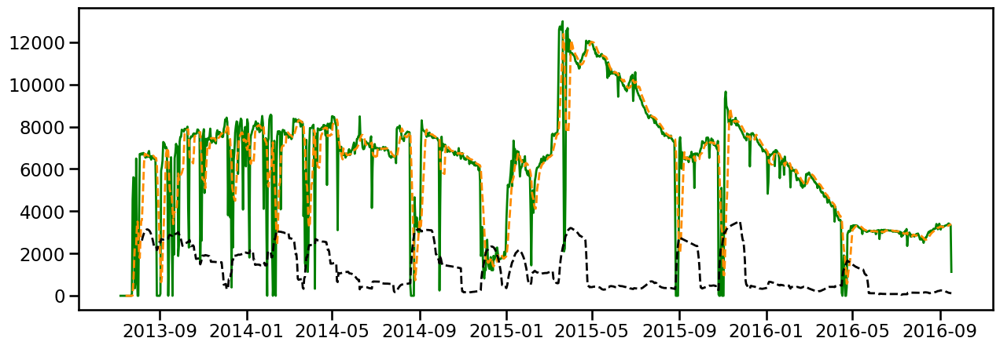

In [61]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_window_7_mean"],label="BORE_OIL_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)
    plt.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_window_30_std"],label="BORE_OIL_VOL_STB_D_window_30_std",color="black",linewidth=2,linestyle="--",)


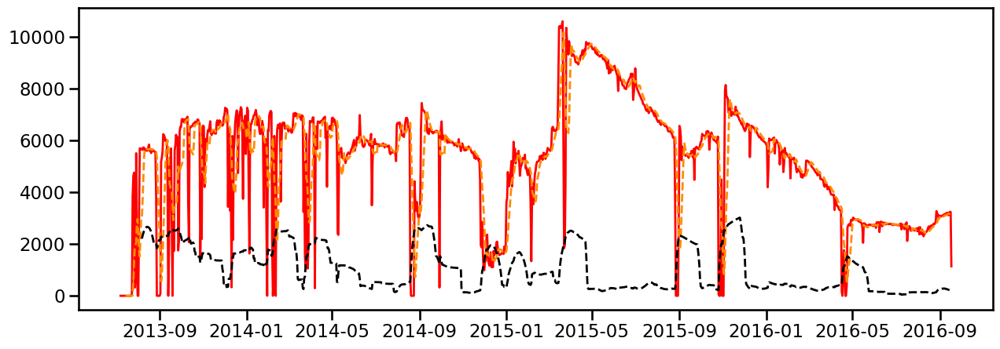

In [62]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_GAS_VOL_MSCF_D"], label="BORE_GAS_VOL_MSCF_D", color="red", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_GAS_VOL_MSCF_D_window_7_mean"],label="BORE_GAS_VOL_MSCF_D_window_30_mean",color="darkorange",linewidth=2,linestyle="--",)
    plt.plot(df_win.index,df_win["BORE_GAS_VOL_MSCF_D_window_30_std"],label="BORE_GAS_VOL_MSCF_D_window_30_std",color="black",linewidth=2,linestyle="--",)

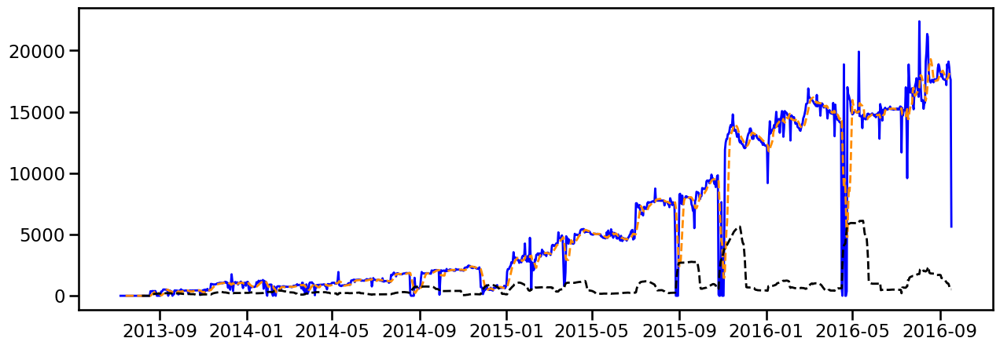

In [63]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_win["BORE_WAT_VOL_STB_D"], label="BORE_WAT_VOL_STB_D", color="blue", linewidth=2)
    plt.plot(df_win.index,df_win["BORE_WAT_VOL_STB_D_window_7_mean"],label="BORE_WAT_VOL_STB_D_window_7_mean",color="darkorange",linewidth=2,linestyle="--",)
    plt.plot(df_win.index,df_win["BORE_WAT_VOL_STB_D_window_30_std"],label="BORE_WAT_VOL_STB_D_window_30_std",color="black",linewidth=2,linestyle="--",)


### 3.2 Expanding features

In [64]:
# expanding window
expanding_feat = ExpandingWindowFeatures(
    variables=["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"], 
    functions=["sum"], 
    freq="1d" ,# Shift results back by 1 day to avoid data leakage.
    periods=1,
    missing_values="ignore",
    drop_original=False,
    drop_na=False,
)  

df_win = expanding_feat.fit_transform(df_win)
df_win.head()

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,BORE_WAT_VOL_STB_D_window_7_std,BORE_OIL_VOL_STB_D_window_30_mean,BORE_OIL_VOL_STB_D_window_30_std,BORE_GAS_VOL_MSCF_D_window_30_mean,BORE_GAS_VOL_MSCF_D_window_30_std,BORE_WAT_VOL_STB_D_window_30_mean,BORE_WAT_VOL_STB_D_window_30_std,BORE_OIL_VOL_STB_D_expanding_sum,BORE_GAS_VOL_MSCF_D_expanding_sum,BORE_WAT_VOL_STB_D_expanding_sum
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2013-07-10,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2013-07-11,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2013-07-12,0.0,0.0,0.0,32.0,0.0,0.0,0.0,0.0,32.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0


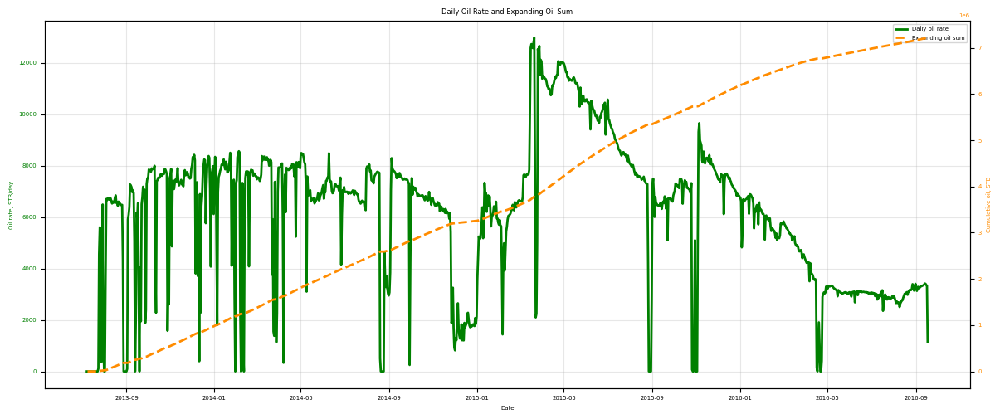

In [65]:
# I am just going to make one plot for oil
fig, ax1 = plt.subplots(figsize=(12, 5))

# Left y-axis: daily oil rate
line1 = ax1.plot(
    df_win.index,
    df_win["BORE_OIL_VOL_STB_D"],
    label="Daily oil rate",
    color="green",
    linewidth=2,
)

ax1.set_xlabel("Date")
ax1.set_ylabel("Oil rate, STB/day", color="green")
ax1.tick_params(axis="y", labelcolor="green")
ax1.grid(alpha=0.3)

# Right y-axis: expanding/cumulative sum
ax2 = ax1.twinx()

line2 = ax2.plot(
    df_win.index,
    df_win["BORE_OIL_VOL_STB_D_expanding_sum"],
    label="Expanding oil sum",
    color="darkorange",
    linewidth=2,
    linestyle="--",
)

ax2.set_ylabel("Cumulative oil, STB", color="darkorange")
ax2.tick_params(axis="y", labelcolor="darkorange")

# Combined legend
lines = line1 + line2
labels = [line.get_label() for line in lines]

ax1.legend(
    lines,
    labels,
    loc="best",
)

plt.title("Daily Oil Rate and Expanding Oil Sum")
fig.tight_layout()
plt.show()


### 3.3 Rolling Slope

In [66]:
slope_feat = RollingSlopeFeatures(
    variables=[
        "BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",
        "WCUT",
        "GOR_MSCF_STB",
    ],
    windows=(7,14),
    periods=1,          # very important: avoids leakage
    drop_original=False,
)
df_win = slope_feat.fit_transform(df_win)
df_win.head(20)

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,BORE_OIL_VOL_STB_D_slope_7D,BORE_OIL_VOL_STB_D_slope_14D,BORE_GAS_VOL_MSCF_D_slope_7D,BORE_GAS_VOL_MSCF_D_slope_14D,BORE_WAT_VOL_STB_D_slope_7D,BORE_WAT_VOL_STB_D_slope_14D,WCUT_slope_7D,WCUT_slope_14D,GOR_MSCF_STB_slope_7D,GOR_MSCF_STB_slope_14D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-09,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-10,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-11,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-12,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-13,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-14,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-07-15,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,NaN,0.000000,NaN,0.0,NaN,0.0,NaN,0.000000,NaN
2013-07-16,0.0,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,NaN,0.000000,NaN,0.0,NaN,0.0,NaN,0.000000,NaN


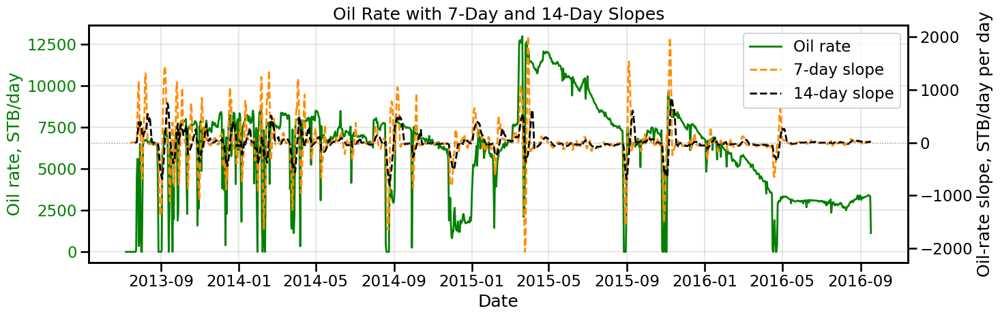

In [67]:

with sns.plotting_context("talk"):

    fig, ax1 = plt.subplots(figsize=(15, 5))

    # Primary y-axis: oil rate
    line1 = ax1.plot(
        df_win.index,
        df_win["BORE_OIL_VOL_STB_D"],
        label="Oil rate",
        color="green",
        linewidth=2,
    )

    ax1.set_xlabel("Date")
    ax1.set_ylabel("Oil rate, STB/day", color="green")
    ax1.tick_params(axis="y", labelcolor="green")
    ax1.grid(alpha=0.3)

    # Secondary y-axis: both slope features
    ax2 = ax1.twinx()

    line2 = ax2.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_slope_7D"],label="7-day slope",color="darkorange",linewidth=2,linestyle="--",)

    line3 = ax2.plot(df_win.index,df_win["BORE_OIL_VOL_STB_D_slope_14D"],label="14-day slope",color="black",linewidth=2,linestyle="--",)

    ax2.set_ylabel("Oil-rate slope, STB/day per day")
    ax2.axhline(y=0,color="gray",linewidth=1,linestyle=":",)

    # Combined legend from both axes
    lines = line1 + line2 + line3
    labels = [line.get_label() for line in lines]

    ax1.legend(lines,labels,loc="best",)

    plt.title("Oil Rate with 7-Day and 14-Day Slopes")
    fig.tight_layout()
    plt.show()

## 4. Trend feature

### 4.Time feature t & t^2

In [68]:
trend_adder = TrendFeatureAdder(
    freq="D",
    degree=2,
    include_bias=False,
    prefix="time_since",
    overwrite=True,
    verbose=True,
)

In [69]:
trend_adder.fit_transform(df)

Trend features added: ['time_since_D', 'time_since_D_power_2']


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT,time_since_D,time_since_D_power_2
DATEPRD,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.0,4.0
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,9.0
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.0,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125,1163.0,1352569.0
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414,1164.0,1354896.0
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461,1165.0,1357225.0


### 4.2 Fitted Features  logistic gompertz richards hyperbolic

In [70]:
df_curve=df.copy()

In [71]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

curve_adder = ProductionCurveFeatureAdder(
    target_cols=target_cols,

    curve_types={
        "BORE_OIL_VOL_STB_D": ["hyperbolic", "logistic", "gompertz", "richards"],
        "BORE_GAS_VOL_MSCF_D": ["hyperbolic", "logistic", "gompertz", "richards"],
        "BORE_WAT_VOL_STB_D": ["logistic", "gompertz", "richards"], #["logistic", "gompertz", "richards"],
    },

    fit_start_strategy={
        "BORE_OIL_VOL_STB_D": "peak_to_end",   # controls which section of the training data the curve is fitted on. peak_to_end find peak fit to the end. all means everything
        "BORE_GAS_VOL_MSCF_D": "peak_to_end",
        "BORE_WAT_VOL_STB_D": "all",
    },

    output="best",   # select the best curve
    date_col=None,                 # use DatetimeIndex
    on_stream_col="ON_STREAM_HRS",
    min_on_stream=12,
    min_rate=0,
    smoothing_window=14,
    add_slope=True,
    add_residual_lag=False,

    feature_prefix_map={
        "BORE_OIL_VOL_STB_D": "oil",
        "BORE_GAS_VOL_MSCF_D": "gas",
        "BORE_WAT_VOL_STB_D": "water",
    },
)

In [72]:
df_curve=curve_adder.fit_transform(df_curve)

In [73]:
curve_adder.fit_summary_

,target,curve_type,success,rmse,mae,fit_n,fit_origin_date,params,selected
0,BORE_OIL_VOL_STB_D,hyperbolic,True,816.225585,677.052901,528,2015-03-22,"[12326.975397493947, 0.9607261674815427, 0.010...",False
1,BORE_OIL_VOL_STB_D,logistic,True,775.616360,632.980191,528,2015-03-22,"[19208.757709117453, 2.050586246014529e-11, 1....",False
2,BORE_OIL_VOL_STB_D,gompertz,True,779.670723,637.326877,528,2015-03-22,"[14974.467323655523, 1.2162544898484416e-15, 1...",False
3,BORE_OIL_VOL_STB_D,richards,True,770.633101,626.399859,528,2015-03-22,"[53443.62521074369, 2.7738569539377795e-13, 1....",True
4,BORE_GAS_VOL_MSCF_D,hyperbolic,True,697.083730,581.341812,529,2015-03-21,"[10035.112590182984, 0.8747418754632417, 0.010...",False
5,BORE_GAS_VOL_MSCF_D,logistic,True,657.142386,545.638246,529,2015-03-21,"[13960.110873184041, 6.424414144656602e-10, 1....",False
6,BORE_GAS_VOL_MSCF_D,gompertz,True,661.796199,550.512278,529,2015-03-21,"[11376.418896763096, 6.74637352250567e-10, 1.3...",False
7,BORE_GAS_VOL_MSCF_D,richards,True,647.066845,531.525352,529,2015-03-21,"[13917.423116411172, 2325.047465794674, 7.1882...",True
8,BORE_WAT_VOL_STB_D,logistic,True,734.374521,582.589599,1068,2013-08-19,"[833.3150747426688, 17367.398765550737, 3.3132...",False
9,BORE_WAT_VOL_STB_D,gompertz,True,793.062634,643.541609,1068,2013-08-19,"[1067.5087038846111, 19502.461904080195, 1.844...",False


In [74]:
#gompertz_water=curve_adder.fit_summary_[(curve_adder.fit_summary_['target'] == 'BORE_WAT_VOL_STB_D') & (curve_adder.fit_summary_['curve_type'] == 'gompertz')]["params"]

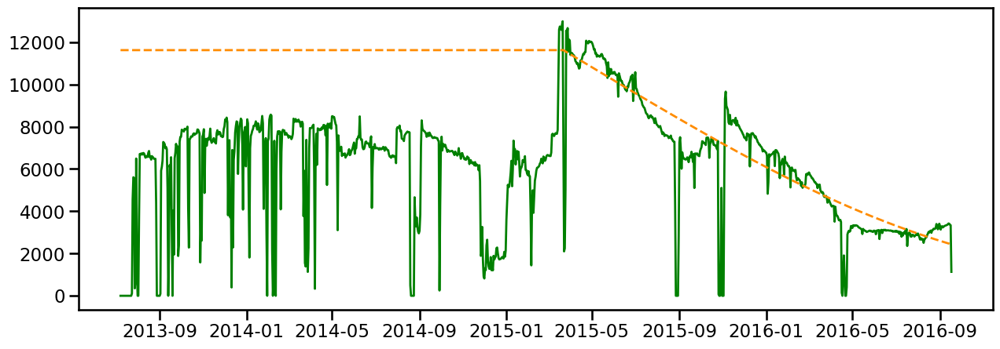

In [75]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_curve["BORE_OIL_VOL_STB_D"], label="BORE_OIL_VOL_STB_D", color="green", linewidth=2)
    plt.plot(df_win.index,df_curve["oil_curve_trend"],label="oil_curve_trend",color="darkorange",linewidth=2,linestyle="--",)

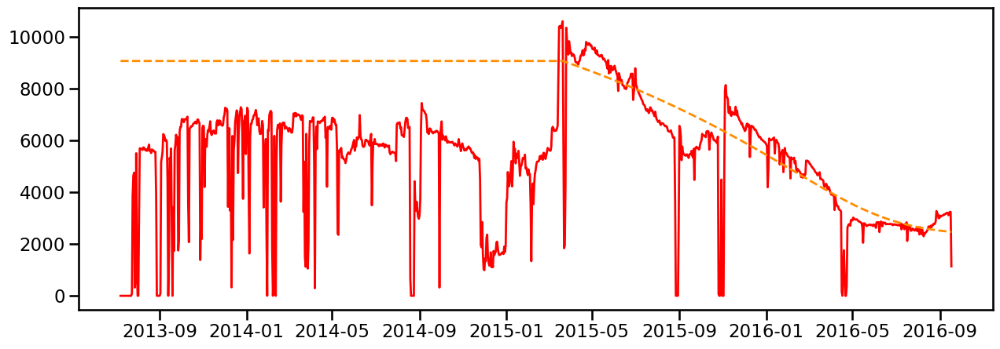

In [76]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_curve["BORE_GAS_VOL_MSCF_D"], label="BORE_GAS_VOL_MSCF_D", color="red", linewidth=2)
    plt.plot(df_win.index,df_curve["gas_curve_trend"],label="gas_curve_trend",color="darkorange",linewidth=2,linestyle="--",)

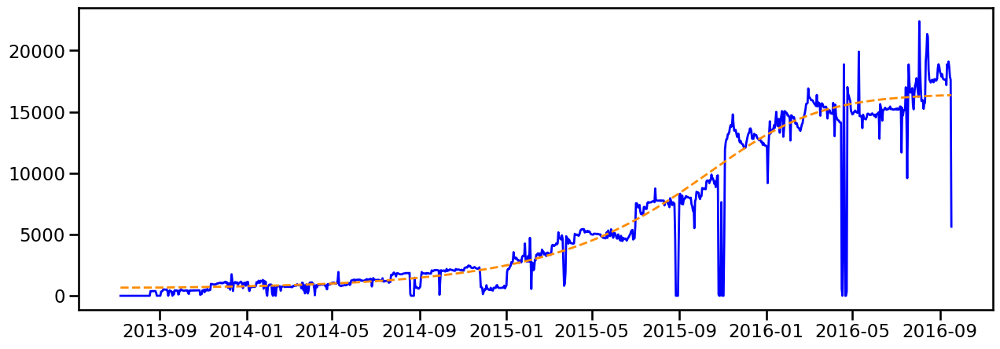

In [77]:
with sns.plotting_context("talk"): 
    plt.figure(figsize=(15, 5))
    plt.plot(df_win.index, df_curve["BORE_WAT_VOL_STB_D"], label="BORE_WAT_VOL_STB_D", color="blue", linewidth=2)
    plt.plot(df_win.index,df_curve["water_curve_trend"],label="water_curve_trend",color="darkorange",linewidth=2,linestyle="--",)

## 5. Seasonality

There are 3 main main to model seasonality. I will take monthly seasonality as an example
1. Integer to represent the month [1,2,3...] This is good for tree based model, but not for linear models
2. Dummies to represent the month. This is good for linear models but not for tree based models because it is sparse.
3. Fourier series. good for linear models and give u less features.
4. Can just only use sine or consine transformation

In [78]:
df_season=df.copy()
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,GOR_MSCF_STB,WCUT
DATEPRD,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,3109.182468,19101.083702,0.908995,0.848125
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,3184.996419,18639.789037,0.934476,0.845414
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,3245.070255,17855.952915,0.964580,0.841461


### 5.1 Fourier series 

I have 4 transformation here. 3 for the 3 different phases and 1 for multiphase. When you build the pipeline you can comment out what you don't want to use. For now, run all the transformation. Yes it takes time

#### Multiphase Fourier. All 3 phases all together

In [79]:
fourier_alpha_grid = np.logspace(-4, 1, 100)

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

phase_calendar_fourier_selector = AddSelectedCalendarFourierFeaturesMultiPhase(
    target_cols=["BORE_OIL_VOL_STB_D", "BORE_GAS_VOL_MSCF_D", "BORE_WAT_VOL_STB_D"],
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
)

#### Oil

In [80]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

oil_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_OIL_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="oil",
)

In [81]:
df_season=oil_calendar_fourier_selector.fit_transform(df_season)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.926e+06, tolerance: 1.580e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.202e+05, tolerance: 1.580e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: quarterly
Best K: 3
Best alpha: 100
Best CV score: -3030.7449528702573
Candidate Fourier features: 6
Selected Fourier features: 5
Final dataframe columns returned: 19


/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.433e+08, tolerance: 1.580e+04
  model = cd_fast.enet_coordinate_descent(


#### Gas

In [82]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

gas_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_GAS_VOL_MSCF_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="gas",
)

In [83]:
gas_calendar_fourier_selector.fit_transform(df_season)

/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.817e+06, tolerance: 1.173e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.616e+05, tolerance: 1.173e+04
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: quarterly
Best K: 3
Best alpha: 100
Best CV score: -2464.1384064089784
Candidate Fourier features: 6
Selected Fourier features: 5
Final dataframe columns returned: 24


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,oil_quarter_cos_2,oil_quarter_sin_1,oil_quarter_cos_1,oil_quarter_sin_3,oil_quarter_cos_3,gas_quarter_sin_1,gas_quarter_cos_2,gas_quarter_cos_1,gas_quarter_sin_3,gas_quarter_cos_3
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16


#### Water

In [84]:
fourier_alpha_grid = [0.001, 0.01, 0.1, 1.0, 10.0, 20, 30, 50, 100]

fourier_param_grid = [
    #{
        #"fourier__seasonality": ["daily"],
        #"fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        #"model__alpha": fourier_alpha_grid,
   # },
    #{
        #"fourier__seasonality": ["weekly"],
        #"fourier__K": [1, 2, 3],
        #"model__alpha": fourier_alpha_grid,
    #},
    {
        "fourier__seasonality": ["monthly"],
        "fourier__K": [1, 2, 3, 4, 5, 6,7,8,9,10],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["quarterly"],
        "fourier__K": [1, 2,3],
        "model__alpha": fourier_alpha_grid,
    },
    {
        "fourier__seasonality": ["week_of_year"],
        "fourier__K": [1, 2, 3, 4, 5, 6, 8, 10],
        "model__alpha": fourier_alpha_grid,
    },
]

water_calendar_fourier_selector = AddSelectedCalendarFourierFeatures(
    target_col="BORE_WAT_VOL_STB_D",
    param_grid=fourier_param_grid,
    date_col=None,
    keep_original=True,
    drop_date_col=False,
    min_features=1,
    n_splits=5,
    verbose=True,
    feature_prefix="water",
)

In [85]:
water_calendar_fourier_selector.fit_transform(df_season)


/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.459e+04, tolerance: 8.321e+02
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.430e+07, tolerance: 4.215e+05
  model = cd_fast.enet_coordinate_descent(
/home/d/miniforge3/envs/ML_dayo/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Best seasonality: quarterly
Best K: 3
Best alpha: 100
Best CV score: -5848.994497860572
Candidate Fourier features: 6
Selected Fourier features: 4
Final dataframe columns returned: 23


,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,WCUT,oil_quarter_cos_2,oil_quarter_sin_1,oil_quarter_cos_1,oil_quarter_sin_3,oil_quarter_cos_3,water_quarter_cos_1,water_quarter_cos_2,water_quarter_sin_2,water_quarter_cos_3
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,0.000000,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,0.848125,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,0.845414,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,0.841461,-1.0,-1.0,-1.836970e-16,1.0,5.510911e-16,-1.836970e-16,-1.0,3.673940e-16,5.510911e-16


### 5.2 datetime from feature engine
This is just Interger for the week & Month

In [86]:
# Interger for datetime

In [87]:
week_month_of_year_adder = DatetimeFeatures(
    variables="index",
    features_to_extract=["week", "month"],
    drop_original=False
)

In [88]:
df_season = week_month_of_year_adder.fit_transform(df_season)

### 5.3 Sine and Cosine transformation
Use feature engine to do sine and cosine transformation

In [89]:
sin_cos_adder=CyclicalFeatures(
    variables=["week", "month"],
    drop_original=False
)

In [90]:
df_season=sin_cos_adder.fit_transform(df_season)
df_season

,ON_STREAM_HRS,AVG_CHOKE_SIZE_P,AVG_DOWNHOLE_PRESSURE_PSI,AVG_DOWNHOLE_TEMPERATURE_F,AVG_DP_TUBING_PSI,AVG_ANNULUS_PRESS_PSI,DP_CHOKE_SIZE_PSI,AVG_WHP_P_PSI,AVG_WHT_P,BORE_OIL_VOL_STB_D,...,oil_quarter_sin_1,oil_quarter_cos_1,oil_quarter_sin_3,oil_quarter_cos_3,week,month,week_sin,week_cos,month_sin,month_cos
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-08,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.836970e-16,1.0,5.510911e-16,28,7,-0.176890,-0.984231,-0.5,-8.660254e-01
2013-07-09,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.836970e-16,1.0,5.510911e-16,28,7,-0.176890,-0.984231,-0.5,-8.660254e-01
2013-07-10,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.836970e-16,1.0,5.510911e-16,28,7,-0.176890,-0.984231,-0.5,-8.660254e-01
2013-07-11,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.836970e-16,1.0,5.510911e-16,28,7,-0.176890,-0.984231,-0.5,-8.660254e-01
2013-07-12,0.00000,0.000000,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,...,-1.0,-1.836970e-16,1.0,5.510911e-16,28,7,-0.176890,-0.984231,-0.5,-8.660254e-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,24.00000,100.000000,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,3420.461576,...,-1.0,-1.836970e-16,1.0,5.510911e-16,37,9,-0.947326,-0.320270,-1.0,-1.836970e-16
2016-09-14,24.00000,100.000000,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,3408.322243,...,-1.0,-1.836970e-16,1.0,5.510911e-16,37,9,-0.947326,-0.320270,-1.0,-1.836970e-16
2016-09-15,24.00000,100.000000,3668.572462,221.493400,3278.390455,327.508519,49.483258,390.182007,180.661007,3364.230675,...,-1.0,-1.836970e-16,1.0,5.510911e-16,37,9,-0.947326,-0.320270,-1.0,-1.836970e-16


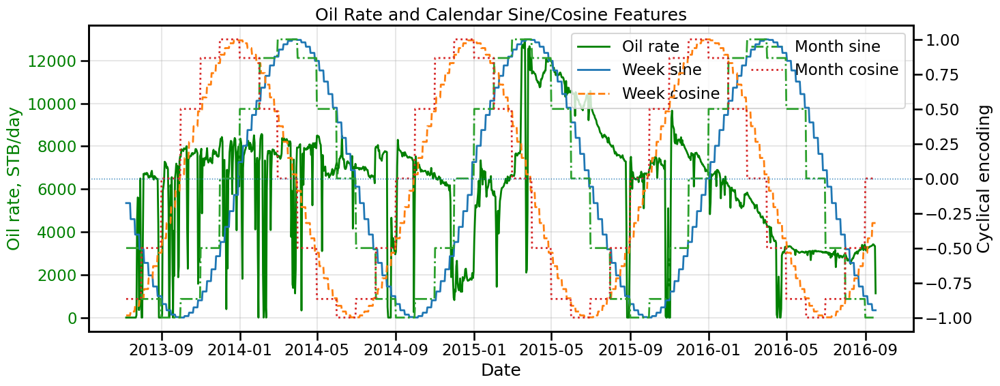

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

with sns.plotting_context("talk"):

    fig, ax1 = plt.subplots(figsize=(15, 6))

    # Left axis: oil rate
    oil_line = ax1.plot(
        df_season.index,
        df_season["BORE_OIL_VOL_STB_D"],
        label="Oil rate",
        color="green",
        linewidth=2,
    )

    ax1.set_xlabel("Date")
    ax1.set_ylabel("Oil rate, STB/day", color="green")
    ax1.tick_params(axis="y", labelcolor="green")
    ax1.grid(alpha=0.3)

    # Right axis: cyclical features
    ax2 = ax1.twinx()

    week_sin_line = ax2.plot(df_season.index,df_season["week_sin"],label="Week sine",linewidth=2,)

    week_cos_line = ax2.plot(df_season.index,df_season["week_cos"],label="Week cosine", linewidth=2,linestyle="--",)

    month_sin_line = ax2.plot(df_season.index,df_season["month_sin"],label="Month sine",linewidth=2,linestyle="-.",)

    month_cos_line = ax2.plot(df_season.index,df_season["month_cos"],label="Month cosine",linewidth=2,linestyle=":",)

    ax2.set_ylabel("Cyclical encoding")
    ax2.set_ylim(-1.1, 1.1)
    ax2.axhline(0, linewidth=1, linestyle=":")

    # Combined legend
    lines = (oil_line+ week_sin_line+ week_cos_line+ month_sin_line+ month_cos_line)

    labels = [line.get_label() for line in lines]

    ax1.legend(
        lines,
        labels,
        loc="upper right",
        ncol=2,
    )

    plt.title("Oil Rate and Calendar Sine/Cosine Features")
    fig.tight_layout()
    plt.show()

## 6. Create Final lags columns that I am interested in shifted by 1 day

In [92]:
df_create_1_day=df.copy()

In [93]:
#Based on my domain knowlege these are variables I know that will be strong predictors. So I want these variables to be there, to prevent data leakage, I have shifted by 1 day

specific_lag1_adder = AddSpecificLag1Features(
    #variables=['ON_STREAM_HRS', "AVG_CHOKE_SIZE_P", 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
    variables=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
    
    freq="1D",
    verbose=True,
)

In [94]:
df_create_1_day=specific_lag1_adder.fit_transform(df_create_1_day)
(df_create_1_day.columns, len(df_create_1_day.columns))

AddSpecificLag1Features__Requested variables: 14
AddSpecificLag1Features__Existing lag columns skipped: 0
AddSpecificLag1Features__New lag columns to add: 14
AddSpecificLag1Features__New lag columns added: ['ON_STREAM_HRS_lag_1D', 'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D', 'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D', 'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


(Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
        'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
        'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
        'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
        'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT', 'ON_STREAM_HRS_lag_1D',
        'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D',
        'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D', 'AVG_DP_TUBING_PSI_lag_1D',
        'AVG_ANNULUS_PRESS_PSI_lag_1D', 'DP_CHOKE_SIZE_PSI_lag_1D',
        'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D', 'BORE_OIL_VOL_STB_D_lag_1D',
        'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D',
        'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 28)

In [95]:
df_create_1_day_use=df_create_1_day.copy()

## 7.Drop Features

I am going to use this to drop columns that will result in data leakage. I am not too sure about ON_STREAM_HRS for now, but I will remove it for now. For each phase, I will have to keep the target because I need the target when I make the feature engineering

In [96]:
df.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

In [97]:
df_create_1_day_use=df_create_1_day.copy()

In [98]:
phase_column_dropper = DropFeatures(
    features_to_drop=[
        "GOR_MSCF_STB",
        "WCUT",
        "ON_STREAM_HRS",
        "AVG_CHOKE_SIZE_P", 
        'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI','AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI','AVG_WHT_P', 
    ]
)

In [99]:
df_create_1_day_use=phase_column_dropper.fit_transform(df_create_1_day_use)
(df_create_1_day_use.columns, len(df_create_1_day_use.columns))

(Index(['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D',
        'ON_STREAM_HRS_lag_1D', 'AVG_CHOKE_SIZE_P_lag_1D',
        'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D',
        'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D',
        'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_GAS_VOL_MSCF_D_lag_1D',
        'BORE_WAT_VOL_STB_D_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D'],
       dtype='object'),
 17)

# BREAKER

In [100]:
#------------------------------------------------------------------------------------#

# SPLIT DATA
The splitting splits the dataframe into
1. Train: to be used to train the model and also internal cross validation
2. Val: Validation set to be used to select the best model
3. Test: to get the actual perfomance of the best model
4. Keep: This will be save for production. Is to see how the best model will behave in delopyment
Splitting is very tricky as part of the data needed in the val is in the train, and part of the data needed in test is in the val...<br>
The shifting below accounts for this offset

In [101]:
from sarima_helper_functions import sarima_split_train_test_keep

train_data, val_data,test_data, keep_data=sarima_split_train_test_keep(df, 0.6,0.15,0.15)

start_of_val_date=val_data.index[0]
start_of_test_date=test_data.index[0]
start_of_keep_date=keep_data.index[0]
len(df)==len(train_data)+len(val_data)+len(test_data)+len(keep_data)

max_lookback = 30 # largest lag / rolling / expanding history needed
#val
shifted_start_val = pd.Timestamp(start_of_val_date) - pd.offsets.Day(max_lookback)
X_val_shift = df[(df.index >= shifted_start_val) & (df.index < start_of_test_date)]
#test
shifted_start_test = pd.Timestamp(start_of_test_date) - pd.offsets.Day(max_lookback)
X_test_shift = df[(df.index >= shifted_start_test) & (df.index < start_of_keep_date)]
#keep
shifted_start_keep = pd.Timestamp(start_of_keep_date) - pd.offsets.Day(max_lookback)
X_keep_shift = df[(df.index >= shifted_start_keep) ]

#display(train_data, X_val_shift, X_test_shift,X_keep_shift)

In [102]:
train_data.columns

Index(['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
      dtype='object')

# PIPELINE FOR FEATURE ENGINEERING & MODELS ONE-STEP LOOK AHEAD

## Instantiate Pipeline

In [103]:
# feature engine transformer to drop all nan. Because I am using lag features. The transformers can give NAN
final_nan_dropper = DropMissingData()

In [104]:
feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", GOR_WCUT_feat),
        
        ("added_phase_lag_features", multioutput_lag_selector),
        #("added_rolling_window_features", phase_rolling_feat),
        #("added_expanding_window_features", expanding_feat),
        #("added_Time_features", trend_adder),
        #("added_RollingSlopeFeatures", slope_feat),
        #("added_curve_adder", curve_adder),

        #("added_phase_calendar_fourier_selector", phase_calendar_fourier_selector),        
        #("added_oil_calendar_fourier_selector", oil_calendar_fourier_selector),
        #("added_gas_calendar_fourier_selector", gas_calendar_fourier_selector),
        #("added_water_calendar_fourier_selector", water_calendar_fourier_selector),
        ("added_week_month_of_year_adder", week_month_of_year_adder),
        ("added_sin_cos_adder", sin_cos_adder),
        ("final_lagged_columns_by_1day", specific_lag1_adder),
        ("final_column_drop", phase_column_dropper), # drop GOR and WCUT & ON_STREAM_HRS at time t
        ("drop_missing_rows_once", final_nan_dropper),
        
    ]
)

## Train Pipeline

In [105]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

train_feat = feature_pipe.fit_transform(train_data)

y_train = train_data[target_cols].loc[train_feat.index]

MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Original columns: 14
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__All lag features created: 406
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Candidate lag features: 406
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Rows used internally: 672
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Best shared alpha: 0.1
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Best CV RMSE: 0.5770
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_OIL_VOL_STB_D selected features: 6
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_GAS_VOL_MSCF_D selected features: 8
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__BORE_WAT_VOL_STB_D selected features: 5
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Union of Lasso-selected features: 13
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Force-kept lag features: 11
MultiPhaseMultiOutputLassoSelectedLagFeatureAdder__Final selected lag features: 23
MultiPhaseMultiOutput

In [106]:
(train_feat.columns, len(train_feat.columns))

(Index(['BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D',
        'ON_STREAM_HRS_lag_1D', 'ON_STREAM_HRS_lag_7D',
        'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_CHOKE_SIZE_P_lag_7D',
        'AVG_DOWNHOLE_PRESSURE_PSI_lag_7D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_7D',
        'AVG_DP_TUBING_PSI_lag_7D', 'AVG_ANNULUS_PRESS_PSI_lag_7D',
        'DP_CHOKE_SIZE_PSI_lag_7D', 'AVG_WHP_P_PSI_lag_7D', 'AVG_WHT_P_lag_7D',
        'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D',
        'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_3D',
        'BORE_WAT_VOL_STB_D_lag_7D', 'AVG_CHOKE_SIZE_P_lag_3D',
        'BORE_WAT_VOL_STB_D_lag_10D', 'BORE_OIL_VOL_STB_D_lag_9D',
        'BORE_OIL_VOL_STB_D_lag_4D', 'AVG_CHOKE_SIZE_P_lag_12D',
        'BORE_GAS_VOL_MSCF_D_lag_4D', 'BORE_WAT_VOL_STB_D_lag_6D', 'week',
        'month', 'week_sin', 'week_cos', 'month_sin', 'month_cos',
        'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D',
        'AVG_DP_TUBING_PSI

In [107]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
val_feat_with_context = feature_pipe.transform(X_val_shift)

# Remove context rows
val_feat = val_feat_with_context[val_feat_with_context.index >= start_of_val_date]

y_val = val_data[target_cols].loc[val_feat.index]

AddSpecificLag1Features__New lag columns added: ['AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D', 'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D', 'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


In [108]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
test_feat_with_context = feature_pipe.transform(X_test_shift)

# Remove context rows
test_feat = test_feat_with_context[test_feat_with_context.index >= start_of_test_date]

y_test = test_data[target_cols].loc[test_feat.index]

AddSpecificLag1Features__New lag columns added: ['AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D', 'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D', 'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


In [109]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
keep_feat_with_context = feature_pipe.transform(X_keep_shift)

# Remove context rows
keep_feat = keep_feat_with_context[keep_feat_with_context.index >= start_of_keep_date]

y_keep = keep_data[target_cols].loc[keep_feat.index]

AddSpecificLag1Features__New lag columns added: ['AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D', 'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D', 'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_PSI_lag_1D', 'AVG_WHT_P_lag_1D', 'GOR_MSCF_STB_lag_1D', 'WCUT_lag_1D']


In [110]:
train_feat

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,ON_STREAM_HRS_lag_7D,AVG_CHOKE_SIZE_P_lag_1D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D,AVG_DP_TUBING_PSI_lag_7D,...,month_cos,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_1D,AVG_DP_TUBING_PSI_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,DP_CHOKE_SIZE_PSI_lag_1D,AVG_WHP_P_PSI_lag_1D,AVG_WHT_P_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2013-07-20,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,32.000000,0.000000,...,-0.866025,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000
2013-07-21,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,32.000000,0.000000,...,-0.866025,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000
2013-07-22,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,32.000000,0.000000,...,-0.866025,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000
2013-07-23,0.000000,0.000000,0.000000,0.00000,0.0,0.000000,0.000000,0.000000,32.000000,0.000000,...,-0.866025,0.000000,32.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000,0.000000
2013-07-24,112.273109,97.908946,0.000000,0.00000,0.0,1.113274,0.000000,0.000000,32.000000,0.000000,...,-0.866025,13.969117,32.316980,189.441674,20.924342,136.708975,203.410791,48.375167,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-06-04,10434.983484,8663.779012,4855.796218,24.00000,24.0,20.800310,20.909463,3194.584516,222.517285,2477.708020,...,-1.000000,3190.924836,222.509175,2483.177801,286.635285,293.527297,707.747035,168.937680,0.833727,0.324379
2015-06-05,10463.539222,8560.012769,4681.757175,24.00000,24.0,20.733070,20.704151,3198.410531,222.510230,2479.603753,...,-1.000000,3191.704010,222.505543,2484.812297,286.310517,293.002450,706.891713,168.846186,0.830263,0.317564
2015-06-06,10385.797170,8492.059164,4660.057331,24.00000,24.0,20.804389,20.765410,3197.267894,222.512814,2480.215605,...,-1.000000,3188.174541,222.509924,2484.361915,281.972213,289.984402,703.812626,167.542733,0.818080,0.309123


In [111]:
val_feat

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,ON_STREAM_HRS_lag_7D,AVG_CHOKE_SIZE_P_lag_1D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D,AVG_DP_TUBING_PSI_lag_7D,...,month_cos,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_1D,AVG_DP_TUBING_PSI_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,DP_CHOKE_SIZE_PSI_lag_1D,AVG_WHP_P_PSI_lag_1D,AVG_WHT_P_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-06-09,10411.270901,8493.841850,4631.061307,24.0,24.0,20.917322,20.863918,3190.540264,222.516475,2480.918949,...,-1.000000,3193.914172,222.551346,2493.015580,277.076809,286.138282,700.898592,169.271611,0.816677,0.312446
2015-06-10,10271.385526,8373.348800,4503.126571,24.0,24.0,20.796326,20.800310,3190.924836,222.509175,2483.177801,...,-1.000000,3191.699299,222.555200,2492.603361,276.586674,284.210784,699.095938,169.841028,0.815831,0.307869
2015-06-11,10165.339330,8306.275237,4891.396543,24.0,24.0,20.646401,20.733070,3191.704010,222.505543,2484.812297,...,-1.000000,3194.629466,222.546102,2494.938452,273.442060,285.236457,699.691014,169.705685,0.815211,0.304790
2015-06-12,10166.031209,8327.856757,4497.088354,24.0,24.0,20.629808,20.804389,3188.174541,222.509924,2484.361915,...,-1.000000,3193.116626,222.539025,2495.198943,272.202877,283.502603,697.917683,169.421493,0.817117,0.324864
2015-06-13,10048.852048,8134.990114,4466.268285,24.0,24.0,20.576210,20.684055,3188.628712,222.509345,2485.773703,...,-1.000000,3192.688854,222.535490,2496.371116,270.272270,281.467499,696.317739,169.401049,0.819185,0.306694
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-11-26,7865.910590,6728.939571,12641.134342,24.0,24.0,100.000000,100.000000,3157.305139,223.136577,2703.331434,...,0.866025,3191.159063,223.008665,2723.162326,159.268397,67.404317,467.996737,176.877453,0.853155,0.612299
2015-11-27,7805.591312,6625.583332,12447.030805,24.0,24.0,100.000000,100.000000,3166.722870,223.097054,2706.518665,...,0.866025,3190.275211,222.988602,2723.941165,158.716250,67.566439,466.334046,175.137305,0.855456,0.616429
2015-11-28,7740.869167,6666.128845,12375.326971,24.0,24.0,100.000000,100.000000,3181.167054,223.053748,2711.767430,...,0.866025,3195.420860,222.960737,2727.637422,157.719893,65.985939,467.783438,173.504120,0.848825,0.614589


In [112]:
test_feat

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,ON_STREAM_HRS_lag_7D,AVG_CHOKE_SIZE_P_lag_1D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D,AVG_DP_TUBING_PSI_lag_7D,...,month_cos,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_1D,AVG_DP_TUBING_PSI_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,DP_CHOKE_SIZE_PSI_lag_1D,AVG_WHP_P_PSI_lag_1D,AVG_WHT_P_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2015-12-01,7490.471831,6436.054281,12058.886630,24.0,24.0,100.0,100.0,3189.521977,223.024490,2721.426006,...,1.000000,3195.424537,222.906318,2731.446476,155.763098,64.841435,463.978061,176.662475,0.854525,0.616003
2015-12-02,7458.142208,6360.309194,12037.186786,24.0,24.0,100.0,100.0,3191.159063,223.008665,2723.162326,...,1.000000,3196.910201,222.888836,2733.512932,156.526046,64.480078,463.397268,176.646523,0.859232,0.616843
2015-12-03,7481.351606,6405.350622,12099.141414,24.0,24.0,100.0,100.0,3190.275211,222.988602,2723.941165,...,1.000000,3202.086679,222.865747,2736.858031,155.756196,63.277484,465.228648,172.659338,0.852801,0.617440
2015-12-04,7351.404132,6576.321444,12487.788774,24.0,24.0,100.0,100.0,3195.420860,222.960737,2727.637422,...,1.000000,3203.895364,222.845624,2738.576874,156.139018,63.284983,465.318490,176.652111,0.856176,0.617918
2015-12-05,7681.430463,6650.327283,12777.811913,24.0,24.0,100.0,100.0,3195.746975,222.943101,2728.937533,...,1.000000,3193.276424,222.838461,2735.214119,155.144858,65.682135,458.062305,174.314920,0.894567,0.629450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-19,3067.037152,2774.477157,14408.256461,24.0,24.0,100.0,100.0,3620.603126,221.271419,3208.815551,...,-0.866025,3626.024105,221.302657,3214.035892,325.027194,41.171904,411.988214,180.072029,0.902222,0.823632
2016-05-20,3062.760081,2734.531994,14387.122700,24.0,24.0,100.0,100.0,3621.544510,221.276166,3209.533350,...,-0.866025,3626.766896,221.306135,3215.056095,322.587606,41.136669,411.710801,180.167742,0.904612,0.824493
2016-05-21,3019.423291,2689.964842,14560.281169,24.0,24.0,100.0,100.0,3621.842173,221.280128,3209.730010,...,-0.866025,3627.576372,221.309606,3216.137559,323.579104,40.961575,411.438813,179.289198,0.892833,0.824482


In [113]:
keep_feat

,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,ON_STREAM_HRS_lag_7D,AVG_CHOKE_SIZE_P_lag_1D,AVG_CHOKE_SIZE_P_lag_7D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D,AVG_DP_TUBING_PSI_lag_7D,...,month_cos,AVG_DOWNHOLE_PRESSURE_PSI_lag_1D,AVG_DOWNHOLE_TEMPERATURE_F_lag_1D,AVG_DP_TUBING_PSI_lag_1D,AVG_ANNULUS_PRESS_PSI_lag_1D,DP_CHOKE_SIZE_PSI_lag_1D,AVG_WHP_P_PSI_lag_1D,AVG_WHT_P_lag_1D,GOR_MSCF_STB_lag_1D,WCUT_lag_1D
DATEPRD,,,,,,,,,,,,,,,,,,,,,
2016-05-24,3066.282375,2743.056256,14825.899845,24.0,24.0,100.0,100.0,3625.549000,221.298692,3213.373648,...,-8.660254e-01,3630.675353,221.310646,3220.268120,323.819390,39.891318,410.407233,180.734522,0.895009,0.829893
2016-05-25,3079.239384,2743.831061,14751.239801,24.0,24.0,100.0,100.0,3626.024105,221.302657,3214.035892,...,-8.660254e-01,3631.350094,221.312502,3220.985478,321.136169,40.205020,410.364616,180.094687,0.894587,0.828624
2016-05-26,3079.931263,2745.241177,14770.801110,24.0,24.0,100.0,100.0,3626.766896,221.306135,3215.056095,...,-8.660254e-01,3632.085963,221.314124,3222.052994,323.412190,39.637586,410.032968,180.675939,0.891074,0.827305
2016-05-27,3050.620748,2726.581595,14750.107635,24.0,24.0,100.0,100.0,3627.576372,221.309606,3216.137559,...,-8.660254e-01,3631.287761,221.318381,3221.730439,326.641615,39.127448,409.557322,180.866082,0.891332,0.827462
2016-05-28,3061.061833,2737.753401,14849.423735,24.0,24.0,100.0,100.0,3628.778093,221.311070,3217.286656,...,-8.660254e-01,3630.492490,221.324452,3221.552574,326.717539,38.537766,408.939917,180.861593,0.893779,0.828624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-09-13,3420.461576,3109.182468,19101.083702,24.0,24.0,100.0,100.0,3680.813660,221.402727,3292.143215,...,-1.836970e-16,3679.006463,221.466264,3287.726352,325.713737,50.295078,391.280111,182.757364,0.949868,0.846654
2016-09-14,3408.322243,3184.996419,18639.789037,24.0,24.0,100.0,100.0,3680.501064,221.413718,3292.628095,...,-1.836970e-16,3675.254532,221.480566,3283.672125,327.266617,50.823923,391.582406,182.877181,0.908995,0.848125
2016-09-15,3364.230675,3245.070255,17855.952915,24.0,24.0,100.0,100.0,3680.490591,221.425242,3291.845488,...,-1.836970e-16,3672.505971,221.488771,3281.562834,329.529739,49.185213,390.943137,184.603987,0.934476,0.845414


In [114]:
# drop the target from the feat dataframe to make the final dataframe to use
X_train = train_feat.drop(columns=target_cols, errors='ignore')
#y_train = train_feat[target_col]

X_val = val_feat.drop(columns=target_cols, errors='ignore')
#y_val = val_feat[target_col]

X_test = test_feat.drop(columns=target_cols, errors='ignore')
#y_test = test_feat[target_col]

X_keep = keep_feat.drop(columns=target_cols, errors='ignore')
#y_keep = keep_feat[target_col]

In [115]:
assert X_train.index.max() < X_val.index.min()
assert X_val.index.max() < X_test.index.min()
assert X_test.index.max() < X_keep.index.min()

In [116]:
X_train.columns

Index(['ON_STREAM_HRS_lag_1D', 'ON_STREAM_HRS_lag_7D',
       'AVG_CHOKE_SIZE_P_lag_1D', 'AVG_CHOKE_SIZE_P_lag_7D',
       'AVG_DOWNHOLE_PRESSURE_PSI_lag_7D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_7D',
       'AVG_DP_TUBING_PSI_lag_7D', 'AVG_ANNULUS_PRESS_PSI_lag_7D',
       'DP_CHOKE_SIZE_PSI_lag_7D', 'AVG_WHP_P_PSI_lag_7D', 'AVG_WHT_P_lag_7D',
       'BORE_OIL_VOL_STB_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_1D',
       'BORE_GAS_VOL_MSCF_D_lag_1D', 'BORE_WAT_VOL_STB_D_lag_3D',
       'BORE_WAT_VOL_STB_D_lag_7D', 'AVG_CHOKE_SIZE_P_lag_3D',
       'BORE_WAT_VOL_STB_D_lag_10D', 'BORE_OIL_VOL_STB_D_lag_9D',
       'BORE_OIL_VOL_STB_D_lag_4D', 'AVG_CHOKE_SIZE_P_lag_12D',
       'BORE_GAS_VOL_MSCF_D_lag_4D', 'BORE_WAT_VOL_STB_D_lag_6D', 'week',
       'month', 'week_sin', 'week_cos', 'month_sin', 'month_cos',
       'AVG_DOWNHOLE_PRESSURE_PSI_lag_1D', 'AVG_DOWNHOLE_TEMPERATURE_F_lag_1D',
       'AVG_DP_TUBING_PSI_lag_1D', 'AVG_ANNULUS_PRESS_PSI_lag_1D',
       'DP_CHOKE_SIZE_PSI_lag_1D', 'AVG_WHP_P_P

In [117]:
print(
    X_train.columns.equals(X_val.columns) 
    and X_train.columns.equals(X_test.columns) 
    and X_train.columns.equals(X_keep.columns)
)

True


## Models

### Lasso
Lasso is very good for feature selection

#### Diffent Models for oil water and gas

##### Train Model

In [118]:
# --------------------------------------------------
# Targets
# --------------------------------------------------
target_cols = ["BORE_OIL_VOL_STB_D","BORE_GAS_VOL_MSCF_D","BORE_WAT_VOL_STB_D",]

# --------------------------------------------------
# Time-series cross-validation
# --------------------------------------------------
ts_cv = TimeSeriesSplit(n_splits=10)

# --------------------------------------------------
# Function to build one independent Lasso search
# --------------------------------------------------
def build_single_phase_lasso_grid():
    lasso_pipeline = Pipeline(
        steps=[
            ("scaler", StandardScaler()),
            (
                "model",
                Lasso(max_iter=500000,tol=1e-5,random_state=42,),
            ),
        ]
    )

    # This scales only the single target being modeled.
    lasso_model = TransformedTargetRegressor(regressor=lasso_pipeline,transformer=StandardScaler(),)

    param_grid = {
        "regressor__model__alpha":
        np.logspace(-3, 3, 200)
    }

    return GridSearchCV( estimator=lasso_model,param_grid=param_grid,cv=ts_cv,scoring="neg_root_mean_squared_error", n_jobs=-1,refit=True,)

In [119]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

#X_train_model = X_train.drop(
    #columns=target_cols,
    #errors="ignore",
#)

In [120]:
Lasso_models = {}
grid_searches = {}
model_summary = []

for target in target_cols:
    print(f"\nFitting model for {target}...")

    grid = build_single_phase_lasso_grid()

    grid.fit(
        X_train,
        y_train[target],
    )

    grid_searches[target] = grid
    Lasso_models[target] = grid.best_estimator_

    model_summary.append(
        {
            "Phase": target,
            "Best_Alpha": grid.best_params_[
                "regressor__model__alpha"
            ],
            "Best_CV_RMSE": -grid.best_score_,
        }
    )

model_summary_df = pd.DataFrame(model_summary)

model_summary_df


Fitting model for BORE_OIL_VOL_STB_D...

Fitting model for BORE_GAS_VOL_MSCF_D...

Fitting model for BORE_WAT_VOL_STB_D...


,Phase,Best_Alpha,Best_CV_RMSE
0,BORE_OIL_VOL_STB_D,0.158857,1672.689285
1,BORE_GAS_VOL_MSCF_D,0.158857,1378.585853
2,BORE_WAT_VOL_STB_D,0.012174,349.451538


In [121]:
#oil_model = models["BORE_OIL_VOL_STB_D"]
#gas_model = models["BORE_GAS_VOL_MSCF_D"]
#water_model = models["BORE_WAT_VOL_STB_D"]

In [122]:
coefficient_rows = []

for target, model in Lasso_models.items():
    fitted_lasso = (
        model
        .regressor_
        .named_steps["model"]
    )

    feature_names = X_train.drop(
        columns=target_cols,
        errors="ignore",
    ).columns

    coef_df = pd.DataFrame(
        {
            "Target": target,
            "Feature": feature_names,
            "Coefficient": fitted_lasso.coef_,
        }
    )

    coef_df["Absolute_Coefficient"] = (
        coef_df["Coefficient"].abs()
    )

    coef_df = coef_df[
        coef_df["Coefficient"] != 0
    ]

    coefficient_rows.append(coef_df)


coefficient_df = (
    pd.concat(
        coefficient_rows,
        ignore_index=True,
    )
    .sort_values(
        ["Target", "Absolute_Coefficient"],
        ascending=[True, False],
    )
    .reset_index(drop=True)
)


In [123]:
selected_features = {}

for target, model in Lasso_models.items():
    fitted_lasso = (model.regressor_.named_steps["model"])

    coefficients = fitted_lasso.coef_

    selected_features[target] = (X_train.columns[coefficients != 0].tolist()    )

    print(f"{target}: "f"{len(selected_features[target])} selected features")

BORE_OIL_VOL_STB_D: 6 selected features
BORE_GAS_VOL_MSCF_D: 5 selected features
BORE_WAT_VOL_STB_D: 9 selected features


In [124]:
#oil
coefficient_df[coefficient_df["Target"]=="BORE_OIL_VOL_STB_D"].reset_index(drop=True)

,Target,Feature,Coefficient,Absolute_Coefficient
0,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,0.630275,0.630275
1,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_7D,0.023370,0.023370
2,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_4D,0.015576,0.015576
3,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_1D,0.014106,0.014106
4,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_9D,0.012994,0.012994
5,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_3D,0.007319,0.007319


In [125]:
#gas
coefficient_df[coefficient_df["Target"]=="BORE_GAS_VOL_MSCF_D"].reset_index(drop=True)

,Target,Feature,Coefficient,Absolute_Coefficient
0,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_1D,0.441643,0.441643
1,BORE_GAS_VOL_MSCF_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.205003,0.205003
2,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_7D,0.016764,0.016764
3,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_4D,0.014649,0.014649
4,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_9D,0.005881,0.005881


In [126]:
#water
coefficient_df[coefficient_df["Target"]=="BORE_WAT_VOL_STB_D"].reset_index(drop=True)

,Target,Feature,Coefficient,Absolute_Coefficient
0,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_1D,0.764565,0.764565
1,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_3D,0.080267,0.080267
2,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_7D,0.062244,0.062244
3,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_10D,0.051353,0.051353
4,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_6D,0.011105,0.011105
5,BORE_WAT_VOL_STB_D,week,-0.008022,0.008022
6,BORE_WAT_VOL_STB_D,AVG_ANNULUS_PRESS_PSI_lag_1D,-0.007928,0.007928
7,BORE_WAT_VOL_STB_D,WCUT_lag_1D,0.003744,0.003744
8,BORE_WAT_VOL_STB_D,DP_CHOKE_SIZE_PSI_lag_1D,-0.000532,0.000532


##### Lasso Model Prediction on TRAIN

In [127]:
train_predictions = pd.DataFrame(
    index=X_train.index
)

val_predictions = pd.DataFrame(
    index=X_val.index
)

for target, model in Lasso_models.items():
    train_predictions[target] = model.predict(X_train)
    val_predictions[target] = model.predict(X_val)

##### Lasso Model Prediction on Val

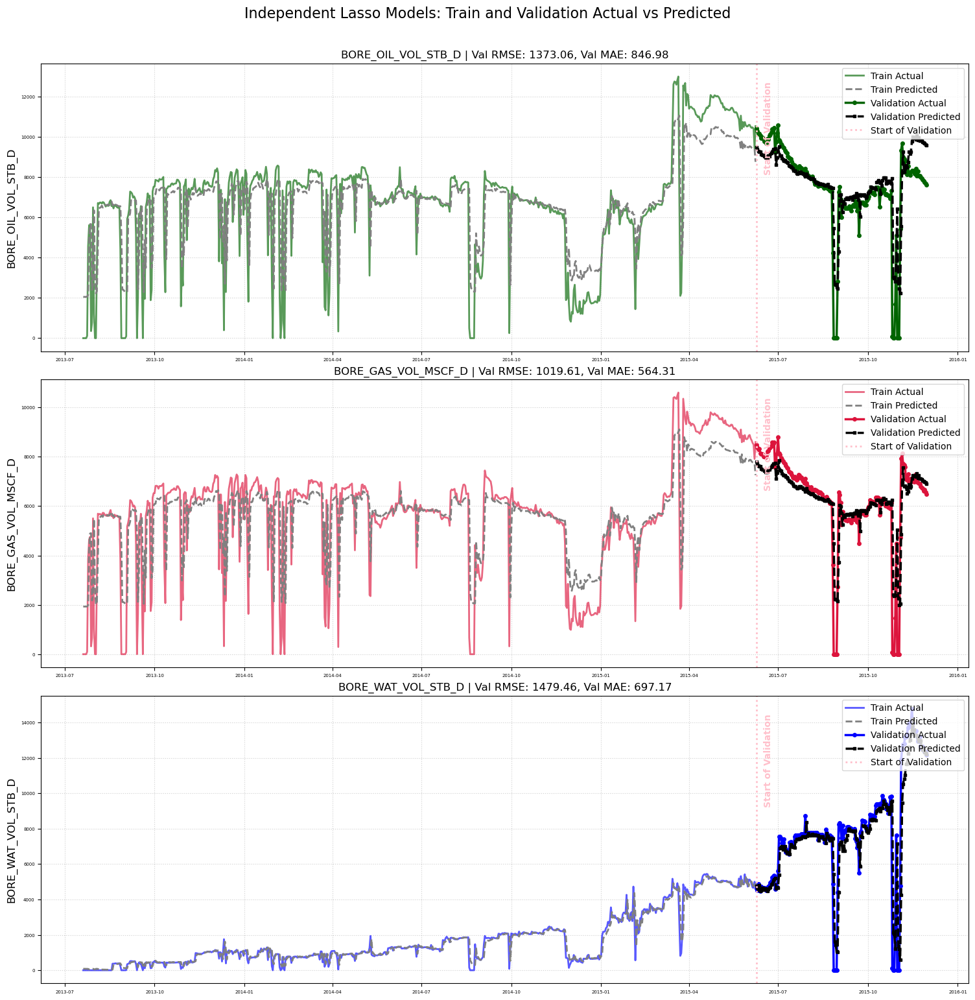

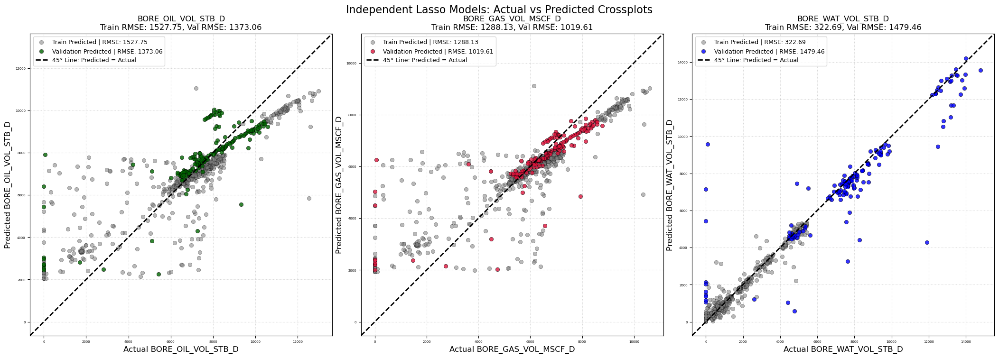

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,Independent Lasso Models,BORE_OIL_VOL_STB_D,1527.753386,954.964435,0.686308,1373.063328,846.980378,0.636112
1,Independent Lasso Models,BORE_GAS_VOL_MSCF_D,1288.126076,811.425762,0.664368,1019.608013,564.312980,0.704606
2,Independent Lasso Models,BORE_WAT_VOL_STB_D,322.685488,156.825232,0.953566,1479.460565,697.174668,0.777262


In [128]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

independent_train_pred_df, independent_val_pred_df, independent_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        models=Lasso_models,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=target_cols,
        model_name="Independent Lasso Models",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        drop_target_cols_from_X=True,
    )
)

independent_metrics_df

### Ridge

##### Train Model

In [129]:
def build_single_phase_ridge_grid(alphas=None,n_splits=10, scale_target=True,):
    """
    Build a separately tuned Ridge regression model for one phase.
    """
    if alphas is None:
        # Ridge often needs a much wider alpha range than Lasso.
        alphas = np.logspace(-4, 6, 300)

    ridge_pipe = Pipeline(
        steps=[
            ("scaler", StandardScaler()),
            (
                "model",
                Ridge(
                    solver="auto",
                    tol=1e-5,
                ),
            ),
        ]
    )

    if scale_target:
        ridge_estimator = TransformedTargetRegressor(
            regressor=ridge_pipe,
            transformer=StandardScaler(),
        )

        param_grid = {"regressor__model__alpha": alphas}

    else:
        ridge_estimator = ridge_pipe

        param_grid = {
            "model__alpha": alphas
        }
    ts_cv = TimeSeriesSplit(n_splits=n_splits)

    ridge_grid = GridSearchCV(estimator=ridge_estimator, param_grid=param_grid,cv=ts_cv, scoring="neg_root_mean_squared_error",n_jobs=-1,refit=True,)
    return ridge_grid

In [130]:
# fit three independent Ridge models
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

#X_train_model = X_train.drop(columns=target_cols,errors="ignore",)

In [131]:
ridge_models = {}
ridge_grid_searches = {}
ridge_model_summary = []

for target in target_cols:
    print(f"\nFitting Ridge model for {target}...")

    ridge_grid = build_single_phase_ridge_grid( alphas=np.logspace(-4, 6, 300),n_splits=10,scale_target=True,)

    ridge_grid.fit(X_train,y_train[target],)

    ridge_grid_searches[target] = ridge_grid
    ridge_models[target] = ridge_grid.best_estimator_

    best_alpha = ridge_grid.best_params_[
        "regressor__model__alpha"
    ]

    ridge_model_summary.append(
        {
            "Phase": target,
            "Best_Alpha": best_alpha,
            "Best_CV_RMSE": -ridge_grid.best_score_,
        }
    )

ridge_model_summary_df = pd.DataFrame(
    ridge_model_summary
)

ridge_model_summary_df


Fitting Ridge model for BORE_OIL_VOL_STB_D...

Fitting Ridge model for BORE_GAS_VOL_MSCF_D...

Fitting Ridge model for BORE_WAT_VOL_STB_D...


,Phase,Best_Alpha,Best_CV_RMSE
0,BORE_OIL_VOL_STB_D,142.510267,1557.654927
1,BORE_GAS_VOL_MSCF_D,153.918552,1312.148214
2,BORE_WAT_VOL_STB_D,7.071285,344.126519


In [132]:
oil_ridge_model = ridge_models["BORE_OIL_VOL_STB_D"]
gas_ridge_model = ridge_models["BORE_GAS_VOL_MSCF_D"]
water_ridge_model = ridge_models["BORE_WAT_VOL_STB_D"]

In [133]:
ridge_coefficient_rows = []

feature_names = X_train.columns

for target, model in ridge_models.items():

    fitted_ridge = (model.regressor_.named_steps["model"])
    phase_coef_df = pd.DataFrame(
        {
            "Target": target,
            "Feature": feature_names,
            "Coefficient": fitted_ridge.coef_,
        }
    )

    phase_coef_df["Absolute_Coefficient"] = (phase_coef_df["Coefficient"].abs())
    phase_coef_df["Best_Alpha"] = (ridge_grid_searches[target].best_params_["regressor__model__alpha"])
    ridge_coefficient_rows.append(phase_coef_df)

ridge_coefficient_df = (pd.concat(ridge_coefficient_rows,ignore_index=True,).sort_values(["Target","Absolute_Coefficient",],
        ascending=[True,False,],
    ).reset_index(drop=True))

In [134]:
#oil
ridge_coefficient_df[ridge_coefficient_df["Target"]=="BORE_OIL_VOL_STB_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Best_Alpha
0,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,0.244129,0.244129,142.510267
1,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.240489,0.240489,142.510267
2,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_1D,0.091996,0.091996,142.510267
3,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_9D,0.085874,0.085874,142.510267
4,BORE_OIL_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_1D,0.077732,0.077732,142.510267
5,BORE_OIL_VOL_STB_D,AVG_ANNULUS_PRESS_PSI_lag_1D,-0.049050,0.049050,142.510267
6,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_4D,0.046423,0.046423,142.510267
7,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D_lag_4D,0.046171,0.046171,142.510267
8,BORE_OIL_VOL_STB_D,GOR_MSCF_STB_lag_1D,0.040284,0.040284,142.510267
9,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_7D,0.039084,0.039084,142.510267


In [135]:
#gas
ridge_coefficient_df[ridge_coefficient_df["Target"]=="BORE_GAS_VOL_MSCF_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Best_Alpha
0,BORE_GAS_VOL_MSCF_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.248356,0.248356,153.918552
1,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_1D,0.238006,0.238006,153.918552
2,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,0.090312,0.090312,153.918552
3,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_9D,0.081586,0.081586,153.918552
4,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D_lag_1D,0.066329,0.066329,153.918552
5,BORE_GAS_VOL_MSCF_D,GOR_MSCF_STB_lag_1D,0.060629,0.060629,153.918552
6,BORE_GAS_VOL_MSCF_D,BORE_GAS_VOL_MSCF_D_lag_4D,0.050396,0.050396,153.918552
7,BORE_GAS_VOL_MSCF_D,AVG_ANNULUS_PRESS_PSI_lag_1D,-0.046900,0.046900,153.918552
8,BORE_GAS_VOL_MSCF_D,WCUT_lag_1D,-0.045558,0.045558,153.918552
9,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_7D,0.043430,0.043430,153.918552


In [136]:
#gas
ridge_coefficient_df[ridge_coefficient_df["Target"]=="BORE_WAT_VOL_STB_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Best_Alpha
0,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_1D,0.542928,0.542928,7.071285
1,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_3D,0.158872,0.158872,7.071285
2,BORE_WAT_VOL_STB_D,AVG_DOWNHOLE_TEMPERATURE_F_lag_7D,-0.089003,0.089003,7.071285
3,BORE_WAT_VOL_STB_D,DP_CHOKE_SIZE_PSI_lag_1D,-0.083566,0.083566,7.071285
4,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_7D,0.083130,0.083130,7.071285
5,BORE_WAT_VOL_STB_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.074056,0.074056,7.071285
6,BORE_WAT_VOL_STB_D,WCUT_lag_1D,0.061431,0.061431,7.071285
7,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_10D,0.060189,0.060189,7.071285
8,BORE_WAT_VOL_STB_D,AVG_DOWNHOLE_PRESSURE_PSI_lag_7D,0.059985,0.059985,7.071285
9,BORE_WAT_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_3D,-0.056897,0.056897,7.071285


##### Ridge Model Prediction on TRAIN & Predict Val

In [137]:
train_predictions = pd.DataFrame(
    index=X_train.index
)

val_predictions = pd.DataFrame(
    index=X_val.index
)

for target, model in ridge_models.items():
    train_predictions[target] = model.predict(X_train)
    val_predictions[target] = model.predict(X_val)

##### Ridge Model Prediction on Val

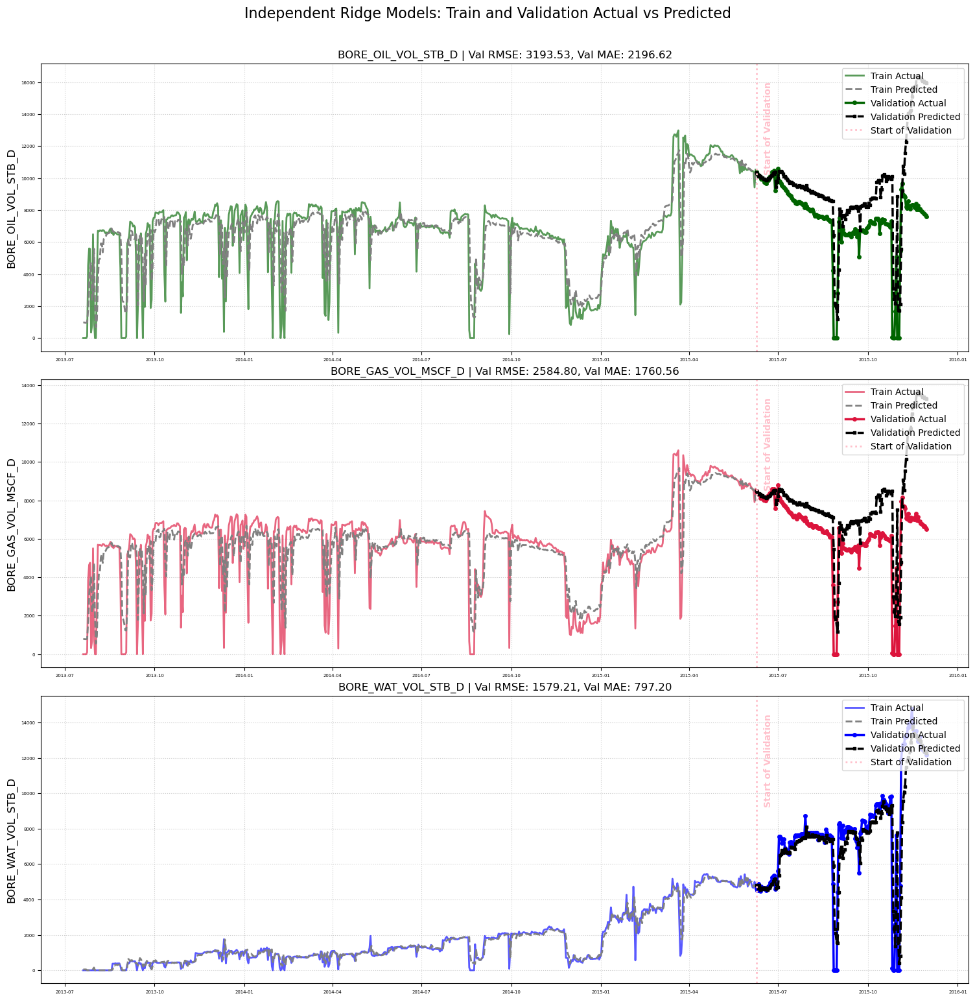

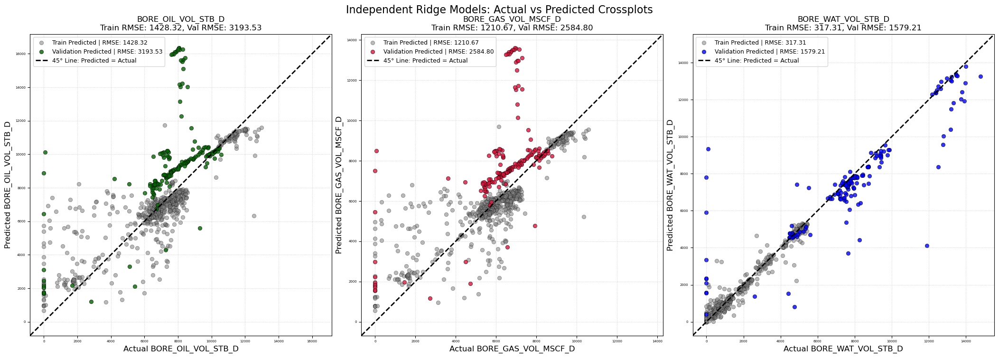

,Model,Phase,Train_RMSE,Train_MAE,Train_R2,Val_RMSE,Val_MAE,Val_R2
0,Independent Ridge Models,BORE_OIL_VOL_STB_D,1428.318225,867.415766,0.725813,3193.534082,2196.622056,-0.968474
1,Independent Ridge Models,BORE_GAS_VOL_MSCF_D,1210.667237,740.190244,0.703520,2584.798665,1760.556468,-0.898407
2,Independent Ridge Models,BORE_WAT_VOL_STB_D,317.307750,161.255605,0.955101,1579.213844,797.203179,0.746213


In [138]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

independent_train_pred_df, independent_val_pred_df, independent_metrics_df = (
    plot_multi_phase_train_val_diagnostics(
        models=ridge_models,
        X_train=X_train,
        y_train=y_train,
        X_val=X_val,
        y_val=y_val,
        target_cols=target_cols,
        model_name="Independent Ridge Models",
        start_of_val_date=start_of_val_date,
        clip_negative=True,
        make_combined_plots=True,
        drop_target_cols_from_X=True,
    )
)

independent_metrics_df

### Elastic Net

##### Train Model

In [139]:
def build_single_phase_elasticnet_grid(
    alphas=None,
    l1_ratios=None,
    n_splits=10,
    scale_target=True,
):
    """
    Build an independently tuned ElasticNet model for one production phase.
    """

    if alphas is None:
        alphas = np.logspace(-4, 3, 200)

    if l1_ratios is None:
        l1_ratios = [0.01,0.05,0.10,0.20,0.30,0.50,0.70,0.80,0.90,0.95,0.99, 1.00,]

    elasticnet_pipe = Pipeline(
        steps=[
            (
                "scaler",
                StandardScaler(),
            ),
            (
                "model",
                ElasticNet(max_iter=500000,tol=1e-5,selection="cyclic",random_state=42,),
            ),
        ]
    )

    if scale_target:
        elasticnet_estimator = TransformedTargetRegressor(
            regressor=elasticnet_pipe,
            transformer=StandardScaler(),
        )

        param_grid = {
            "regressor__model__alpha": alphas,
            "regressor__model__l1_ratio": l1_ratios,
        }

    else:
        elasticnet_estimator = elasticnet_pipe

        param_grid = {
            "model__alpha": alphas,
            "model__l1_ratio": l1_ratios,
        }

    ts_cv = TimeSeriesSplit(
        n_splits=n_splits
    )

    elasticnet_grid = GridSearchCV(estimator=elasticnet_estimator,param_grid=param_grid,cv=ts_cv,scoring="neg_root_mean_squared_error",n_jobs=-1,refit=True,)

    return elasticnet_grid

In [140]:
# fit one elasticnet per phase
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

#X_train_model = X_train.drop(columns=target_cols,errors="ignore",)

In [141]:
elasticnet_models = {}
elasticnet_grid_searches = {}
elasticnet_model_summary = []

for target in target_cols:
    print(f"\nFitting ElasticNet model for {target}...")

    elasticnet_grid = build_single_phase_elasticnet_grid(
        alphas=np.logspace(-4, 2, 200),
        l1_ratios=[0.01, 0.05, 0.10, 0.20, 0.30, 0.50, 0.70, 0.80, 0.90, 0.95, 0.99, 1.00, ],
        n_splits=10,
        scale_target=True,
    )

    elasticnet_grid.fit(
        X_train,
        y_train[target],
    )

    elasticnet_grid_searches[target] = (
        elasticnet_grid
    )

    elasticnet_models[target] = (
        elasticnet_grid.best_estimator_
    )

    elasticnet_model_summary.append(
        {
            "Phase": target,
            "Best_Alpha": elasticnet_grid.best_params_[
                "regressor__model__alpha"
            ],
            "Best_L1_Ratio": elasticnet_grid.best_params_[
                "regressor__model__l1_ratio"
            ],
            "Best_CV_RMSE": -elasticnet_grid.best_score_,
        }
    )


elasticnet_model_summary_df = pd.DataFrame(
    elasticnet_model_summary
)

elasticnet_model_summary_df


Fitting ElasticNet model for BORE_OIL_VOL_STB_D...

Fitting ElasticNet model for BORE_GAS_VOL_MSCF_D...

Fitting ElasticNet model for BORE_WAT_VOL_STB_D...


,Phase,Best_Alpha,Best_L1_Ratio,Best_CV_RMSE
0,BORE_OIL_VOL_STB_D,0.222195,0.2,1611.165120
1,BORE_GAS_VOL_MSCF_D,0.207292,0.2,1325.883359
2,BORE_WAT_VOL_STB_D,0.017028,0.7,348.057396


In [142]:

oil_elasticnet_models = elasticnet_models["BORE_OIL_VOL_STB_D"]
gas_elasticnet_modelsel = elasticnet_models["BORE_GAS_VOL_MSCF_D"]
water_elasticnet_models = elasticnet_models["BORE_WAT_VOL_STB_D"]

In [143]:
elasticnet_coefficient_rows = []

feature_names = X_train.columns

for target, model in elasticnet_models.items():

    fitted_elasticnet = (
        model
        .regressor_
        .named_steps["model"]
    )

    phase_coef_df = pd.DataFrame(
        {
            "Target": target,
            "Feature": feature_names,
            "Coefficient": fitted_elasticnet.coef_,
        }
    )

    phase_coef_df["Absolute_Coefficient"] = (phase_coef_df["Coefficient"].abs())

    phase_coef_df["Selected"] = (phase_coef_df["Coefficient"] != 0)

    phase_coef_df["Best_Alpha"] = (elasticnet_grid_searches[target].best_params_["regressor__model__alpha"])

    phase_coef_df["Best_L1_Ratio"] = (elasticnet_grid_searches[target].best_params_["regressor__model__l1_ratio"])

    elasticnet_coefficient_rows.append(phase_coef_df)


elasticnet_coefficient_df = (
    pd.concat(elasticnet_coefficient_rows,ignore_index=True,).sort_values(
        [
            "Target",
            "Absolute_Coefficient",
        ],
        ascending=[
            True,
            False,
        ],
    )
    .reset_index(drop=True)
)

In [144]:
#oil
elasticnet_coefficient_df[elasticnet_coefficient_df["Target"]=="BORE_OIL_VOL_STB_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Selected,Best_Alpha,Best_L1_Ratio
0,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_1D,0.263884,0.263884,True,0.222195,0.2
1,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.248865,0.248865,True,0.222195,0.2
2,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_1D,0.109401,0.109401,True,0.222195,0.2
3,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_9D,0.064480,0.064480,True,0.222195,0.2
4,BORE_OIL_VOL_STB_D,BORE_OIL_VOL_STB_D_lag_4D,0.049220,0.049220,True,0.222195,0.2
5,BORE_OIL_VOL_STB_D,BORE_GAS_VOL_MSCF_D_lag_4D,0.035033,0.035033,True,0.222195,0.2
6,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_7D,0.020155,0.020155,True,0.222195,0.2
7,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_12D,0.018744,0.018744,True,0.222195,0.2
8,BORE_OIL_VOL_STB_D,AVG_CHOKE_SIZE_P_lag_3D,0.017965,0.017965,True,0.222195,0.2
9,BORE_OIL_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_1D,0.016016,0.016016,True,0.222195,0.2


In [145]:
#gas
elasticnet_coefficient_df[elasticnet_coefficient_df["Target"]=="BORE_GAS_VOL_MSCF_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Selected,Best_Alpha,Best_L1_Ratio
0,BORE_GAS_VOL_MSCF_D,BORE_GAS_VOL_MSCF_D_lag_1D,0.276346,0.276346,True,0.207292,0.2
1,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_1D,0.261280,0.261280,True,0.207292,0.2
2,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_1D,0.099447,0.099447,True,0.207292,0.2
3,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_9D,0.057497,0.057497,True,0.207292,0.2
4,BORE_GAS_VOL_MSCF_D,BORE_GAS_VOL_MSCF_D_lag_4D,0.045481,0.045481,True,0.207292,0.2
5,BORE_GAS_VOL_MSCF_D,BORE_OIL_VOL_STB_D_lag_4D,0.038129,0.038129,True,0.207292,0.2
6,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_12D,0.017752,0.017752,True,0.207292,0.2
7,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_7D,0.015417,0.015417,True,0.207292,0.2
8,BORE_GAS_VOL_MSCF_D,AVG_CHOKE_SIZE_P_lag_3D,0.010221,0.010221,True,0.207292,0.2
9,BORE_GAS_VOL_MSCF_D,BORE_WAT_VOL_STB_D_lag_1D,0.007103,0.007103,True,0.207292,0.2


In [146]:
#water
elasticnet_coefficient_df[elasticnet_coefficient_df["Target"]=="BORE_WAT_VOL_STB_D"].reset_index(drop=True).head(10)

,Target,Feature,Coefficient,Absolute_Coefficient,Selected,Best_Alpha,Best_L1_Ratio
0,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_1D,0.718226,0.718226,True,0.017028,0.7
1,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_3D,0.102539,0.102539,True,0.017028,0.7
2,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_7D,0.063101,0.063101,True,0.017028,0.7
3,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_10D,0.057131,0.057131,True,0.017028,0.7
4,BORE_WAT_VOL_STB_D,BORE_WAT_VOL_STB_D_lag_6D,0.020853,0.020853,True,0.017028,0.7
5,BORE_WAT_VOL_STB_D,WCUT_lag_1D,0.010219,0.010219,True,0.017028,0.7
6,BORE_WAT_VOL_STB_D,week,-0.009492,0.009492,True,0.017028,0.7
7,BORE_WAT_VOL_STB_D,AVG_ANNULUS_PRESS_PSI_lag_1D,-0.006353,0.006353,True,0.017028,0.7
8,BORE_WAT_VOL_STB_D,DP_CHOKE_SIZE_PSI_lag_1D,-0.002290,0.002290,True,0.017028,0.7
9,BORE_WAT_VOL_STB_D,ON_STREAM_HRS_lag_1D,-0.000000,0.000000,False,0.017028,0.7


##### ElasticNetPrediction on TRAIN & Val

In [147]:
#X_val_model = X_val.drop(
    #columns=target_cols,
    #errors="ignore",
#)

In [148]:
train_predictions = pd.DataFrame(
    index=X_train.index
)

val_predictions = pd.DataFrame(
    index=X_val.index
)

for target, model in elasticnet_models.items():
    train_predictions[target] = model.predict(X_train)
    val_predictions[target] = model.predict(X_val_model)

NameError: name 'X_val_model' is not defined

#### Elastic Model Prediction on Val


In [ ]:
(
    elasticnet_train_pred_df,
    elasticnet_val_pred_df,
    elasticnet_metrics_df,
) = plot_multi_phase_train_val_diagnostics(
    models=elasticnet_models,
    X_train=X_train,
    y_train=y_train,
    X_val=X_val,
    y_val=y_val,
    target_cols=target_cols,
    model_name="Independent ElasticNet Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    drop_target_cols_from_X=True,
)

elasticnet_metrics_df

### Random Forest

#### Train Model & Predict Val

In [ ]:
def tune_single_phase_random_forest_optuna(
    X_train,
    y_train,
    phase_name,
    X_val=None,
    y_val=None,
    n_trials=60,
    n_splits=5,
    model_n_jobs=1,
    optuna_n_jobs=8,
    random_state=42,
    clip_negative=True,
    timeout=None,
    verbose=True,
):
    """
    Tune one independent RandomForestRegressor using Optuna and
    time-series cross-validation.

    Parallelization
    ---------------
    model_n_jobs:
        Number of cores used by each Random Forest trial.

    optuna_n_jobs:
        Number of Optuna trials evaluated concurrently.

    Recommended starting configuration:

        model_n_jobs=1
        optuna_n_jobs=8

    Returns
    -------
    best_model
        Random Forest fitted on all training data.

    study
        Completed Optuna study.

    metrics_df
        CV, train, and optional validation metrics.

    feature_importance_df
        Feature importance table.

    val_pred_series
        Validation predictions, or None when validation data was
        not provided.
    """

    # --------------------------------------------------
    # 1. Validate and align data
    # --------------------------------------------------
    if not isinstance(X_train, pd.DataFrame):
        raise TypeError(
            "X_train must be a pandas DataFrame."
        )

    if isinstance(y_train, pd.DataFrame):
        if phase_name not in y_train.columns:
            raise KeyError(
                f"{phase_name} is missing from y_train."
            )

        y_train_phase = y_train[phase_name].copy()

    else:
        y_train_phase = pd.Series(
            y_train,
            index=X_train.index,
            name=phase_name,
        )

    y_train_phase = (
        y_train_phase
        .reindex(X_train.index)
        .astype(float)
    )

    valid_train_mask = y_train_phase.notna()

    X_train_fit = X_train.loc[
        valid_train_mask
    ].copy()

    y_train_fit = y_train_phase.loc[
        valid_train_mask
    ].copy()

    if len(X_train_fit) <= n_splits:
        raise ValueError(
            "Not enough training rows for TimeSeriesSplit. "
            f"Rows: {len(X_train_fit)}, "
            f"n_splits: {n_splits}."
        )

    if X_val is not None:
        if not isinstance(X_val, pd.DataFrame):
            raise TypeError(
                "X_val must be a pandas DataFrame."
            )

        missing_val_features = [
            feature
            for feature in X_train_fit.columns
            if feature not in X_val.columns
        ]

        if missing_val_features:
            raise ValueError(
                "X_val is missing features used by X_train:\n"
                f"{missing_val_features}"
            )

        X_val_fit = X_val.loc[
            :,
            X_train_fit.columns,
        ].copy()

    else:
        X_val_fit = None

    if y_val is not None:
        if isinstance(y_val, pd.DataFrame):
            if phase_name not in y_val.columns:
                raise KeyError(
                    f"{phase_name} is missing from y_val."
                )

            y_val_phase = y_val[
                phase_name
            ].copy()

        else:
            if X_val_fit is None:
                raise ValueError(
                    "X_val must be supplied when y_val is supplied."
                )

            y_val_phase = pd.Series(
                y_val,
                index=X_val_fit.index,
                name=phase_name,
            )

        y_val_phase = (
            y_val_phase
            .reindex(X_val_fit.index)
            .astype(float)
        )

    else:
        y_val_phase = None

    # --------------------------------------------------
    # 2. Time-series cross-validation
    # --------------------------------------------------
    time_series_cv = TimeSeriesSplit(
        n_splits=n_splits
    )

    # --------------------------------------------------
    # 3. Optuna objective
    # --------------------------------------------------
    def objective(trial):

        bootstrap = trial.suggest_categorical("bootstrap",[True],)

        params = {
            "n_estimators": trial.suggest_int("n_estimators",200,2000,step=100,),

            "criterion": trial.suggest_categorical("criterion",["squared_error","friedman_mse"],),

            "max_depth": trial.suggest_categorical("max_depth",[3,4,5,6,8,10,12],),

            "min_samples_split": trial.suggest_float("min_samples_split",0.1,0.4, step=0.02),   #only looks at the Parent Node before the split.

            "min_samples_leaf": trial.suggest_float("min_samples_leaf",0.02,0.15, step=0.02), # of rows per leaf. looks at the Child Nodes resulting from the split. make sure it doesn't overlap with the min_sample leaf

            "max_features": trial.suggest_float( "max_features",0.1,0.5,step=0.05,),

            "bootstrap": bootstrap,

            "ccp_alpha": trial.suggest_float("ccp_alpha",1e-8,1e-3,log=True,),

            "random_state": random_state,

            # Important: each trial uses one core.
            "n_jobs": model_n_jobs,
        }

        if bootstrap:
            params["max_samples"] = (trial.suggest_float("max_samples",0.60,0.85,step=0.05,))

        else:
            params["max_samples"] = None

        fold_rmse_scores = []

        for fold_number, (
            train_index,
            cv_index,
        ) in enumerate(
            time_series_cv.split(X_train_fit),
            start=1,
        ):
            X_fold_train = X_train_fit.iloc[
                train_index
            ]

            y_fold_train = y_train_fit.iloc[
                train_index
            ]

            X_fold_cv = X_train_fit.iloc[
                cv_index
            ]

            y_fold_cv = y_train_fit.iloc[
                cv_index
            ]

            model = RandomForestRegressor(
                **params
            )

            model.fit(
                X_fold_train,
                y_fold_train,
            )

            fold_prediction = model.predict(
                X_fold_cv
            )

            if clip_negative:
                fold_prediction = np.clip(
                    fold_prediction,
                    0,
                    None,
                )

            fold_rmse = root_mean_squared_error(
                y_fold_cv,
                fold_prediction,
            )

            fold_rmse_scores.append(
                fold_rmse
            )

            running_mean_rmse = float(
                np.mean(fold_rmse_scores)
            )

            # Allow Optuna to prune weak trials after folds.
            trial.report(running_mean_rmse,step=fold_number,)

            if trial.should_prune():
                raise optuna.TrialPruned()

        trial.set_user_attr(
            "CV_RMSE_STD",
            float(np.std(fold_rmse_scores)),
        )

        return float(
            np.mean(fold_rmse_scores)
        )

    # --------------------------------------------------
    # 4. Create and run the study
    # --------------------------------------------------
    sampler = optuna.samplers.TPESampler(
        seed=random_state,
    )

    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=10,
        n_warmup_steps=2,
    )

    study = optuna.create_study(
        direction="minimize",
        sampler=sampler,
        pruner=pruner,
        study_name=f"{phase_name}_random_forest",
    )

    study.optimize(
        objective,
        n_trials=n_trials,
        timeout=timeout,

        # Eight concurrent single-core trials.
        n_jobs=optuna_n_jobs,

        gc_after_trial=True,
        show_progress_bar=False,
    )

    # --------------------------------------------------
    # 5. Recover the best parameters
    # --------------------------------------------------
    best_params = study.best_trial.params.copy()

    if not best_params["bootstrap"]:
        best_params["max_samples"] = None

    best_params.update(
        {
            "random_state": random_state,
            "n_jobs": model_n_jobs,
        }
    )

    # --------------------------------------------------
    # 6. Fit best model on all training data
    # --------------------------------------------------
    best_model = RandomForestRegressor(
        **best_params
    )

    best_model.fit(
        X_train_fit,
        y_train_fit,
    )

    # --------------------------------------------------
    # 7. Training predictions and metrics
    # --------------------------------------------------
    train_prediction = best_model.predict(
        X_train_fit
    )

    if clip_negative:
        train_prediction = np.clip(
            train_prediction,
            0,
            None,
        )

    train_rmse = root_mean_squared_error(
        y_train_fit,
        train_prediction,
    )

    train_mae = mean_absolute_error(
        y_train_fit,
        train_prediction,
    )

    train_r2 = r2_score(
        y_train_fit,
        train_prediction,
    )

    # --------------------------------------------------
    # 8. Optional validation predictions
    # --------------------------------------------------
    val_pred_series = None

    val_rmse = np.nan
    val_mae = np.nan
    val_r2 = np.nan
    n_val_points = 0

    if (
        X_val_fit is not None
        and y_val_phase is not None
    ):
        val_prediction = best_model.predict(
            X_val_fit
        )

        if clip_negative:
            val_prediction = np.clip(
                val_prediction,
                0,
                None,
            )

        val_pred_series = pd.Series(
            val_prediction,
            index=X_val_fit.index,
            name=phase_name,
        )

        valid_val_mask = (
            y_val_phase.notna()
            & val_pred_series.notna()
        )

        y_val_valid = y_val_phase.loc[
            valid_val_mask
        ]

        val_pred_valid = val_pred_series.loc[
            valid_val_mask
        ]

        n_val_points = len(
            y_val_valid
        )

        if n_val_points > 0:
            val_rmse = root_mean_squared_error(
                y_val_valid,
                val_pred_valid,
            )

            val_mae = mean_absolute_error(
                y_val_valid,
                val_pred_valid,
            )

            if n_val_points >= 2:
                val_r2 = r2_score(
                    y_val_valid,
                    val_pred_valid,
                )

    # --------------------------------------------------
    # 9. Metrics table
    # --------------------------------------------------
    metrics_df = pd.DataFrame(
        [
            {
                "Phase": phase_name,
                "Best_CV_RMSE": study.best_value,
                "CV_RMSE_STD": (
                    study.best_trial.user_attrs.get(
                        "CV_RMSE_STD",
                        np.nan,
                    )
                ),
                "Train_RMSE": train_rmse,
                "Train_MAE": train_mae,
                "Train_R2": train_r2,
                "Val_RMSE": val_rmse,
                "Val_MAE": val_mae,
                "Val_R2": val_r2,
                "N_Train_Points": len(
                    y_train_fit
                ),
                "N_Val_Points": n_val_points,
                "Best_N_Estimators": (best_params["n_estimators"]),
                "Best_Max_Depth": (best_params["max_depth"]),
                "Best_Min_Samples_Split": (best_params["min_samples_split"]),
                "Best_Min_Samples_Leaf": (best_params["min_samples_leaf"]),
                "Best_Max_Features": (best_params["max_features"]),
                "Best_Bootstrap": (best_params["bootstrap"]),
                "Best_Max_Samples": (best_params["max_samples"]),
                "Best_CCP_Alpha": (best_params["ccp_alpha"]),
            }
        ]
    )

    # --------------------------------------------------
    # 10. Feature importance
    # --------------------------------------------------
    feature_importance_df = (
        pd.DataFrame(
            {
                "Phase": phase_name,
                "Feature": X_train_fit.columns,
                "Importance":
                    best_model.feature_importances_,
            }
        ).sort_values("Importance",ascending=False,).reset_index(drop=True))

    if verbose:
        print(
            f"\n{phase_name}"
        )
        print(f"Best CV RMSE: "f"{study.best_value:,.4f}")
        print(f"Best parameters:\n"f"{best_params}")
        if X_val_fit is not None:
            print(f"Validation RMSE: "f"{val_rmse:,.4f}")
            
    return (best_model,study,metrics_df,feature_importance_df,val_pred_series,)

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]



In [ ]:
# Start the timer
start_time = time.perf_counter()
#------------------------------------------------------------------------------------------
random_forest_models = {}
random_forest_studies = {}

random_forest_metric_frames = []
random_forest_importance_frames = []

random_forest_val_pred_df = pd.DataFrame(index=X_val_model.index)


for target in target_cols:
    print("\n"+ "=" * 80)

    print(f"Tuning Random Forest for {target}")

    (
        best_phase_model,
        phase_study,
        phase_metrics_df,
        phase_importance_df,
        phase_val_pred,
    ) = tune_single_phase_random_forest_optuna(
        X_train=X_train,
        y_train=y_train[target],
        phase_name=target,

        X_val=X_val,
        y_val=y_val[target],

        n_trials=60,
        n_splits=5,

        # One core for each Random Forest.
        model_n_jobs=-1,

        # Eight concurrent Optuna trials.
        optuna_n_jobs=1,

        random_state=42,
        clip_negative=True,
        verbose=True,
    )

    random_forest_models[target] = (best_phase_model)

    random_forest_studies[target] = (phase_study)

    random_forest_metric_frames.append(phase_metrics_df)

    random_forest_importance_frames.append(phase_importance_df)

    random_forest_val_pred_df[target] = (phase_val_pred)
#--------------------------------------------------------------------------------------------------_#
    # End the timer
end_time = time.perf_counter()

# Calculate and print execution time
elapsed_time = end_time - start_time
print(f"Process finished in {elapsed_time:.6f} seconds")

In [ ]:
# combine the results
random_forest_metrics_df = pd.concat(
    random_forest_metric_frames,
    ignore_index=True,
)

random_forest_metrics_df

In [ ]:
# feature importance  
random_forest_feature_importance_df = pd.concat(
    random_forest_importance_frames,
    ignore_index=True,
)



In [ ]:
# oil 
random_forest_feature_importance_df[random_forest_feature_importance_df["Phase"]=="BORE_OIL_VOL_STB_D"].reset_index()

In [ ]:
# gas
random_forest_feature_importance_df[random_forest_feature_importance_df["Phase"]=="BORE_GAS_VOL_MSCF_D"].reset_index()

In [ ]:
# water
random_forest_feature_importance_df[random_forest_feature_importance_df["Phase"]=="BORE_WAT_VOL_STB_D"].reset_index()

##### Train Val

#### Plot RF MODEL

In [ ]:
(
    random_forest_train_pred_df,
    random_forest_val_pred_df,
    random_forest_diagnostic_metrics_df,
) = plot_multi_phase_train_val_diagnostics(
    models=random_forest_models,
    X_train=X_train,
    y_train=y_train,
    X_val=X_val_model,
    y_val=y_val,
    target_cols=target_cols,
    model_name="Independent Random Forest Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    drop_target_cols_from_X=True,
)

random_forest_diagnostic_metrics_df

### Gradient Boost 


#### Train Model

In [ ]:
def tune_single_phase_gradient_boost_optuna(
    X_train,
    y_train,
    phase_name,
    X_val=None,
    y_val=None,
    n_trials=60,
    n_splits=5,
    optuna_n_jobs=8,
    random_state=42,
    clip_negative=True,
    timeout=None,
    verbose=True,
):
    """
    Tune one independent GradientBoostingRegressor using Optuna
    and TimeSeriesSplit.

    GradientBoostingRegressor does not have an n_jobs parameter.
    Parallelism is applied across Optuna trials.

    Returns
    -------
    best_model
        Best GradientBoostingRegressor fitted on all training data.

    study
        Completed Optuna study.

    metrics_df
        CV, train, and optional validation metrics.

    feature_importance_df
        Feature importance table.

    val_pred_series
        Validation predictions, or None.
    """

    # --------------------------------------------------
    # 1. Validate and align training data
    # --------------------------------------------------
    if not isinstance(X_train, pd.DataFrame):
        raise TypeError(
            "X_train must be a pandas DataFrame."
        )

    if isinstance(y_train, pd.DataFrame):
        if phase_name not in y_train.columns:
            raise KeyError(
                f"{phase_name} is missing from y_train."
            )

        y_train_phase = y_train[
            phase_name
        ].copy()

    else:
        y_train_phase = pd.Series(
            y_train,
            index=X_train.index,
            name=phase_name,
        )

    y_train_phase = (
        y_train_phase
        .reindex(X_train.index)
        .astype(float)
    )

    valid_train_mask = y_train_phase.notna()

    X_train_fit = X_train.loc[
        valid_train_mask
    ].copy()

    y_train_fit = y_train_phase.loc[
        valid_train_mask
    ].copy()

    if len(X_train_fit) <= n_splits:
        raise ValueError(
            "Not enough rows for TimeSeriesSplit. "
            f"Rows: {len(X_train_fit)}, "
            f"n_splits: {n_splits}."
        )

    # --------------------------------------------------
    # 2. Prepare optional validation data
    # --------------------------------------------------
    X_val_fit = None
    y_val_phase = None

    if X_val is not None:
        if not isinstance(X_val, pd.DataFrame):
            raise TypeError(
                "X_val must be a pandas DataFrame."
            )

        missing_features = [
            feature
            for feature in X_train_fit.columns
            if feature not in X_val.columns
        ]

        if missing_features:
            raise ValueError(
                "X_val is missing training features:\n"
                f"{missing_features}"
            )

        X_val_fit = X_val.loc[
            :,
            X_train_fit.columns,
        ].copy()

    if y_val is not None:
        if X_val_fit is None:
            raise ValueError(
                "X_val must be supplied when y_val is supplied."
            )

        if isinstance(y_val, pd.DataFrame):
            if phase_name not in y_val.columns:
                raise KeyError(
                    f"{phase_name} is missing from y_val."
                )

            y_val_phase = y_val[
                phase_name
            ].copy()

        else:
            y_val_phase = pd.Series(
                y_val,
                index=X_val_fit.index,
                name=phase_name,
            )

        y_val_phase = (
            y_val_phase
            .reindex(X_val_fit.index)
            .astype(float)
        )

    # --------------------------------------------------
    # 3. Time-series CV
    # --------------------------------------------------
    time_series_cv = TimeSeriesSplit(
        n_splits=n_splits
    )

    # --------------------------------------------------
    # 4. Optuna objective
    # --------------------------------------------------
    def objective(trial):

        loss = trial.suggest_categorical("loss",["squared_error","huber","absolute_error",],)

        params = {"loss": loss,

            "n_estimators": trial.suggest_int("n_estimators",100,1000,step=50,),

            "learning_rate": trial.suggest_float("learning_rate",0.003,0.20,log=True,),

            "max_depth": trial.suggest_categorical("max_depth",[2,3,4,5],),

            "min_samples_split": trial.suggest_float("min_samples_split",0.1,0.4, step=0.05),   #only looks at the Parent Node before the split.

            "min_samples_leaf": trial.suggest_float("min_samples_leaf",0.02,0.1, step=0.01), # of rows per leaf. looks at the Child Nodes resulting from the split. make sure it doesn't overlap with the min_sample leaf

            "subsample": trial.suggest_float("subsample",0.50,0.9,step=0.05,),

            "max_features": trial.suggest_float( "max_features",0.1,0.5,step=0.05,),

            "criterion": trial.suggest_categorical("criterion",["friedman_mse","squared_error",],),

            "ccp_alpha": trial.suggest_float("ccp_alpha",1e-8,1e-2,log=True,),

            # Disable built-in random validation split.
            # TimeSeriesSplit is being used instead.
            "n_iter_no_change": None,

            "random_state": random_state,
        }

        # Alpha is used by Huber loss.
        if loss == "huber":
            params["alpha"] = trial.suggest_float("alpha",0.75,0.99,)

        fold_rmse_scores = []

        for fold_number, (
            fold_train_index,
            fold_val_index,
        ) in enumerate(
            time_series_cv.split(X_train_fit),
            start=1,
        ):
            X_fold_train = X_train_fit.iloc[
                fold_train_index
            ]

            y_fold_train = y_train_fit.iloc[
                fold_train_index
            ]

            X_fold_val = X_train_fit.iloc[
                fold_val_index
            ]

            y_fold_val = y_train_fit.iloc[
                fold_val_index
            ]

            model = GradientBoostingRegressor(
                **params
            )

            model.fit(
                X_fold_train,
                y_fold_train,
            )

            fold_prediction = model.predict(
                X_fold_val
            )

            if clip_negative:
                fold_prediction = np.clip(
                    fold_prediction,
                    0,
                    None,
                )

            fold_rmse = root_mean_squared_error(
                y_fold_val,
                fold_prediction,
            )

            fold_rmse_scores.append(
                fold_rmse
            )

            running_mean_rmse = float(
                np.mean(fold_rmse_scores)
            )

            trial.report(
                running_mean_rmse,
                step=fold_number,
            )

            if trial.should_prune():
                raise optuna.TrialPruned()

        trial.set_user_attr(
            "CV_RMSE_STD",
            float(np.std(fold_rmse_scores)),
        )

        return float(
            np.mean(fold_rmse_scores)
        )

    # --------------------------------------------------
    # 5. Run Optuna
    # --------------------------------------------------
    sampler = optuna.samplers.TPESampler(
        seed=random_state,
    )

    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=10,
        n_warmup_steps=2,
    )

    study = optuna.create_study(
        direction="minimize",
        sampler=sampler,
        pruner=pruner,
        study_name=(
            f"{phase_name}_gradient_boost"
        ),
    )

    study.optimize(
        objective,
        n_trials=n_trials,
        timeout=timeout,
        n_jobs=optuna_n_jobs,
        gc_after_trial=True,
        show_progress_bar=False,
    )

    # --------------------------------------------------
    # 6. Recover best parameters
    # --------------------------------------------------
    best_params = (
        study.best_trial.params.copy()
    )

    best_params.update(
        {
            "n_iter_no_change": None,
            "random_state": random_state,
        }
    )

    # --------------------------------------------------
    # 7. Fit final model
    # --------------------------------------------------
    best_model = GradientBoostingRegressor(
        **best_params
    )

    best_model.fit(
        X_train_fit,
        y_train_fit,
    )

    # --------------------------------------------------
    # 8. Train predictions
    # --------------------------------------------------
    train_prediction = best_model.predict(
        X_train_fit
    )

    if clip_negative:
        train_prediction = np.clip(
            train_prediction,
            0,
            None,
        )

    train_rmse = root_mean_squared_error(
        y_train_fit,
        train_prediction,
    )

    train_mae = mean_absolute_error(
        y_train_fit,
        train_prediction,
    )

    train_r2 = r2_score(
        y_train_fit,
        train_prediction,
    )

    # --------------------------------------------------
    # 9. Optional validation predictions
    # --------------------------------------------------
    val_pred_series = None

    val_rmse = np.nan
    val_mae = np.nan
    val_r2 = np.nan
    n_val_points = 0

    if (
        X_val_fit is not None
        and y_val_phase is not None
    ):
        val_prediction = best_model.predict(
            X_val_fit
        )

        if clip_negative:
            val_prediction = np.clip(
                val_prediction,
                0,
                None,
            )

        val_pred_series = pd.Series(
            val_prediction,
            index=X_val_fit.index,
            name=phase_name,
        )

        valid_val_mask = (
            y_val_phase.notna()
            & val_pred_series.notna()
        )

        y_val_valid = y_val_phase.loc[
            valid_val_mask
        ]

        val_pred_valid = val_pred_series.loc[
            valid_val_mask
        ]

        n_val_points = len(y_val_valid)

        if n_val_points > 0:
            val_rmse = root_mean_squared_error(
                y_val_valid,
                val_pred_valid,
            )

            val_mae = mean_absolute_error(
                y_val_valid,
                val_pred_valid,
            )

            if n_val_points >= 2:
                val_r2 = r2_score(
                    y_val_valid,
                    val_pred_valid,
                )

    # --------------------------------------------------
    # 10. Metrics table
    # --------------------------------------------------
    metrics_df = pd.DataFrame(
        [
            {
                "Phase": phase_name,
                "Best_CV_RMSE": study.best_value,
                "CV_RMSE_STD": (
                    study.best_trial.user_attrs.get(
                        "CV_RMSE_STD",
                        np.nan,
                    )
                ),
                "Train_RMSE": train_rmse,
                "Train_MAE": train_mae,
                "Train_R2": train_r2,
                "Val_RMSE": val_rmse,
                "Val_MAE": val_mae,
                "Val_R2": val_r2,
                "N_Train_Points": len(
                    y_train_fit
                ),
                "N_Val_Points": n_val_points,
                "Best_Loss": best_params["loss"],
                "Best_N_Estimators": (
                    best_params["n_estimators"]
                ),
                "Best_Learning_Rate": (
                    best_params["learning_rate"]
                ),
                "Best_Max_Depth": (
                    best_params["max_depth"]
                ),
                "Best_Min_Samples_Split": (
                    best_params[
                        "min_samples_split"
                    ]
                ),
                "Best_Min_Samples_Leaf": (
                    best_params[
                        "min_samples_leaf"
                    ]
                ),
                "Best_Subsample": (
                    best_params["subsample"]
                ),
                "Best_Max_Features": (
                    best_params["max_features"]
                ),
                "Best_CCP_Alpha": (
                    best_params["ccp_alpha"]
                ),
                "Best_Huber_Alpha": (
                    best_params.get(
                        "alpha",
                        np.nan,
                    )
                ),
            }
        ]
    )

    # --------------------------------------------------
    # 11. Feature importance
    # --------------------------------------------------
    feature_importance_df = (
        pd.DataFrame(
            {
                "Phase": phase_name,
                "Feature": X_train_fit.columns,
                "Importance":
                    best_model.feature_importances_,
            }
        )
        .sort_values(
            "Importance",
            ascending=False,
        )
        .reset_index(drop=True)
    )

    if verbose:
        print(
            f"\n{phase_name}"
        )

        print(
            f"Best CV RMSE: "
            f"{study.best_value:,.4f}"
        )

        print(
            "Best parameters:"
        )

        print(best_params)

        if X_val_fit is not None:
            print(
                f"Validation RMSE: "
                f"{val_rmse:,.4f}"
            )

    return (
        best_model,
        study,
        metrics_df,
        feature_importance_df,
        val_pred_series,
    )

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]



In [ ]:
# Start the timer
#start_time = time.perf_counter()
#------------------------------------------------------------------------------------------ 
#gradient_boost_models = {}
#gradient_boost_studies = {}

#gradient_boost_metric_frames = []
#gradient_boost_importance_frames = []

#gradient_boost_val_pred_df = pd.DataFrame(
   # index=X_val_model.index
#)


#for target in target_cols:
    #print("\n"+ "=" * 80)

    #print(f"Tuning Gradient Boosting for {target}")

    #(
        #best_phase_model,
        #phase_study,
        #phase_metrics_df,
        #phase_importance_df,
        #phase_val_pred,
    #) = tune_single_phase_gradient_boost_optuna(
        #X_train=X_train_model,
        #y_train=y_train[target],
        #phase_name=target,

        #X_val=X_val_model,
        #y_val=y_val[target],

        #n_trials=60,
        #n_splits=5,

        # GradientBoostingRegressor has no n_jobs.
        # Parallelize Optuna trials instead.
        #optuna_n_jobs=8,

        #random_state=42,
        #clip_negative=True,
        #verbose=True,
    #)

    #gradient_boost_models[target] = (best_phase_model)

    #gradient_boost_studies[target] = (phase_study)

    #gradient_boost_metric_frames.append(phase_metrics_df)

    #gradient_boost_importance_frames.append(phase_importance_df)

    #gradient_boost_val_pred_df[target] = (phase_val_pred)
#---------------------------------------------------------------------------------------#
    # End the timer

#end_time = time.perf_counter()



# Calculate and print execution time

#elapsed_time = end_time - start_time

#print(f"Process finished in {elapsed_time:.6f} seconds")

In [ ]:
# Parallel runs

# Start the timer
start_time = time.perf_counter()
#------------------------------------------------------------------------------------------ 

from joblib import Parallel, delayed
import pandas as pd


# --------------------------------------------------
# Containers
# --------------------------------------------------
gradient_boost_models = {}
gradient_boost_studies = {}

gradient_boost_metric_frames = []
gradient_boost_importance_frames = []

gradient_boost_val_pred_df = pd.DataFrame(
    index=X_val_model.index
)


# --------------------------------------------------
# Run oil, gas, and water tuning in parallel
# --------------------------------------------------
phase_results = Parallel(
    n_jobs=3,
    backend="loky",
)(
    delayed(tune_single_phase_gradient_boost_optuna)(
        X_train=X_train,
        y_train=y_train[target],
        phase_name=target,
        X_val=X_val,
        y_val=y_val[target],
        n_trials=60,
        n_splits=5,

        # One sequential Optuna study inside each process
        optuna_n_jobs=1,

        random_state=42,
        clip_negative=True,
        verbose=False,
    )
    for target in target_cols
)


# --------------------------------------------------
# Unpack and store each phase result
# --------------------------------------------------
for target, result in zip(
    target_cols,
    phase_results,
):
    (
        best_phase_model,
        phase_study,
        phase_metrics_df,
        phase_importance_df,
        phase_val_pred,
    ) = result

    gradient_boost_models[target] = (
        best_phase_model
    )

    gradient_boost_studies[target] = (
        phase_study
    )

    gradient_boost_metric_frames.append(
        phase_metrics_df
    )

    gradient_boost_importance_frames.append(
        phase_importance_df
    )

    if phase_val_pred is not None:
        gradient_boost_val_pred_df[target] = (
            phase_val_pred.reindex(
                gradient_boost_val_pred_df.index
            )
        )
#---------------------------------------------------------------------------------------#
    # End the timer

end_time = time.perf_counter()


# Calculate and print execution time

elapsed_time = end_time - start_time

print(f"Process finished in {elapsed_time:.6f} seconds")

In [ ]:
gradient_boost_metrics_df = pd.concat(
    gradient_boost_metric_frames,
    ignore_index=True,
)

gradient_boost_feature_importance_df = pd.concat(
    gradient_boost_importance_frames,
    ignore_index=True,
)

In [ ]:
gradient_boost_metrics_df

In [ ]:
gradient_boost_feature_importance_df

In [ ]:
#oil 
gradient_boost_feature_importance_df[gradient_boost_feature_importance_df["Phase"]=="BORE_OIL_VOL_STB_D"].reset_index()

In [ ]:
#gas
gradient_boost_feature_importance_df[gradient_boost_feature_importance_df["Phase"]=="BORE_GAS_VOL_MSCF_D"].reset_index()


In [ ]:
#water
gradient_boost_feature_importance_df[gradient_boost_feature_importance_df["Phase"]=="BORE_WAT_VOL_STB_D"].reset_index()

In [ ]:
# fitted models
oil_gradient_boost_model = gradient_boost_models[
    "BORE_OIL_VOL_STB_D"
]

gas_gradient_boost_model = gradient_boost_models[
    "BORE_GAS_VOL_MSCF_D"
]

water_gradient_boost_model = gradient_boost_models[
    "BORE_WAT_VOL_STB_D"
]

#### Plot Gradient Boost

In [ ]:
(
    gradient_boost_train_pred_df,
    gradient_boost_val_pred_df,
    gradient_boost_diagnostic_metrics_df,
) = plot_multi_phase_train_val_diagnostics(
    models=gradient_boost_models,
    X_train=X_train,
    y_train=y_train,
    X_val=X_val,
    y_val=y_val,
    target_cols=target_cols,
    model_name="Independent Gradient Boosting Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    drop_target_cols_from_X=True,
)

gradient_boost_diagnostic_metrics_df

### Light GBM
LightGBM’s linear_tree=True makes each leaf fit a linear model instead of a constant value.<br>
Splits are still chosen normally, but each leaf becomes linear, and recommends rescaling features because the leaf models are linear.<br>
linear_tree=True increases memory use and works with CPU/GPU device types and serial tree learner.<br>

#### Train Model & Predict Val

In [ ]:
def tune_single_phase_lightgbm_optuna(
    X_train,
    y_train,
    phase_name,
    X_val=None,
    y_val=None,
    n_trials=60,
    n_splits=5,
    model_n_jobs=4,
    random_state=42,
    clip_negative=True,
    verbose=True,
):
    """
    Tune one independent LightGBM model.

    Optuna chooses:
        linear_tree=False
        or
        linear_tree=True

    Cross-validation objective:
        minimize mean time-series CV RMSE

    Returns
    -------
    best_model
        Fitted Pipeline:
        StandardScaler -> LGBMRegressor

    study
        Optuna study.

    metrics_df
        Train, validation, and CV metrics.

    feature_importance_df
        Split and gain feature importance.

    val_pred_series
        Validation predictions.
    """

    # ==================================================
    # 1. Validate X_train
    # ==================================================
    if not isinstance(X_train, pd.DataFrame):
        raise TypeError(
            "X_train must be a pandas DataFrame."
        )

    X_train_fit = X_train.copy()

    # Replace infinities but preserve NaN values.
    X_train_fit = X_train_fit.replace(
        [np.inf, -np.inf],
        np.nan,
    )

    non_numeric_cols = [
        col
        for col in X_train_fit.columns
        if not pd.api.types.is_numeric_dtype(
            X_train_fit[col]
        )
    ]

    if non_numeric_cols:
        raise TypeError(
            "All model features must be numeric. "
            f"Non-numeric columns: {non_numeric_cols}"
        )

    # ==================================================
    # 2. Prepare y_train
    # ==================================================
    if isinstance(y_train, pd.DataFrame):

        if phase_name not in y_train.columns:
            raise KeyError(
                f"{phase_name} not found in y_train."
            )

        y_train_fit = y_train[
            phase_name
        ].copy()

    elif isinstance(y_train, pd.Series):

        y_train_fit = y_train.copy()

    else:

        y_train_array = np.asarray(
            y_train
        ).reshape(-1)

        if len(y_train_array) != len(X_train_fit):
            raise ValueError(
                "X_train and y_train have different lengths."
            )

        y_train_fit = pd.Series(
            y_train_array,
            index=X_train_fit.index,
            name=phase_name,
        )

    y_train_fit = (
        y_train_fit
        .reindex(X_train_fit.index)
        .astype(float)
    )

    # Drop only rows with missing target values.
    valid_train_mask = y_train_fit.notna()

    X_train_fit = X_train_fit.loc[
        valid_train_mask
    ].copy()

    y_train_fit = y_train_fit.loc[
        valid_train_mask
    ].copy()

    if len(X_train_fit) <= n_splits:
        raise ValueError(
            "Not enough observations for TimeSeriesSplit. "
            f"Rows={len(X_train_fit)}, "
            f"n_splits={n_splits}."
        )

    # ==================================================
    # 3. Prepare validation data
    # ==================================================
    X_val_fit = None
    y_val_fit = None

    if X_val is not None:

        if not isinstance(X_val, pd.DataFrame):
            raise TypeError(
                "X_val must be a pandas DataFrame."
            )

        missing_features = [
            col
            for col in X_train_fit.columns
            if col not in X_val.columns
        ]

        if missing_features:
            raise ValueError(
                "X_val is missing training features: "
                f"{missing_features}"
            )

        X_val_fit = (
            X_val
            .loc[:, X_train_fit.columns]
            .copy()
            .replace(
                [np.inf, -np.inf],
                np.nan,
            )
        )

    if y_val is not None:

        if X_val_fit is None:
            raise ValueError(
                "X_val must be supplied when y_val is supplied."
            )

        if isinstance(y_val, pd.DataFrame):

            if phase_name not in y_val.columns:
                raise KeyError(
                    f"{phase_name} not found in y_val."
                )

            y_val_fit = y_val[
                phase_name
            ].copy()

        elif isinstance(y_val, pd.Series):

            y_val_fit = y_val.copy()

        else:

            y_val_array = np.asarray(
                y_val
            ).reshape(-1)

            if len(y_val_array) != len(X_val_fit):
                raise ValueError(
                    "X_val and y_val have different lengths."
                )

            y_val_fit = pd.Series(
                y_val_array,
                index=X_val_fit.index,
                name=phase_name,
            )

        y_val_fit = (
            y_val_fit
            .reindex(X_val_fit.index)
            .astype(float)
        )

    # ==================================================
    # 4. Time-series CV
    # ==================================================
    time_series_cv = TimeSeriesSplit(
        n_splits=n_splits
    )

    cv_splits = list(
        time_series_cv.split(X_train_fit)
    )

    # ==================================================
    # 5. Optuna objective
    # ==================================================
    def objective(trial):

        # Optuna chooses ordinary or linear leaves.
        linear_tree = trial.suggest_categorical("linear_tree",[False, True],)
        
        max_depth = trial.suggest_int("max_depth",1,4,)

        maximum_num_leaves = min(16,2 ** max_depth,)

        num_leaves = trial.suggest_int("num_leaves",2,maximum_num_leaves,)

        num_rows, num_cols = X_train.shape

        
  
        max_child_samples = max(num_cols + 5, int(num_rows * 0.10))
        min_child_samples = trial.suggest_int("min_child_samples", 0.5*num_cols, 10*max_child_samples)        

        params = {
            # ------------------------------------------
            # Fixed settings
            # ------------------------------------------
            "boosting_type": "gbdt",
            "objective": "regression",
            "metric": "rmse",

            "linear_tree": linear_tree,

            "device_type": "cpu",
            "tree_learner": "serial",

            # ------------------------------------------
            # Tuned settings
            # ------------------------------------------
            "n_estimators": trial.suggest_int("n_estimators",100,1000,step=50,),

            "learning_rate": trial.suggest_float("learning_rate",0.001,0.2,log=True,),

            # Keep trees relatively shallow because
            # the dataset is small.
            "max_depth": max_depth,
            
            "num_leaves": num_leaves,

            "min_child_samples": min_child_samples, # A leaf must have at least      # roughly the same number of rows as features to run a safe regression

            "min_child_weight": trial.suggest_float("min_child_weight",1e-4,10.0,log=True,),

            "min_split_gain": trial.suggest_float("min_split_gain",0.0,1.0,),

            "subsample": trial.suggest_float("subsample",0.60,1.00,step=0.05,),

            "subsample_freq": trial.suggest_int("subsample_freq",1,7,),

            "colsample_bytree": trial.suggest_float("colsample_bytree",0.3,0.8,step=0.05,),

            "reg_alpha": trial.suggest_float("reg_alpha",1e-8,10.0,log=True,),

            "reg_lambda": trial.suggest_float("reg_lambda",1e-8,10.0,log=True,),

            "max_bin": trial.suggest_categorical("max_bin",[31,63,127,255,],),

            # ------------------------------------------
            # CPU and reproducibility
            # ------------------------------------------
            "n_jobs": model_n_jobs,
            "random_state": random_state,
            "verbosity": -1,
        }

        # Only linear trees need linear-leaf regularization.
        if linear_tree:

            params["linear_lambda"] = (
                trial.suggest_float(
                    "linear_lambda",
                    1e-6,
                    100.0,
                    log=True,
                )
            )

        else:

            params["linear_lambda"] = 0.0

        fold_rmse_scores = []

        # ----------------------------------------------
        # Time-series cross-validation
        # ----------------------------------------------
        for fold_number, (
            fold_train_index,
            fold_val_index,
        ) in enumerate(
            cv_splits,
            start=1,
        ):
            X_fold_train = X_train_fit.iloc[
                fold_train_index
            ]

            y_fold_train = y_train_fit.iloc[
                fold_train_index
            ]

            X_fold_val = X_train_fit.iloc[
                fold_val_index
            ]

            y_fold_val = y_train_fit.iloc[
                fold_val_index
            ]

            # The scaler is fitted only on the current
            # fold's training period.
            fold_model = Pipeline(
                steps=[
                    (
                        "scaler",
                        StandardScaler().set_output(
                            transform="pandas"
                        ),
                    ),
                    (
                        "model",
                        LGBMRegressor(
                            **params
                        ),
                    ),
                ]
            )

            fold_model.fit(
                X_fold_train,
                y_fold_train,
            )

            fold_prediction = fold_model.predict(
                X_fold_val
            )

            if clip_negative:
                fold_prediction = np.clip(
                    fold_prediction,
                    0,
                    None,
                )

            fold_rmse = root_mean_squared_error(
                y_fold_val,
                fold_prediction,
            )

            fold_rmse_scores.append(
                fold_rmse
            )

            running_cv_rmse = float(
                np.mean(fold_rmse_scores)
            )

            trial.report(
                running_cv_rmse,
                step=fold_number,
            )

            if trial.should_prune():
                raise optuna.TrialPruned()

        trial.set_user_attr(
            "CV_RMSE_STD",
            float(
                np.std(fold_rmse_scores)
            ),
        )

        return float(
            np.mean(fold_rmse_scores)
        )

    # ==================================================
    # 6. Optuna study
    # ==================================================
    sampler = optuna.samplers.TPESampler(
        seed=random_state,
    )

    pruner = optuna.pruners.MedianPruner(
        n_startup_trials=10,
        n_warmup_steps=2,
    )

    study = optuna.create_study(
        direction="minimize",
        sampler=sampler,
        pruner=pruner,
        study_name=(
            f"{phase_name}_lightgbm"
        ),
    )

    # Trials run sequentially inside this phase.
    study.optimize(
        objective,
        n_trials=n_trials,
        n_jobs=1,
        gc_after_trial=True,
        show_progress_bar=False,
    )

    # ==================================================
    # 7. Recover best parameters
    # ==================================================
    best_params = (
        study.best_trial.params.copy()
    )

    if not best_params["linear_tree"]:
        best_params["linear_lambda"] = 0.0

    best_params.update(
        {
            "boosting_type": "gbdt",
            "objective": "regression",
            "metric": "rmse",
            "device_type": "cpu",
            "tree_learner": "serial",
            "n_jobs": model_n_jobs,
            "random_state": random_state,
            "verbosity": -1,
        }
    )

    # ==================================================
    # 8. Fit final model
    # ==================================================
    best_model = Pipeline(
        steps=[
            (
                "scaler",
                StandardScaler().set_output(
                    transform="pandas"
                ),
            ),
            (
                "model",
                LGBMRegressor(
                    **best_params
                ),
            ),
        ]
    )

    best_model.fit(
        X_train_fit,
        y_train_fit,
    )

    # ==================================================
    # 9. Training metrics
    # ==================================================
    train_prediction = best_model.predict(
        X_train_fit
    )

    if clip_negative:
        train_prediction = np.clip(
            train_prediction,
            0,
            None,
        )

    train_rmse = root_mean_squared_error(
        y_train_fit,
        train_prediction,
    )

    train_mae = mean_absolute_error(
        y_train_fit,
        train_prediction,
    )

    train_r2 = r2_score(
        y_train_fit,
        train_prediction,
    )

    # ==================================================
    # 10. Validation metrics
    # ==================================================
    val_pred_series = None

    val_rmse = np.nan
    val_mae = np.nan
    val_r2 = np.nan
    n_val_points = 0

    if (
        X_val_fit is not None
        and y_val_fit is not None
    ):
        val_prediction = best_model.predict(
            X_val_fit
        )

        if clip_negative:
            val_prediction = np.clip(
                val_prediction,
                0,
                None,
            )

        val_pred_series = pd.Series(
            val_prediction,
            index=X_val_fit.index,
            name=phase_name,
        )

        valid_val_mask = (
            y_val_fit.notna()
            & val_pred_series.notna()
        )

        y_val_valid = y_val_fit.loc[
            valid_val_mask
        ]

        val_pred_valid = val_pred_series.loc[
            valid_val_mask
        ]

        n_val_points = len(
            y_val_valid
        )

        if n_val_points > 0:

            val_rmse = root_mean_squared_error(
                y_val_valid,
                val_pred_valid,
            )

            val_mae = mean_absolute_error(
                y_val_valid,
                val_pred_valid,
            )

            if n_val_points >= 2:

                val_r2 = r2_score(
                    y_val_valid,
                    val_pred_valid,
                )

    # ==================================================
    # 11. Metrics table
    # ==================================================
    metrics_df = pd.DataFrame(
        [
            {
                "Phase": phase_name,

                "Best_CV_RMSE":
                    study.best_value,

                "CV_RMSE_STD":
                    study.best_trial.user_attrs.get(
                        "CV_RMSE_STD",
                        np.nan,
                    ),

                "Best_Linear_Tree":
                    best_params["linear_tree"],

                "Best_Linear_Lambda":
                    best_params["linear_lambda"],

                "Best_N_Estimators":
                    best_params["n_estimators"],

                "Best_Learning_Rate":
                    best_params["learning_rate"],

                "Best_Max_Depth":
                    best_params["max_depth"],

                "Best_Num_Leaves":
                    best_params["num_leaves"],

                "Train_RMSE": train_rmse,
                "Train_MAE": train_mae,
                "Train_R2": train_r2,

                "Val_RMSE": val_rmse,
                "Val_MAE": val_mae,
                "Val_R2": val_r2,

                "N_Train_Points":
                    len(X_train_fit),

                "N_Val_Points":
                    n_val_points,
            }
        ]
    )

    # ==================================================
    # 12. Feature importance
    # ==================================================
    fitted_lgbm = (
        best_model.named_steps["model"]
    )

    split_importance = (
        fitted_lgbm.booster_.feature_importance(
            importance_type="split"
        )
    )

    gain_importance = (
        fitted_lgbm.booster_.feature_importance(
            importance_type="gain"
        )
    )

    total_gain = gain_importance.sum()

    if total_gain > 0:

        normalized_gain = (
            gain_importance / total_gain
        )

    else:

        normalized_gain = (
            gain_importance.astype(float)
        )

    feature_importance_df = (
        pd.DataFrame(
            {
                "Phase": phase_name,

                "Feature":
                    X_train_fit.columns,

                "Split_Importance":
                    split_importance,

                "Gain_Importance":
                    gain_importance,

                "Gain_Importance_Normalized":
                    normalized_gain,
            }
        )
        .sort_values(
            "Gain_Importance",
            ascending=False,
        )
        .reset_index(drop=True)
    )

    if verbose:

        print(
            "\n"
            + "=" * 80
        )

        print(
            f"Phase: {phase_name}"
        )

        print(
            f"Best CV RMSE: "
            f"{study.best_value:,.4f}"
        )

        print(
            f"Selected linear_tree: "
            f"{best_params['linear_tree']}"
        )

        print(
            f"Train RMSE: "
            f"{train_rmse:,.4f}"
        )

        if n_val_points > 0:

            print(
                f"Validation RMSE: "
                f"{val_rmse:,.4f}"
            )

        print(
            "Best parameters:"
        )

        print(best_params)

    return (
        best_model,
        study,
        metrics_df,
        feature_importance_df,
        val_pred_series,
    )

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]



In [ ]:
# Tune the model
def tune_lightgbm_phase(target):

    return tune_single_phase_lightgbm_optuna(
        X_train=X_train,
        y_train=y_train[target],
        phase_name=target,

        X_val=X_val,
        y_val=y_val[target],

        n_trials=60,
        n_splits=5,

        # Four LightGBM threads per phase.
        model_n_jobs=4,

        random_state=42,
        clip_negative=True,
        verbose=False,
    )

In [ ]:
# Parallel runs

# Start the timer
start_time = time.perf_counter()
#------------------------------------------------------------------------------------------ 

from joblib import Parallel, delayed
import pandas as pd

lightgbm_phase_results = Parallel(
    n_jobs=3,
    backend="loky",
    verbose=10,
)(
    delayed(tune_lightgbm_phase)(
        target
    )
    for target in target_cols
)
#---------------------------------------------------------------------------------------#
    # End the timer

end_time = time.perf_counter()


# Calculate and print execution time

elapsed_time = end_time - start_time

print(f"Process finished in {elapsed_time:.6f} seconds")

In [ ]:
lightgbm_models = {}
lightgbm_studies = {}

lightgbm_metric_frames = []
lightgbm_importance_frames = []

lightgbm_val_pred_df = pd.DataFrame(
    index=X_val.index
)


for target, result in zip(
    target_cols,
    lightgbm_phase_results,
):
    (
        best_phase_model,
        phase_study,
        phase_metrics_df,
        phase_importance_df,
        phase_val_pred,
    ) = result

    lightgbm_models[target] = (
        best_phase_model
    )

    lightgbm_studies[target] = (
        phase_study
    )

    lightgbm_metric_frames.append(
        phase_metrics_df
    )

    lightgbm_importance_frames.append(
        phase_importance_df
    )

    if phase_val_pred is not None:

        lightgbm_val_pred_df[target] = (
            phase_val_pred.reindex(
                lightgbm_val_pred_df.index
            )
        )

In [ ]:
lightgbm_metrics_df = pd.concat(
    lightgbm_metric_frames,
    ignore_index=True,
)

lightgbm_metrics_df

In [ ]:
lightgbm_feature_importance_df = pd.concat(lightgbm_importance_frames,ignore_index=True,)

In [ ]:
#oil 
lightgbm_feature_importance_df[lightgbm_feature_importance_df["Phase"]=="BORE_OIL_VOL_STB_D"]

In [ ]:
#gas 
lightgbm_feature_importance_df[lightgbm_feature_importance_df["Phase"]=="BORE_GAS_VOL_MSCF_D"]

In [ ]:
#water
lightgbm_feature_importance_df[lightgbm_feature_importance_df["Phase"]=="BORE_WAT_VOL_STB_D"]

In [ ]:
(
    lightgbm_train_pred_df,
    lightgbm_val_pred_df,
    lightgbm_diagnostic_metrics_df,
) = plot_multi_phase_train_val_diagnostics(
    models=lightgbm_models,

    X_train=X_train,
    y_train=y_train,

    X_val=X_val,
    y_val=y_val,

    target_cols=target_cols,

    model_name=(
        "Independent LightGBM Linear-Tree Models"
    ),

    start_of_val_date=start_of_val_date,

    clip_negative=True,
    make_combined_plots=True,

    drop_target_cols_from_X=True,
)

lightgbm_diagnostic_metrics_df

# PIPELINE FEATURE ENGINEERING & MODELLING FOR RECURSIVE
There is a slight modiffcation in the pipleine for recursive compared to the one-step look ahead. I need to drop the targets in the pipeline over here in phase_column_dropper. <br>
The Recursive model is the final ones that will be deployed. It will take an horizon window as input. The recursive model will then forecast recusively for that time window at the end of that time horizon it will then reset and fetch the actual real data at that time. <br> As a check, if the horizon window is one day, the recursive model will be exactly like the one step look ahead. 


## PipeLine

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

In [ ]:
#Based on my domain knowlege these are variables I know that will be strong predictors. So I want these variables to be there, to prevent data leakage, I have shifted by 1 day

specific_lag1_adder = AddSpecificLag1Features(
    #variables=['ON_STREAM_HRS', "AVG_CHOKE_SIZE_P", 'BORE_OIL_VOL_STB_D','BORE_GAS_VOL_MSCF_D', 'BORE_WAT_VOL_STB_D'],
    variables=['ON_STREAM_HRS', 'AVG_CHOKE_SIZE_P', 'AVG_DOWNHOLE_PRESSURE_PSI',
       'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI',
       'AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI',
       'AVG_WHT_P', 'BORE_OIL_VOL_STB_D', 'BORE_GAS_VOL_MSCF_D',
       'BORE_WAT_VOL_STB_D', 'GOR_MSCF_STB', 'WCUT'],
    
    freq="1D",
    verbose=True,
)

In [ ]:
# this where the recursive pipeline is different than the one step look ahead
phase_column_dropper = DropFeatures(
    features_to_drop=[
        # raw same-day targets. ALways have to do this over here. different than the one step look ahead
        "BORE_OIL_VOL_STB_D",
        "BORE_GAS_VOL_MSCF_D",
        "BORE_WAT_VOL_STB_D",

        # raw same-day derived target features
        "GOR_MSCF_STB",
        "WCUT",
        
        # raw same-day uptime if not known in deployment,
        "ON_STREAM_HRS",
        "AVG_CHOKE_SIZE_P", 'AVG_DOWNHOLE_PRESSURE_PSI', 'AVG_DOWNHOLE_TEMPERATURE_F', 'AVG_DP_TUBING_PSI','AVG_ANNULUS_PRESS_PSI', 'DP_CHOKE_SIZE_PSI', 'AVG_WHP_P_PSI','AVG_WHT_P', 
    ]
)

In [ ]:
feature_pipe = Pipeline(
    [
        ("Create_GOR_WCUT_features", GOR_WCUT_feat),
        
        ("added_phase_lag_features", multioutput_lag_selector),
        #("added_rolling_window_features", phase_rolling_feat),
        #("added_expanding_window_features", expanding_feat),
        #("added_Time_features", trend_adder),
        #("added_RollingSlopeFeatures", slope_feat),
        #("added_curve_adder", curve_adder),

        #("added_phase_calendar_fourier_selector", phase_calendar_fourier_selector),        
        #("added_oil_calendar_fourier_selector", oil_calendar_fourier_selector),
        #("added_gas_calendar_fourier_selector", gas_calendar_fourier_selector),
        #("added_water_calendar_fourier_selector", water_calendar_fourier_selector),
        ("added_week_month_of_year_adder", week_month_of_year_adder),
        ("added_sin_cos_adder", sin_cos_adder),
        ("final_lagged_columns_by_1day", specific_lag1_adder),
        ("final_column_drop", phase_column_dropper), # drop GOR and WCUT & ON_STREAM_HRS at time t
        ("drop_missing_rows_once", final_nan_dropper),
        
    ]
)

In [ ]:
train_feat = feature_pipe.fit_transform(train_data)
#X_train = train_feat.copy()
#y_train = train_data[target_cols].loc[X_train.index]

# drop the target from the feat dataframe to make the final dataframe to use
X_train = train_feat.drop(columns=target_cols, errors='ignore')
#y_train = train_feat[target_col]


#grid.fit(X_train, y_train)
#best_lasso_model = grid.best_estimator_

In [ ]:
train_data

In [ ]:
forecast_horizon = 30

last_date = train_data.index.max()

future_index = pd.date_range(
    start=last_date + pd.Timedelta(days=1),
    periods=forecast_horizon,
    freq="D",
)

In [ ]:
train_data.columns

In [ ]:
# make fture exogenous df
future_exog_df = pd.DataFrame(index=future_index)

exog_cols = ['ON_STREAM_HRS',
             'AVG_CHOKE_SIZE_P', 
             'AVG_DOWNHOLE_PRESSURE_PSI',
             'AVG_DOWNHOLE_TEMPERATURE_F', 
             'AVG_DP_TUBING_PSI',
             'AVG_ANNULUS_PRESS_PSI', 
             'DP_CHOKE_SIZE_PSI', 
             'AVG_WHP_P_PSI',
             'AVG_WHT_P', 
             'GOR_MSCF_STB', 
             'WCUT']

forecast_horizon = 30

future_exog_df = val_data.iloc[:forecast_horizon].copy()

# Save actual validation targets before hiding them
y_val_recursive_actual = future_exog_df[target_cols].copy()

# Hide future target columns
future_exog_df[target_cols] = np.nan

# Also hide/drop future target-derived columns
future_exog_df[["GOR_MSCF_STB", "WCUT"]] = np.nan

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]

#for col in target_cols:
    #future_exog_df[col] = np.nan

## Walk-forward recursive Models, Train and validation
plot_multi_phase_train_walkforward_val_diagnostics has a clipper function in it to make sure that if the gradient boosting models predict a negative rate, it will change it to zero. It is like val_pred = np.maximum(0, val_pred_raw) in the onestep look ahead workflow above

### Lasso

In [ ]:
X_train.columns

In [ ]:
X_train

In [ ]:
Lasso_models

In [ ]:
#target_cols = [
    #"BORE_OIL_VOL_STB_D",
    #"BORE_GAS_VOL_MSCF_D",
    #"BORE_WAT_VOL_STB_D",
#]

#models = {
    #"BORE_OIL_VOL_STB_D": oil_model,
    #"BORE_GAS_VOL_MSCF_D": gas_model,
    #"BORE_WAT_VOL_STB_D": water_model,
#}

shared_model_feature_cols = (X_train.drop(columns=target_cols,errors="ignore",).columns.tolist())

(
    independent_walkforward_forecast_df,
    independent_recursive_history_df,
    independent_walkforward_metrics_df,
    independent_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=Lasso_models,
    feature_pipe=feature_pipe,
    train_data=train_data,
    val_data=val_data,
    target_cols=target_cols,
    model_feature_cols=shared_model_feature_cols,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)

independent_walkforward_metrics_df

In [ ]:
independent_walkforward_metrics_df

In [ ]:


(
    independent_train_pred_df,
    independent_walkforward_val_pred_df,
    independent_walkforward_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=Lasso_models,
    X_train=X_train,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=(
        independent_walkforward_forecast_df
    ),
    target_cols=target_cols,
    model_name="Independent Lasso Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=(
        independent_walkforward_metrics_df
    ),
    drop_target_cols_from_X=True,
)

independent_walkforward_metrics_df

### Ridge 

In [ ]:
ridge_model_feature_cols = (
    X_train.columns.tolist()
)

In [ ]:
(
    ridge_walkforward_forecast_df,
    ridge_recursive_history_df,
    ridge_walkforward_metrics_df,
    ridge_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=ridge_models,
    feature_pipe=feature_pipe,
    train_data=train_data,
    val_data=val_data,
    target_cols=target_cols,
    model_feature_cols=ridge_model_feature_cols,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)

ridge_walkforward_metrics_df


In [ ]:
(
    ridge_train_pred_df,
    ridge_walkforward_val_pred_df,
    ridge_diagnostic_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=ridge_models,
    X_train=X_train,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=(
        ridge_walkforward_forecast_df
    ),
    target_cols=target_cols,
    model_name="Independent Ridge Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=(
        ridge_walkforward_metrics_df
    ),
    drop_target_cols_from_X=True,
)

ridge_diagnostic_metrics_df

### ElasticNET

In [ ]:
elasticnet_model_feature_cols = (
    X_train_model.columns.tolist()
)

In [ ]:
(
    elasticnet_walkforward_forecast_df,
    elasticnet_recursive_history_df,
    elasticnet_walkforward_metrics_df,
    elasticnet_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=elasticnet_models,
    feature_pipe=feature_pipe,
    train_data=train_data,
    val_data=val_data,
    target_cols=target_cols,
    model_feature_cols=elasticnet_model_feature_cols,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)

elasticnet_walkforward_metrics_df

In [ ]:
(
    elasticnet_train_pred_df,
    elasticnet_walkforward_val_pred_df,
    elasticnet_diagnostic_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=elasticnet_models,
    X_train=X_train_model,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=(
        elasticnet_walkforward_forecast_df
    ),
    target_cols=target_cols,
    model_name="Independent ElasticNet Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=(
        elasticnet_walkforward_metrics_df
    ),
    drop_target_cols_from_X=True,
)

elasticnet_diagnostic_metrics_df

### Random Forest

In [ ]:
random_forest_model_feature_cols = (
    X_train_model.columns.tolist()
)

(
    random_forest_walkforward_forecast_df,
    random_forest_recursive_history_df,
    random_forest_walkforward_metrics_df,
    random_forest_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=random_forest_models,
    feature_pipe=feature_pipe,
    train_data=train_data,
    val_data=val_data,
    target_cols=target_cols,
    model_feature_cols=(
        random_forest_model_feature_cols
    ),
    forecast_horizon=30,
    exog_cols=exog_cols,
    clip_negative=True,
    verbose=True,
)

random_forest_walkforward_metrics_df

In [ ]:
(
    random_forest_train_pred_df,
    random_forest_walkforward_val_pred_df,
    random_forest_walkforward_diagnostic_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=random_forest_models,
    X_train=X_train_model,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=(
        random_forest_walkforward_forecast_df
    ),
    target_cols=target_cols,
    model_name="Independent Random Forest Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=(
        random_forest_walkforward_metrics_df
    ),
    drop_target_cols_from_X=True,
)

random_forest_walkforward_diagnostic_metrics_df

### Gradient Boost

In [ ]:
gradient_boost_model_feature_cols = (
    X_train_model.columns.tolist()
)

In [ ]:
(
    gradient_boost_walkforward_forecast_df,
    gradient_boost_recursive_history_df,
    gradient_boost_walkforward_metrics_df,
    gradient_boost_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=gradient_boost_models,
    feature_pipe=feature_pipe,
    train_data=train_data,
    val_data=val_data,
    target_cols=target_cols,
    model_feature_cols=(
        gradient_boost_model_feature_cols
    ),
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
)

gradient_boost_walkforward_metrics_df

In [ ]:
(
    gradient_boost_train_pred_df,
    gradient_boost_walkforward_val_pred_df,
    gradient_boost_walkforward_diagnostic_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=gradient_boost_models,
    X_train=X_train_model,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=(
        gradient_boost_walkforward_forecast_df
    ),
    target_cols=target_cols,
    model_name="Independent Gradient Boosting Models",
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=(
        gradient_boost_walkforward_metrics_df
    ),
    drop_target_cols_from_X=True,
)

gradient_boost_walkforward_diagnostic_metrics_df

### Light GBM

In [149]:
lightgbm_model_feature_cols = (
    X_train.columns.tolist()
)

In [150]:
(
    lightgbm_walkforward_forecast_df,
    lightgbm_recursive_history_df,
    lightgbm_walkforward_metrics_df,
    lightgbm_block_summary_df,
) = walk_forward_recursive_forecast_multiphase(
    models=lightgbm_models,

    feature_pipe=feature_pipe,

    train_data=train_data,
    val_data=val_data,

    target_cols=target_cols,

    model_feature_cols=(
        lightgbm_model_feature_cols
    ),

    forecast_horizon=30,

    exog_cols=None,

    clip_negative=True,
    verbose=True,
)

lightgbm_walkforward_metrics_df

NameError: name 'lightgbm_models' is not defined

In [ ]:
(
    lightgbm_train_pred_df,
    lightgbm_walkforward_val_pred_df,
    lightgbm_walkforward_diagnostic_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics(
    models=lightgbm_models,

    X_train=X_train,

    y_train=y_train,
    y_val=y_val,

    walk_forward_forecast_df=(
        lightgbm_walkforward_forecast_df
    ),

    target_cols=target_cols,

    model_name=(
        "Independent LightGBM Linear-Tree Models"
    ),

    start_of_val_date=start_of_val_date,

    clip_negative=True,
    make_combined_plots=True,

    walk_forward_metrics_df=(
        lightgbm_walkforward_metrics_df
    ),

    drop_target_cols_from_X=True,
)

lightgbm_walkforward_diagnostic_metrics_df

# FINAL MODEL MODEL
In this section, we are going to choose the best perform model for each phase from the recursive models. Idealy I should have done the model for each phase seperately, not using a multiregressor. But I have used a multiregressor so I need to fetch the best model for each phase in the multiregressor and that will be my final model

In [151]:
from Final_Model_and_Test import recursive_forecast_hybrid_multiphase
from Final_Model_and_Test import walk_forward_recursive_forecast_hybrid_multiphase
from Final_Model_and_Test import predict_hybrid_multiphase
from Final_Model_and_Test import plot_multi_phase_train_walkforward_val_diagnostics_FINAL

ModuleNotFoundError: No module named 'plot_train_val_predictions_time'

In [152]:
all_metrics_df = pd.concat([
    diagnostics_metrics_df_LASSO, 
    diagnostics_metrics_df_Ridge,
    diagnostics_metrics_df_ElasticNET,
    diagnostics_metrics_df_RandomForest,
    diagnostics_metrics_df_GradientBoost,
    diagnostics_metrics_df_LightGBM
])

NameError: name 'diagnostics_metrics_df_LASSO' is not defined

In [ ]:
all_metrics_df=all_metrics_df.sort_values(by='Val_MAE', ascending=True)
all_metrics_df

In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]


In [ ]:
model_feature_cols = X_train.columns.tolist()

In [ ]:
hybrid_model_name = (
    "Hybrid 30-Day Recursive | "
    "Oil: LightGMB Linear Tree | "
    "Gas: LightGMB Linear Tree | "
    "Water: Ridge"
)

In [ ]:
final_phase_model_map = {
    "BORE_OIL_VOL_STB_D": {
        "model": best_multitask_lgbm_linear_tree_model,
        "prediction_index": 0,
        "model_name": "LigthGBM Linear Tree",
    },

    "BORE_GAS_VOL_MSCF_D": {
        "model": best_multitask_lgbm_linear_tree_model,
        "prediction_index": 1,
        "model_name": "Random Forest",
    },

    "BORE_WAT_VOL_STB_D": {
        "model": best_multitask_ridge_model,
        "prediction_index": 2,
        "model_name": "Ridge",
    },
}

In [ ]:
(
    hybrid_walk_forward_forecast_df,
    hybrid_walk_forward_recursive_history_df,
    hybrid_walk_forward_metrics_df,
    hybrid_block_summary_df,
) = walk_forward_recursive_forecast_hybrid_multiphase(
    phase_model_map=final_phase_model_map,
    feature_pipe=feature_pipe,
    train_data=train_data.copy(),
    val_data=val_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
    model_name=hybrid_model_name,
)

In [ ]:
phase_source_model = {
    target: config["model_name"]
    for target, config in final_phase_model_map.items()
}

In [ ]:
hybrid_walk_forward_metrics_df["Phase_Model"] = (
    hybrid_walk_forward_metrics_df["Phase"].map(
        phase_source_model
    )
)

In [ ]:
hybrid_walk_forward_metrics_df

In [ ]:
hybrid_train_pred_df = predict_hybrid_multiphase(
    phase_model_map=final_phase_model_map,
    X=X_train,
    target_cols=target_cols,
    clip_negative=True,
)

In [ ]:
(
    hybrid_train_pred_df,
    hybrid_val_pred_df,
    hybrid_plot_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics_FINAL(
    model=None,
    X_train=X_train,
    y_train=y_train,
    y_val=y_val,
    walk_forward_forecast_df=hybrid_walk_forward_forecast_df,
    target_cols=target_cols,
    model_name=hybrid_model_name,
    start_of_val_date=start_of_val_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=hybrid_walk_forward_metrics_df,
    train_pred_df=hybrid_train_pred_df,
)

# Test model on test data

In [ ]:
hybrid_train_pred_df


In [ ]:
target_cols = [
    "BORE_OIL_VOL_STB_D",
    "BORE_GAS_VOL_MSCF_D",
    "BORE_WAT_VOL_STB_D",
]


In [ ]:
train_val_data = pd.concat([train_data, val_data],axis=0,).sort_index()

In [ ]:
train_val_feat = feature_pipe.fit_transform(train_val_data)

y_train_val = train_val_data[target_cols].loc[train_val_feat.index]

In [ ]:
# Transform validation with train context attached. I need to do all my pre processing with the shifted X and then unshift it back  
test_feat_with_context = feature_pipe.transform(X_test_shift)

# Remove context rows
test_feat = test_feat_with_context[test_feat_with_context.index >= start_of_test_date]

y_test = test_data[target_cols].loc[test_feat.index]

In [ ]:
# drop the target from the feat dataframe to make the final dataframe to use
X_train_val = train_val_feat.drop(columns=target_cols, errors='ignore')
#y_train = train_feat[target_col]

## Models
Only going to run the models again used for the selected phases

In [ ]:
best_multitask_lgbm_linear_tree_model.fit(X_train_val,y_train_val,)

best_multitask_lgbm_linear_tree_model.fit(X_train_val,y_train_val,)

best_multitask_ridge_model.fit(X_train_val,y_train_val,)

In [ ]:
(
    hybrid_test_forecast_df,
    hybrid_test_recursive_history_df,
    hybrid_test_metrics_df,
    hybrid_test_block_summary_df,
) = walk_forward_recursive_forecast_hybrid_multiphase(
    phase_model_map=final_phase_model_map,
    feature_pipe=feature_pipe,
    train_data=train_val_data.copy(),
    val_data=test_data.copy(),
    target_cols=target_cols,
    model_feature_cols=X_train_val.columns,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
    model_name=(
        "Final Hybrid Model | "
        "Oil=best_multitask_lgbm_linear_tree_model, Gas=best_multitask_lgbm_linear_tree_model, Water=Ridge | "
        "30-Day Recursive Test"
    ),
)

In [ ]:
hybrid_test_forecast_df

In [ ]:
final_hybrid_train_pred_df = predict_hybrid_multiphase(
    phase_model_map=final_phase_model_map,
    X=X_train_val,
    target_cols=target_cols,
    clip_negative=True,
)

In [ ]:
(
    final_hybrid_train_pred_df,
    final_hybrid_test_pred_df,
    final_hybrid_test_plot_metrics_df,
) = plot_multi_phase_train_walkforward_val_diagnostics_FINAL(
    model=None,
    X_train=X_train_val,
    y_train=y_train_val,
    y_val=y_test,
    walk_forward_forecast_df=hybrid_test_forecast_df,
    target_cols=target_cols,
    model_name=(
        "Final Hybrid Model | 30-Day Recursive Test"
    ),
    start_of_val_date=start_of_test_date,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=hybrid_test_metrics_df,
    train_pred_df=final_hybrid_train_pred_df,
)

In [ ]:
#------------------------------------------------------------------------------------#
def recursive_forecast_hybrid_multiphase(
    phase_model_map,
    feature_pipe,
    history_df,
    future_exog_df,
    target_cols,
    model_feature_cols,
    horizon=None,
    clip_negative=True,
    verbose=True,
):
    """
    Recursive multiphase forecast where each target can take its prediction
    from a different fitted multitask/multi-output model.

    Each selected model still predicts all target phases, but only the assigned
    target output is retained.

    Parameters
    ----------
    phase_model_map : dict
        Maps each target to a fitted model and the output column to use.

        Example:
        {
            "BORE_OIL_VOL_STB_D": {
                "model": best_multitask_lasso_model,
                "prediction_index": 0,
            },
            "BORE_GAS_VOL_MSCF_D": {
                "model": best_multitask_gb_model,
                "prediction_index": 1,
            },
            "BORE_WAT_VOL_STB_D": {
                "model": best_multitask_lgbm_model,
                "prediction_index": 2,
            },
        }

    feature_pipe : fitted transformer or pipeline
        Fitted feature-engineering pipeline.

    history_df : pd.DataFrame
        Historical data containing targets and exogenous variables.

    future_exog_df : pd.DataFrame
        Future exogenous variables for the forecast dates.

    target_cols : list
        Target columns in the same order used during model training.

    model_feature_cols : list-like
        Exact feature columns used to train the models.

    horizon : int or None
        Number of recursive rows to forecast. When None, all rows in
        future_exog_df are forecast.

    clip_negative : bool
        Clip predictions below zero to zero.

    verbose : bool
        Print recursive progress.

    Returns
    -------
    forecast_df : pd.DataFrame
        Hybrid recursive predictions.

    recursive_history_df : pd.DataFrame
        Original history plus recursively predicted future rows.
    """

    history_df = history_df.copy().sort_index()
    future_exog_df = future_exog_df.copy().sort_index()
    model_feature_cols = list(model_feature_cols)

    if horizon is None:
        horizon = len(future_exog_df)

    if horizon <= 0:
        raise ValueError("horizon must be greater than zero.")

    if horizon > len(future_exog_df):
        raise ValueError(
            f"horizon={horizon}, but future_exog_df contains only "
            f"{len(future_exog_df)} rows."
        )

    if history_df.index.has_duplicates:
        raise ValueError("history_df contains duplicate index values.")

    if future_exog_df.index.has_duplicates:
        raise ValueError("future_exog_df contains duplicate index values.")

    missing_targets = [
        target
        for target in target_cols
        if target not in phase_model_map
    ]

    if missing_targets:
        raise ValueError(
            f"phase_model_map is missing configurations for: "
            f"{missing_targets}"
        )

    for target in target_cols:
        config = phase_model_map[target]

        if "model" not in config:
            raise ValueError(
                f"phase_model_map['{target}'] has no 'model'."
            )

        if "prediction_index" not in config:
            raise ValueError(
                f"phase_model_map['{target}'] has no "
                "'prediction_index'."
            )

        prediction_index = config["prediction_index"]

        if not isinstance(prediction_index, int):
            raise TypeError(
                f"prediction_index for {target} must be an integer."
            )

    recursive_history_df = history_df.copy()
    forecast_rows = []

    forecast_dates = future_exog_df.index[:horizon]

    for step_number, forecast_date in enumerate(forecast_dates, start=1):
        # Exogenous information available for this future date
        next_row_df = future_exog_df.loc[[forecast_date]].copy()

        # Targets must be unknown before predicting this date
        for target in target_cols:
            next_row_df[target] = np.nan

        # Match the historical dataframe structure where possible
        for col in recursive_history_df.columns:
            if col not in next_row_df.columns:
                next_row_df[col] = np.nan

        # Preserve additional exogenous columns that may not yet exist
        # in recursive_history_df.
        working_history_df = pd.concat(
            [recursive_history_df, next_row_df],
            axis=0,
            sort=False,
        )

        working_history_df = working_history_df[
            ~working_history_df.index.duplicated(keep="last")
        ].sort_index()

        # Build lagged, rolling, expanding and calendar features
        transformed_df = feature_pipe.transform(working_history_df)

        if not isinstance(transformed_df, pd.DataFrame):
            raise TypeError(
                "feature_pipe.transform() must return a pandas DataFrame "
                "so features can be selected by name."
            )

        if forecast_date not in transformed_df.index:
            raise ValueError(
                f"The forecast date {forecast_date} was removed by "
                "feature_pipe.transform(). This may be caused by "
                "DropMissingData or insufficient historical lookback."
            )

        missing_features = [
            col
            for col in model_feature_cols
            if col not in transformed_df.columns
        ]

        if missing_features:
            raise ValueError(
                "The transformed dataframe is missing model features: "
                f"{missing_features[:20]}"
            )

        X_step = transformed_df.loc[
            [forecast_date],
            model_feature_cols,
        ]

        if X_step.isna().any().any():
            nan_cols = X_step.columns[
                X_step.isna().any()
            ].tolist()

            raise ValueError(
                f"NaN values found in model input for {forecast_date}. "
                f"Columns: {nan_cols[:20]}"
            )

        selected_predictions = {}

        # Each model may produce all three phases. We retain only the
        # output assigned to the current target.
        for target in target_cols:
            config = phase_model_map[target]

            phase_model = config["model"]
            prediction_index = config["prediction_index"]

            prediction_array = np.asarray(
                phase_model.predict(X_step)
            )

            if prediction_array.ndim == 2:
                if prediction_array.shape[0] != 1:
                    raise ValueError(
                        f"Expected one prediction row from the model "
                        f"assigned to {target}, but received shape "
                        f"{prediction_array.shape}."
                    )

                if prediction_index >= prediction_array.shape[1]:
                    raise IndexError(
                        f"prediction_index={prediction_index} for {target} "
                        f"is outside prediction shape "
                        f"{prediction_array.shape}."
                    )

                prediction = prediction_array[0, prediction_index]

            elif prediction_array.ndim == 1:
                # A true single-output model normally returns shape (1,)
                if prediction_array.size == 1:
                    prediction = prediction_array[0]

                # Supports a model that returns one-dimensional multi-output
                else:
                    if prediction_index >= prediction_array.size:
                        raise IndexError(
                            f"prediction_index={prediction_index} for "
                            f"{target} is outside prediction shape "
                            f"{prediction_array.shape}."
                        )

                    prediction = prediction_array[prediction_index]

            else:
                raise ValueError(
                    f"Unexpected prediction shape for {target}: "
                    f"{prediction_array.shape}"
                )

            prediction = float(prediction)

            if not np.isfinite(prediction):
                raise ValueError(
                    f"The model assigned to {target} produced a "
                    f"non-finite prediction on {forecast_date}: "
                    f"{prediction}"
                )

            if clip_negative:
                prediction = max(prediction, 0.0)

            selected_predictions[target] = prediction

        # Create the combined hybrid row:
        # oil from one model, gas from another, water from another.
        predicted_row_df = next_row_df.copy()

        for target in target_cols:
            predicted_row_df.loc[
                forecast_date,
                target,
            ] = selected_predictions[target]

        # Keep the recursive dataframe aligned with the available columns.
        recursive_history_df = pd.concat(
            [recursive_history_df, predicted_row_df],
            axis=0,
            sort=False,
        )

        recursive_history_df = recursive_history_df[
            ~recursive_history_df.index.duplicated(keep="last")
        ].sort_index()

        forecast_rows.append(
            pd.DataFrame(
                [selected_predictions],
                index=[forecast_date],
                columns=target_cols,
            )
        )

        if verbose:
            formatted_predictions = ", ".join(
                f"{target}={selected_predictions[target]:,.2f}"
                for target in target_cols
            )

            print(
                f"Recursive step {step_number}/{horizon} | "
                f"{forecast_date} | {formatted_predictions}"
            )

    forecast_df = pd.concat(forecast_rows, axis=0)

    return forecast_df, recursive_history_df
#------------------------------------------------------------------------------------#
def walk_forward_recursive_forecast_hybrid_multiphase(
    phase_model_map,
    feature_pipe,
    train_data,
    val_data,
    target_cols,
    model_feature_cols,
    forecast_horizon=30,
    exog_cols=None,
    clip_negative=True,
    verbose=True,
    model_name="Hybrid Multiphase Model",
):
    """
    Walk-forward recursive validation using a different multitask or
    multi-output model output for each production phase.

    For each validation block:
    1. Forecast the next forecast_horizon rows recursively.
    2. Select each phase from its assigned model.
    3. Compare the combined hybrid forecast against actual validation data.
    4. Append the actual validation rows to history.
    5. Continue until all validation data is used.

    Parameters
    ----------
    phase_model_map : dict
        Maps each target to its selected model and output index.

    feature_pipe : fitted transformer or pipeline
        Fitted feature-engineering pipeline.

    train_data : pd.DataFrame
        Historical training data.

    val_data : pd.DataFrame
        Validation data containing actual targets and future exogenous inputs.

    target_cols : list
        Target columns in training-output order.

    model_feature_cols : list-like
        Columns expected by the fitted models. Usually X_train.columns.

    forecast_horizon : int
        Number of rows recursively forecast before history is updated with
        actual validation observations.

    exog_cols : list or None
        Future-known input columns. When None, all columns except target_cols
        are treated as future-known exogenous columns.

    clip_negative : bool
        Clip negative rate predictions to zero.

    verbose : bool
        Print block and recursive-step progress.

    Returns
    -------
    all_forecasts_df : pd.DataFrame
        Hybrid forecasts covering the full validation period.

    all_recursive_history_df : pd.DataFrame
        Recursive histories produced for all blocks.

    walk_forward_metrics_df : pd.DataFrame
        Full-validation metrics for each phase.

    block_summary_df : pd.DataFrame
        Start date, end date and number of rows for every forecast block.
    """

    train_data = train_data.copy().sort_index()
    val_data = val_data.copy().sort_index()
    model_feature_cols = list(model_feature_cols)

    if len(val_data) == 0:
        raise ValueError("val_data is empty.")

    if forecast_horizon <= 0:
        raise ValueError("forecast_horizon must be greater than zero.")

    missing_targets = [
        target
        for target in target_cols
        if target not in phase_model_map
    ]

    if missing_targets:
        raise ValueError(
            f"phase_model_map is missing configurations for: "
            f"{missing_targets}"
        )

    history_df = train_data.copy()

    all_forecasts = []
    all_recursive_histories = []
    block_summaries = []

    n_val = len(val_data)

    for block_id, start in enumerate(
        range(0, n_val, forecast_horizon),
        start=1,
    ):
        stop = min(start + forecast_horizon, n_val)

        actual_block_df = val_data.iloc[start:stop].copy()
        block_horizon = len(actual_block_df)

        if exog_cols is None:
            future_exog_df = actual_block_df.drop(
                columns=target_cols,
                errors="ignore",
            ).copy()
        else:
            missing_exog = [
                col
                for col in exog_cols
                if col not in actual_block_df.columns
            ]

            if missing_exog:
                raise ValueError(
                    f"Validation block is missing exogenous columns: "
                    f"{missing_exog}"
                )

            future_exog_df = actual_block_df.loc[
                :,
                exog_cols,
            ].copy()

        if verbose:
            print(
                f"\nBlock {block_id}: forecasting rows "
                f"{start} to {stop - 1} "
                f"({block_horizon} steps)"
            )
            print(f"Forecast start: {actual_block_df.index.min()}")
            print(f"Forecast end:   {actual_block_df.index.max()}")

        (
            forecast_block_df,
            recursive_history_block_df,
        ) = recursive_forecast_hybrid_multiphase(
            phase_model_map=phase_model_map,
            feature_pipe=feature_pipe,
            history_df=history_df.copy(),
            future_exog_df=future_exog_df.copy(),
            target_cols=target_cols,
            model_feature_cols=model_feature_cols,
            horizon=block_horizon,
            clip_negative=clip_negative,
            verbose=verbose,
        )

        forecast_block_df = forecast_block_df.copy()
        forecast_block_df["walk_forward_block"] = block_id

        recursive_history_block_df = (
            recursive_history_block_df.copy()
        )
        recursive_history_block_df[
            "walk_forward_block"
        ] = block_id

        all_forecasts.append(forecast_block_df)
        all_recursive_histories.append(
            recursive_history_block_df
        )

        block_summaries.append(
            {
                "block": block_id,
                "start_row": start,
                "end_row": stop - 1,
                "n_forecast_steps": block_horizon,
                "start_date": actual_block_df.index.min(),
                "end_date": actual_block_df.index.max(),
            }
        )

        # After evaluating this recursive block, use actual validation
        # observations as the starting history for the next block.
        history_df = pd.concat(
            [history_df, actual_block_df],
            axis=0,
        )

        history_df = history_df[
            ~history_df.index.duplicated(keep="last")
        ].sort_index()

    all_forecasts_df = pd.concat(
        all_forecasts,
        axis=0,
    ).sort_index()

    all_recursive_history_df = pd.concat(
        all_recursive_histories,
        axis=0,
    ).sort_index()

    block_summary_df = pd.DataFrame(block_summaries)

    common_idx = val_data.index.intersection(
        all_forecasts_df.index
    )

    metrics = []

    for col in target_cols:
        y_true = val_data.loc[common_idx, col]
        y_pred = all_forecasts_df.loc[common_idx, col]

        valid_mask = y_true.notna() & y_pred.notna()

        y_true_valid = y_true.loc[valid_mask]
        y_pred_valid = y_pred.loc[valid_mask]

        if len(y_true_valid) == 0:
            metrics.append(
                {
                    "Phase": col,
                    "WalkForward_Val_RMSE": np.nan,
                    "WalkForward_Val_MAE": np.nan,
                    "WalkForward_Val_R2": np.nan,
                    "N_Validation_Points": 0,
                }
            )
            continue

        # R2 is not defined for fewer than two observations.
        phase_r2 = (
            r2_score(y_true_valid, y_pred_valid)
            if len(y_true_valid) >= 2
            else np.nan
        )

        metrics.append(
            {
                "Phase": col,
                "WalkForward_Val_RMSE": (
                    root_mean_squared_error(
                        y_true_valid,
                        y_pred_valid,
                    )
                ),
                "WalkForward_Val_MAE": mean_absolute_error(
                    y_true_valid,
                    y_pred_valid,
                ),
                "WalkForward_Val_R2": phase_r2,
                "N_Validation_Points": len(y_true_valid),
            }
        )

    walk_forward_metrics_df = pd.DataFrame(metrics)

    return (
        all_forecasts_df,
        all_recursive_history_df,
        walk_forward_metrics_df,
        block_summary_df,
    )
#-------------------------------------------------------------------------------------------#

def predict_hybrid_multiphase(
    phase_model_map,
    X,
    target_cols,
    clip_negative=True,
):
    """
    Predict each target using its assigned multitask/multi-output model.
    """

    predictions = {}

    for target in target_cols:
        config = phase_model_map[target]

        model = config["model"]
        prediction_index = config["prediction_index"]

        model_predictions = np.asarray(
            model.predict(X)
        )

        if model_predictions.ndim == 2:
            target_prediction = model_predictions[
                :,
                prediction_index,
            ]

        elif model_predictions.ndim == 1:
            if len(target_cols) == 1:
                target_prediction = model_predictions
            else:
                raise ValueError(
                    f"The model assigned to {target} returned a "
                    f"one-dimensional prediction with shape "
                    f"{model_predictions.shape}. Expected a "
                    "multi-output prediction."
                )

        else:
            raise ValueError(
                f"Unexpected prediction shape for {target}: "
                f"{model_predictions.shape}"
            )

        predictions[target] = target_prediction

    prediction_df = pd.DataFrame(
        predictions,
        index=X.index,
    )

    if clip_negative:
        prediction_df = prediction_df.clip(lower=0)

    return prediction_df
#-------------------------------------------------------------------------------------------#
def plot_multi_phase_train_walkforward_val_diagnostics_FINAL(
    model,
    X_train,
    y_train,
    y_val,
    walk_forward_forecast_df,
    target_cols=None,
    model_name="Model",
    start_of_val_date=None,
    clip_negative=True,
    make_combined_plots=True,
    walk_forward_metrics_df=None,
    train_pred_df=None,
):
    """
    Creates train / walk-forward-validation time plots and actual-vs-predicted
    crossplots for multi-output models.

    This version is for recursive / walk-forward validation.

    Train prediction:
        model.predict(X_train)

    Validation prediction:
        already supplied from walk_forward_forecast_df

    Works with:
    - MultiTaskLasso
    - MultiOutputRegressor(Lasso)
    - RandomForestRegressor multi-output
    - GradientBoosting wrapped in MultiOutputRegressor
    - Any model where model.predict(X) returns shape (n_samples, n_targets)

    Requires existing functions:
    - plot_train_val_predictions_time
    - plot_train_val_actual_vs_predicted_crossplot

    Returns
    -------
    train_pred_df : pandas DataFrame
        Train predictions in original target units.

    val_pred_df : pandas DataFrame
        Walk-forward validation predictions in original target units.

    metrics_df : pandas DataFrame
        Train metrics plus walk-forward validation metrics for each phase.
    """

    if target_cols is None:
        target_cols = y_train.columns.tolist()

    if train_pred_df is None:
        if model is None:
            raise ValueError(
                "Supply either model or train_pred_df."
            )
    
        train_pred = model.predict(X_train)
    
        train_pred_df = pd.DataFrame(
            train_pred,
            index=y_train.index,
            columns=target_cols,
        )
    
    else:
        train_pred_df = train_pred_df.copy()
    
        missing_targets = [
            col
            for col in target_cols
            if col not in train_pred_df.columns
        ]
    
        if missing_targets:
            raise ValueError(
                f"train_pred_df is missing target columns: "
                f"{missing_targets}"
            )
    
        train_pred_df = train_pred_df.loc[
            y_train.index,
            target_cols,
        ]

    # -----------------------------
    # 3. Validation predictions already exist
    # -----------------------------
    val_pred_df = walk_forward_forecast_df[target_cols].copy()

    # -----------------------------
    # 4. Align actuals
    # -----------------------------
    y_train_aligned = y_train.loc[X_train.index, target_cols].copy()

    # Use only validation dates that exist in both y_val and walk_forward_forecast_df
    common_val_index = y_val.index.intersection(val_pred_df.index)

    y_val_aligned = y_val.loc[common_val_index, target_cols].copy()
    val_pred_df = val_pred_df.loc[common_val_index, target_cols].copy()

    if clip_negative:
        train_pred_df = train_pred_df.clip(lower=0)
        val_pred_df = val_pred_df.clip(lower=0)

    # -----------------------------
    # 5. Calculate train metrics
    #    Use walk_forward_metrics_df for validation metrics if provided
    # -----------------------------
    metrics = []

    for phase in target_cols:
        train_rmse = root_mean_squared_error(
            y_train_aligned[phase],
            train_pred_df[phase],
        )
        train_mae = mean_absolute_error(
            y_train_aligned[phase],
            train_pred_df[phase],
        )
        train_r2 = r2_score(
            y_train_aligned[phase],
            train_pred_df[phase],
        )

        if walk_forward_metrics_df is not None:
            metric_row = walk_forward_metrics_df[
                walk_forward_metrics_df["Phase"] == phase
            ]

            if len(metric_row) == 0:
                raise ValueError(
                    f"Phase '{phase}' not found in walk_forward_metrics_df."
                )

            metric_row = metric_row.iloc[0]

            val_rmse = metric_row["WalkForward_Val_RMSE"]
            val_mae = metric_row["WalkForward_Val_MAE"]
            val_r2 = metric_row["WalkForward_Val_R2"]

        else:
            val_rmse = root_mean_squared_error(
                y_val_aligned[phase],
                val_pred_df[phase],
            )
            val_mae = mean_absolute_error(
                y_val_aligned[phase],
                val_pred_df[phase],
            )
            val_r2 = r2_score(
                y_val_aligned[phase],
                val_pred_df[phase],
            )

        metrics.append(
            {
                "Model": model_name,
                "Phase": phase,
                "Train_RMSE": train_rmse,
                "Train_MAE": train_mae,
                "Train_R2": train_r2,
                "WalkForward_Val_RMSE": val_rmse,
                "WalkForward_Val_MAE": val_mae,
                "WalkForward_Val_R2": val_r2,
                # Aliases so the old plotting helper can still use Val_RMSE / Val_MAE
                "Val_RMSE": val_rmse,
                "Val_MAE": val_mae,
                "Val_R2": val_r2,
            }
        )

    metrics_df = pd.DataFrame(metrics)

    # -----------------------------
    # 6. Plot time plots
    # -----------------------------
    if make_combined_plots:
        fig, axes = plt.subplots(
            nrows=len(target_cols),
            ncols=1,
            figsize=(15, 5 * len(target_cols)),
            sharex=False,
        )

        if len(target_cols) == 1:
            axes = [axes]

        for ax, phase in zip(axes, target_cols):
            row = metrics_df[metrics_df["Phase"] == phase].iloc[0]

            plot_train_val_predictions_time(
                y_train=y_train_aligned[phase],
                train_pred=train_pred_df[phase],
                y_val=y_val_aligned[phase],
                val_pred=val_pred_df[phase],
                phase_string=phase,
                train_rmse=row["Train_RMSE"],
                train_mae=row["Train_MAE"],
                val_rmse=row["WalkForward_Val_RMSE"],
                val_mae=row["WalkForward_Val_MAE"],
                ax=ax,
                start_of_val_date=start_of_val_date,
                clip_negative=False,
            )

        fig.suptitle(
            f"{model_name}: Train_Val Fit and Walk-Forward Validation Actual vs Predicted on Test Data",
            fontsize=16,
            y=1.02,
        )
        plt.tight_layout()
        plt.show()

        # -----------------------------
        # 7. Plot crossplots
        # -----------------------------
        fig, axes = plt.subplots(
            nrows=1,
            ncols=len(target_cols),
            figsize=(7 * len(target_cols), 7),
            sharex=False,
            sharey=False,
        )

        if len(target_cols) == 1:
            axes = [axes]

        crossplot_dfs = {}

        for ax, phase in zip(axes, target_cols):
            row = metrics_df[metrics_df["Phase"] == phase].iloc[0]

            crossplot_df, ax = plot_train_val_actual_vs_predicted_crossplot(
                y_train=y_train_aligned[phase],
                train_pred=train_pred_df[phase],
                y_val=y_val_aligned[phase],
                val_pred=val_pred_df[phase],
                phase_string=phase,
                train_rmse=row["Train_RMSE"],
                train_mae=row["Train_MAE"],
                val_rmse=row["WalkForward_Val_RMSE"],
                val_mae=row["WalkForward_Val_MAE"],
                ax=ax,
                clip_negative=False,
            )

            crossplot_dfs[phase] = crossplot_df

        fig.suptitle(
            f"{model_name}: Actual vs Predicted Crossplots",
            fontsize=16,
            y=1.02,
        )
        plt.tight_layout()
        plt.show()

    return train_pred_df, val_pred_df, metrics_df




#----------------------------------------